# Load packages and functions
Load R functions for lmer and structural equation modeling. 

In [1]:
%reload_ext rpy2.ipython

/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:15: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import Index as PandasIndex


In [3]:
%%R
require('lme4')
require('lmerTest')
require('lattice')
require('boot')
# require('sjPlot')
require('optimx')
options("scipen"=15, "digits"=5)
r2 <- function(m) {
  lmfit <-  lm(model.response(model.frame(m)) ~ fitted(m))
#   summary(lmfit)$r.squared
  summary(lmfit)$adj.r.squared
}

R[write to console]: Loading required package: optimx



Load packages and for analyses

In [ ]:
%matplotlib inline
import brainiak.funcalign.srm
import nltools.stats as nlstats
from scipy import stats
import natsort

import seaborn as sns
sns.set_palette('Set1')
sns.set_context('talk')
sns.set_style('white')
%config InlineBackend.figure_format = 'retina'
import matplotlib as mpl
# Set base figure size
mpl.rc("figure", figsize=(5, 5))
# Pdf fonts will be readable in AI
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import glob
import json
from tqdm import tqdm

from nltools.data import Brain_Data,Adjacency,Design_Matrix
from nltools.stats import fisher_r_to_z, downsample,threshold,upsample, zscore,pearson, align, winsorize, fdr
from nilearn.plotting import plot_epi,plot_anat,plot_glass_brain,plot_stat_map
from sklearn.metrics import pairwise_distances
from copy import deepcopy
# import pickle
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.model_selection import GroupKFold
from sklearn.decomposition import PCA
from scipy.spatial.distance import squareform
from fnl_tools.stats import subjectwise_bootstrap, circle_shift, sort_subject_clusters, calc_fft, validity_index, extract_max_timeseries, 
from fnl_tools.plotting import plot_raster,plot_recurrence,plot_avg_state_timeseries,plot_wavelet
from fnl_tools.utils import parse_triangle, load_dyad_df, sort_srm, get_rect_coord, rec_to_time, grab_pairwise_dist, grab_subIDs
from fnl_tools.data import create_long_annotation, create_long_character_annotation
from feat import Fex
from feat.plotting import draw_lineface, draw_muscles, draw_vectorfield, plot_face, predict
from feat.utils import load_h5
from nilearn.plotting import plot_stat_map


In [6]:
# Set the path to data.
emdict_dyad_path = "../../../Data/emdict_dyad.json"
emdict_solo_path = "../../../Data/emdict_solo.json"
rating_file_path = "../../../../../Data/ratings/FilteredData/20190826char.csv"
dyad_file_path = "../../../../../Data/ratings/FilteredData/20171029_fnldyad_chartrans_dat.csv"

# Load pre-saved data that downsampled to 1 hz and convert nested values to dataframes.
with open(emdict_dyad_path) as f:
    emdict_dyad = json.load(f)
with open(emdict_solo_path,"r") as f:
    emdict_solo = json.load(f)
    
epns =emdict_dyad.keys()
emotions = emdict_dyad['ep01'].keys()
for epn in epns:
    for emotion in emotions: 
        emdict_dyad[epn][emotion] = pd.read_json(emdict_dyad[epn][emotion])
        emdict_solo[epn][emotion] = pd.read_json(emdict_solo[epn][emotion])
        
# Load rating files
# rating_file = os.path.join('../../Data/Ratings/FilteredData/20171101char_combined.csv')
rating_file = os.path.join(rating_file_path)
beh_dat = pd.read_csv(rating_file)
# Load Dyad info files
dyad_file = os.path.join(dyad_file_path)
all_dyads = set(np.arange(71,103,1))
dyads_to_exclude = set([90, 91, 82, 86])
dyads = list(all_dyads-dyads_to_exclude)
# List of dyads who knew each other
dyads_friends = set([72, 75, 81, 97, 100])
dyads_friends_str = set(['s'+str(dyad).zfill(3) for dyad in [72, 75, 81, 97, 100]])

noDyads = len(dyads)
connection,connection_diff, enjoy,enjoy_diff,dyads_dat = load_dyad_df(dyad_file, dyads = dyads)
# names for dyads to retrieve beh rating data.
alldyads= ['s'+str(_dyad).zfill(3)+'_1' for _dyad in dyads]
alldyads.extend(['s'+str(_dyad).zfill(3)+'_2' for _dyad in dyads])
alldyads =np.sort(alldyads).tolist()
alone_sublist = ['s'+str(i).zfill(3) for i in range(22,43)]
# Subject list for each condition
subject_list = {'alone':alone_sublist, 'dyad':alldyads}

# Set plotting colors
sns.set_palette('Set1')
colors = sns.color_palette('Set1')
solocolor = colors[0] # red
dyadcolor = colors[1] # blue
nonpaircolor = colors[2] # nonpairs-

# Load facial expression data
df = pd.DataFrame()
epns = ['ep01','ep02','ep03','ep04']
for emotion in [emdict_solo[epn].keys()][0]:
    print(emotion)
    for epn in epns:
        # alone
        _corr = emdict_solo[epn][emotion].corr()
        sub1, sub2 = grab_subIDs(_corr)
        sim_solo = parse_triangle(_corr)
        sim_solo = pd.DataFrame({'Emotion':emotion,'Condition':'Alone', 'Synchrony': sim_solo,'Episode':epn,'Sub1':sub1, 'Sub2':sub2})
        # dyad
        _corr = emdict_dyad[epn][emotion].corr()
        sim_dyad= parse_triangle(_corr,condition='pairs')
        sub1, sub2 = _corr.index[::2], _corr.index[1::2]
        sim_dyad = pd.DataFrame({'Emotion':emotion,'Condition':'Dyad', 'Synchrony': sim_dyad,'Episode':epn,'Sub1':sub1, 'Sub2':sub2})
        # nonpairs
        sim_dyadnp = parse_triangle(_corr,condition='nonpairs')
        sub1 = parse_triangle(_corr.apply(lambda x: x.index),condition='nonpairs')
        sub2 = parse_triangle(_corr.apply(lambda x: x.index).T,condition='nonpairs')
        sim_dyadnp = pd.DataFrame({'Emotion':emotion,'Condition':'DyadNP', 'Synchrony': sim_dyadnp,'Episode':epn,'Sub1':sub1, 'Sub2':sub2})
        df = pd.concat([df, pd.concat([sim_solo,sim_dyad,sim_dyadnp],axis=0).reset_index(drop=True)],axis=0)

Joy Evidence
Anger Evidence
Surprise Evidence
Fear Evidence
Contempt Evidence
Disgust Evidence
Confusion Evidence
Frustration Evidence
Sadness Evidence
Positive Evidence
Negative Evidence


# Facial expression synchrony
## Figure 1-a. Group differences in overall positive and negative expression synchrony. 

/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/seaborn/categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


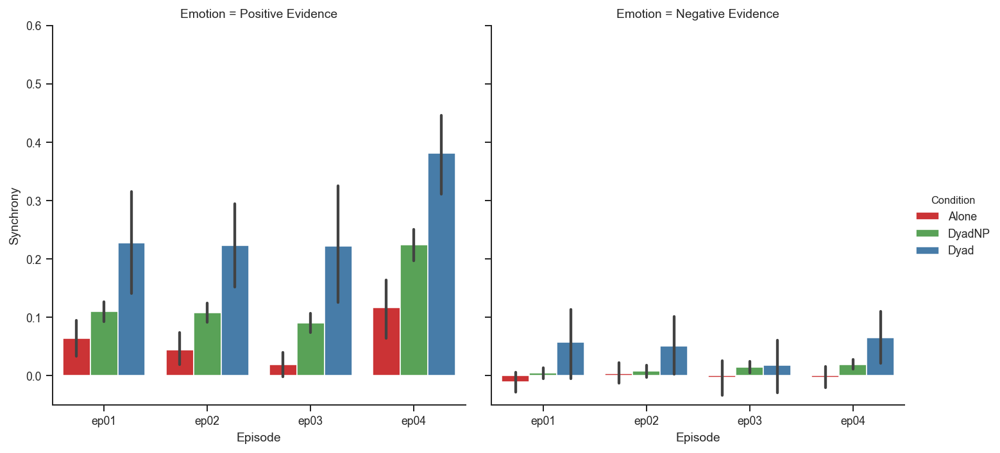

In [222]:
# Figure 1.
sns.factorplot(x='Episode',y='Synchrony',hue='Condition',col='Emotion',hue_order=['Alone','DyadNP','Dyad'],
               units='Sub1',
            data=df.query('(Emotion == "Positive Evidence") | (Emotion == "Negative Evidence")'),ci=95,kind='bar',
            palette=[solocolor,nonpaircolor,dyadcolor]
           )
plt.ylim([-.05,.6]);

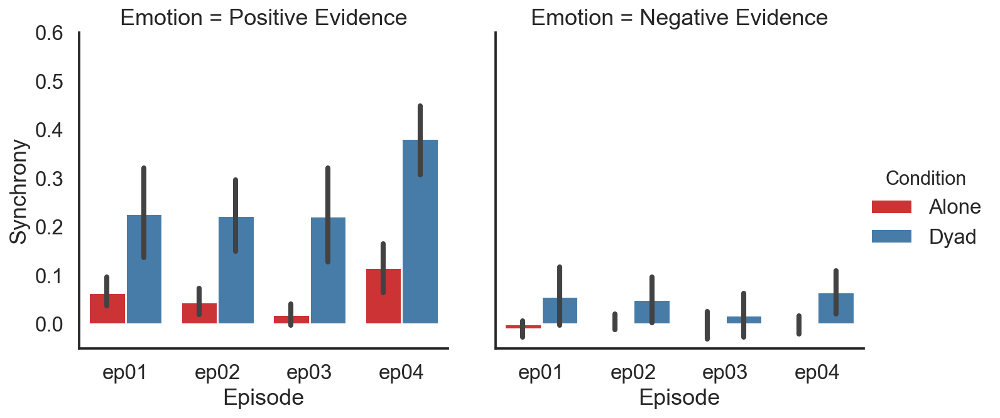

In [15]:
# Figure 1.
f = sns.catplot(x='Episode',y='Synchrony',hue='Condition',col='Emotion',hue_order=['Alone','Dyad'],
               units='Sub1',
            data=df.query('(Emotion == "Positive Evidence") | (Emotion == "Negative Evidence") and Condition!="DyadNP"'),ci=95,kind='bar',
            palette=[solocolor,dyadcolor]
           )
plt.ylim([-.05,.6]);
f.savefig("grant02.pdf")

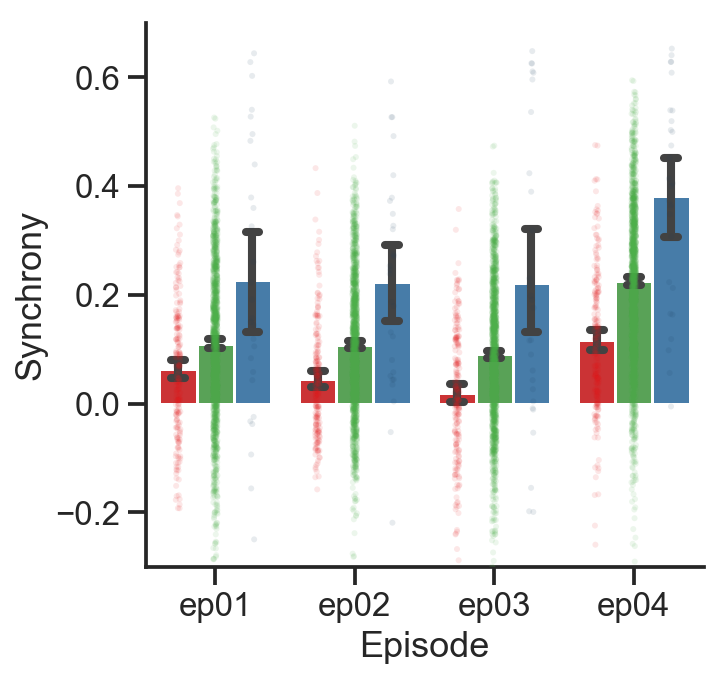

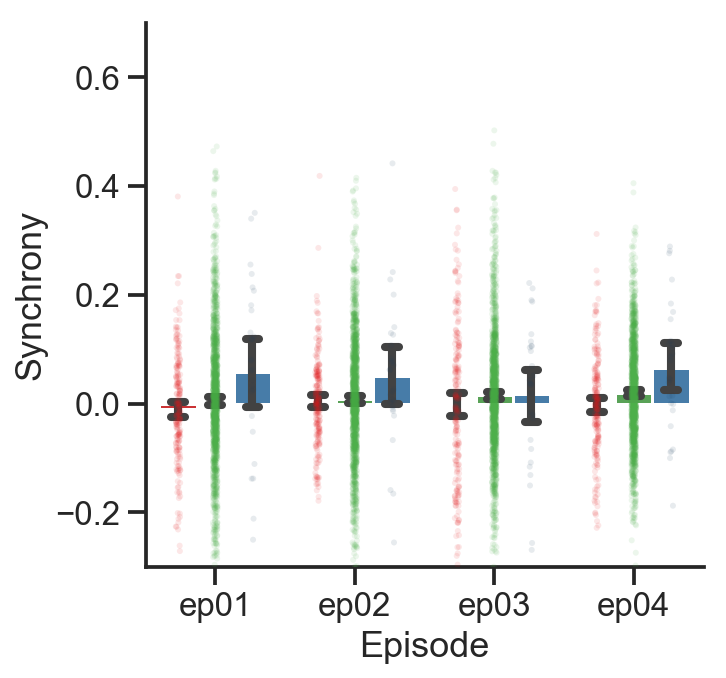

In [818]:
for emotion in ['Positive Evidence', 'Negative Evidence']:
    ax= sns.barplot(x='Episode',y='Synchrony',hue='Condition',hue_order=['Alone','DyadNP','Dyad'],
                data=df.query('(Emotion == @emotion) '),
                palette=[solocolor,nonpaircolor, dyadcolor], dodge=True, capsize=.1)

    db_d = df.query('(Emotion == @emotion) and Condition=="Dyad"')
    db_np = df.query('(Emotion == @emotion) and Condition=="DyadNP"')
    # subsample to match size
    db_a = df.query('(Emotion == @emotion) and Condition=="Alone"')
#     db_a = db_a.sample(n= int(.5*len(db_a)) , replace=False, random_state=1)

    ax= sns.stripplot(x='Episode',y='Synchrony',hue='Condition',hue_order=['Alone','DyadNP','Dyad'],
                data=pd.concat([db_a, db_np, db_d]), jitter=.05, #linewidth=.1,edgecolor='w',
                palette=[np.array(solocolor)*1, np.array(nonpaircolor)*1, np.array(dyadcolor)*.5], zorder=100, dodge=True, alpha = .1, size=3)
    sns.despine()
    ax.get_legend().remove()
    ax.set(ylim=[-.3,.7])
    plt.show()

Subjectwise bootstrap

  2%|▏         | 108/5000 [00:00<00:04, 1077.05it/s]

Positive Evidence


100%|██████████| 5000/5000 [00:05<00:00, 885.08it/s]


ep01: alone:0.06, std:0.13, p:0.00239, 0.01, 0.02
ep01: dyad:0.23, std:0.25 ,p:0.01461, 0.04, 0.06


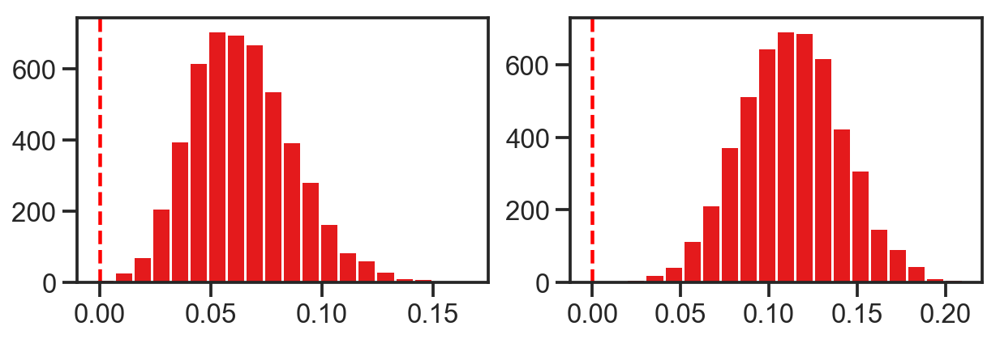

100%|██████████| 5000/5000 [00:05<00:00, 860.18it/s]


ep02: alone:0.04, std:0.11, p:-0.00622, 0.00, 0.01
ep02: dyad:0.22, std:0.19 ,p:0.03073, 0.05, 0.06


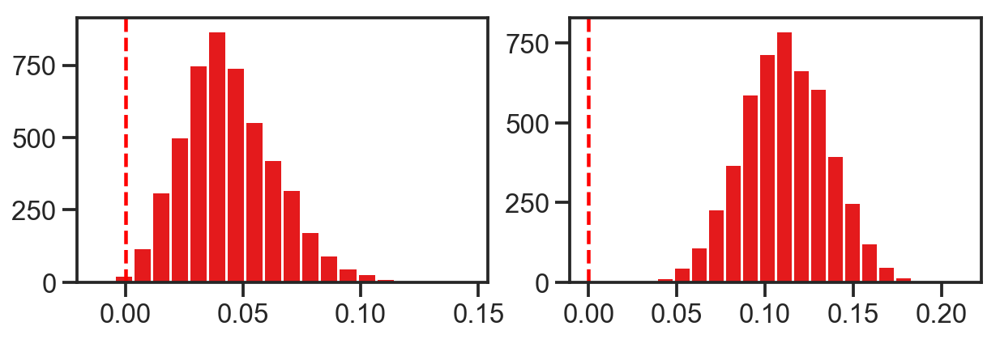

100%|██████████| 5000/5000 [00:05<00:00, 845.24it/s]


ep03: alone:0.02, std:0.12, p:-0.01637, -0.01, -0.00
ep03: dyad:0.22, std:0.27 ,p:0.01608, 0.03, 0.04


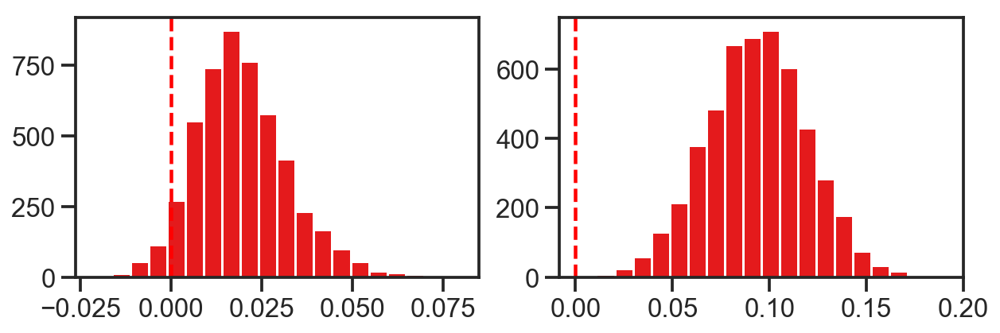

100%|██████████| 5000/5000 [00:05<00:00, 872.95it/s]


ep04: alone:0.12, std:0.13, p:0.03102, 0.04, 0.06
ep04: dyad:0.38, std:0.19 ,p:0.13155, 0.15, 0.17


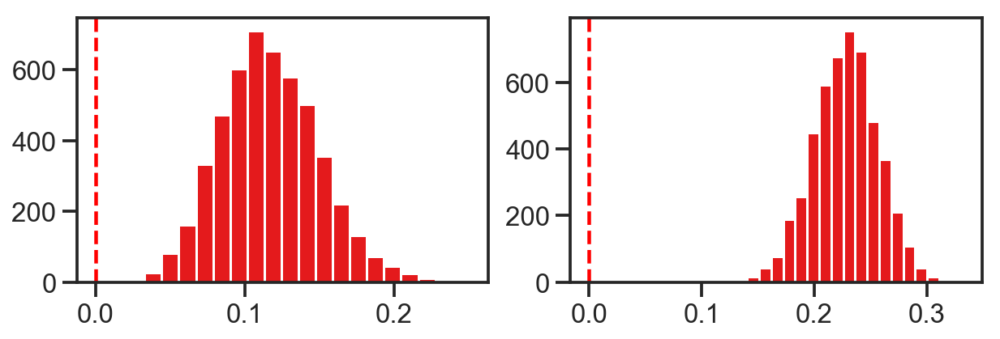

  2%|▏         | 88/5000 [00:00<00:05, 875.19it/s]

Negative Evidence


100%|██████████| 5000/5000 [00:05<00:00, 861.22it/s]


ep01: alone:-0.01, std:0.10, p:-0.04994, -0.04, -0.03
ep01: dyad:0.06, std:0.17 ,p:-0.07706, -0.06, -0.04


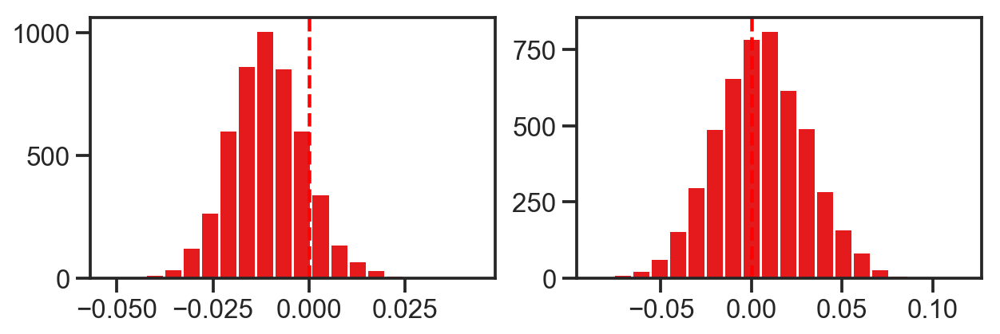

100%|██████████| 5000/5000 [00:05<00:00, 867.50it/s]


ep02: alone:0.00, std:0.08, p:-0.02700, -0.02, -0.01
ep02: dyad:0.05, std:0.13 ,p:-0.06215, -0.05, -0.03


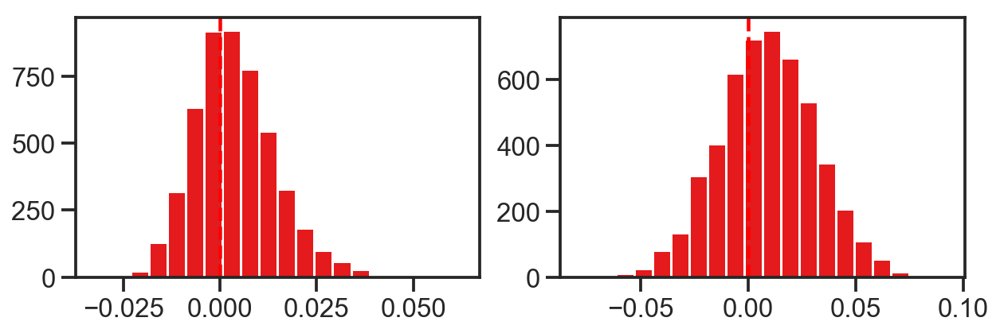

100%|██████████| 5000/5000 [00:05<00:00, 844.53it/s]


ep03: alone:-0.00, std:0.15, p:-0.04864, -0.04, -0.03
ep03: dyad:0.02, std:0.13 ,p:-0.05999, -0.04, -0.03


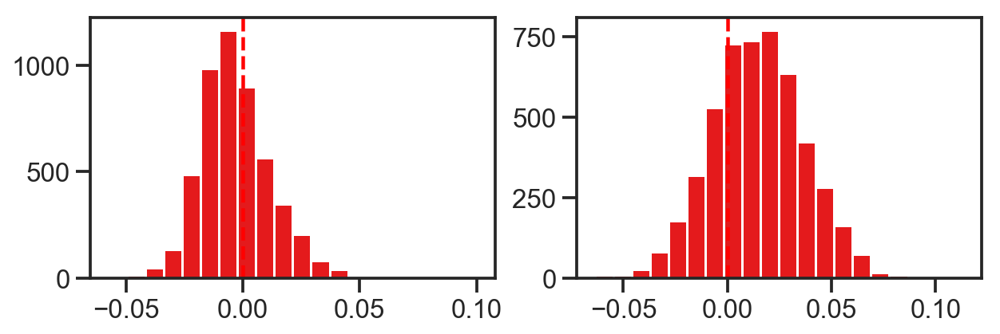

100%|██████████| 5000/5000 [00:06<00:00, 811.65it/s]


ep04: alone:-0.00, std:0.10, p:-0.03327, -0.03, -0.02
ep04: dyad:0.07, std:0.12 ,p:-0.03839, -0.03, -0.02


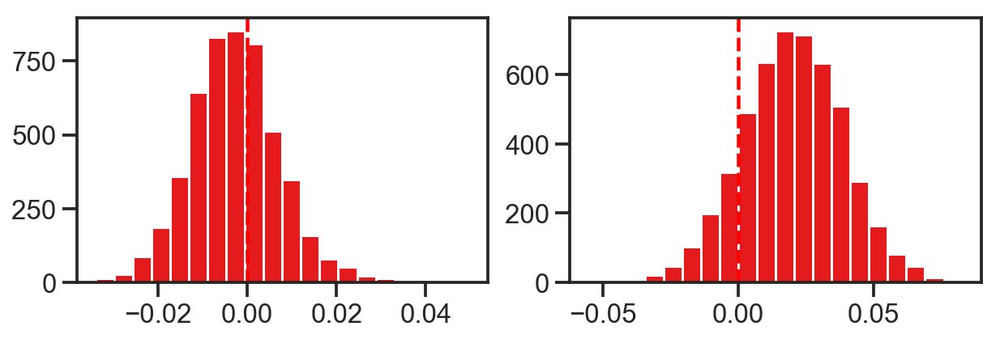

In [849]:
# Subjectwise bootstrapping against 0. Compare the bottom of the 95th, 99th, and 99.9 percentiles.
fisher_transform=False
for evidence_type in ['Positive Evidence', 'Negative Evidence']:
    print(evidence_type)
    for epn in epns:
        a = emdict_solo[epn][evidence_type].corr()
        if fisher_transform:
            a=nlstats.fisher_r_to_z(a)
        pa, ralone = subjectwise_bootstrap(a, condition='upper')
        
        d = emdict_dyad[epn][evidence_type].corr()
        if fisher_transform:
            d=nlstats.fisher_r_to_z(d)
        pdyad, rdyad = subjectwise_bootstrap(d, condition='pairs')    
        
        f,ax = plt.subplots(1,2, figsize=(10,3), sharex=False)
        stats_mean = np.mean(parse_triangle(a, condition='upper'))
        a_alpha05 = np.percentile(ralone, q=2.5)
        a_alpha01 = np.percentile(ralone, q=.5)
        a_alpha001 = np.percentile(ralone, q=.05)
        print(f"{epn}: alone:{stats_mean:.2f}, std:{np.std(parse_triangle(a, condition='upper')):.2f}, p:{a_alpha001:.5f}, {a_alpha01:.2f}, {a_alpha05:.2f}")
        ax[0].hist(ralone,bins=20)
        ax[0].axvline(0,color='r',linestyle='--')
        
        stats_mean = np.mean(parse_triangle(d, condition='pairs'))
        d_alpha05 = np.percentile(rdyad, q=2.5)
        d_alpha01 = np.percentile(rdyad, q=.5)
        d_alpha001 = np.percentile(rdyad, q=.05)
        print(f"{epn}: dyad:{stats_mean:.2f}, std:{np.std(parse_triangle(d, condition='pairs')):.2f} ,p:{d_alpha001:.5f}, {d_alpha01:.2f}, {d_alpha05:.2f}")
        ax[1].hist(rdyad,bins=20)
        ax[1].axvline(0,color='r',linestyle='--')
        plt.show()

In [ ]:
# Test with Circle shifting.
for evidence_type in ['Positive Evidence', 'Negative Evidence']:
    print(evidence_type)
    for epn in epns:
        a = emdict_solo[epn][evidence_type]
        pa, ralone = circle_shift(a, condition='upper')

        d = emdict_dyad[epn][evidence_type]
        pdyad, rdyad = circle_shift(d, condition='pairs')
        
        f,ax = plt.subplots(1,2, figsize=(10,3), sharex=False)
        stats_mean = np.mean(parse_triangle(a.corr(), condition='upper'))
        print(f'{epn} Alone Circle Shift  r: {stats_mean:.2f} pval: ',
              np.round(nlstats._calc_pvalue(np.array(ralone), stats_mean, tail = 2),4))
        ax[0].hist(ralone,bins=20)
        ax[0].axvline(stats_mean,color='r',linestyle='--')
        
        stats_mean = np.mean(parse_triangle(d.corr(), condition='pairs'))
        print(f'{epn} Pair Circle Shift  r: {stats_mean:.2f} pval: ',
              np.round(nlstats._calc_pvalue(np.array(rdyad), stats_mean, tail = 2),4))
        ax[1].hist(rdyad,bins=20)
        ax[1].axvline(stats_mean,color='r',linestyle='--')
        plt.show()
        

  0%|          | 9/5000 [00:00<01:01, 81.65it/s]

Positive Evidence


  2%|▏         | 82/5000 [00:01<01:12, 68.28it/s]

Positive Evidence
ep01 Pair-alone Subject wise permutation (SWP) r: 0.18 pval:  0.0002
ep01 Nonpair-alone Subject wise permutation (SWP) r: 0.05 pval:  0.1384
ep01 Pairs-Nonpair Subject wise permutation (SWP) r: 0.14 pval:  0.0002


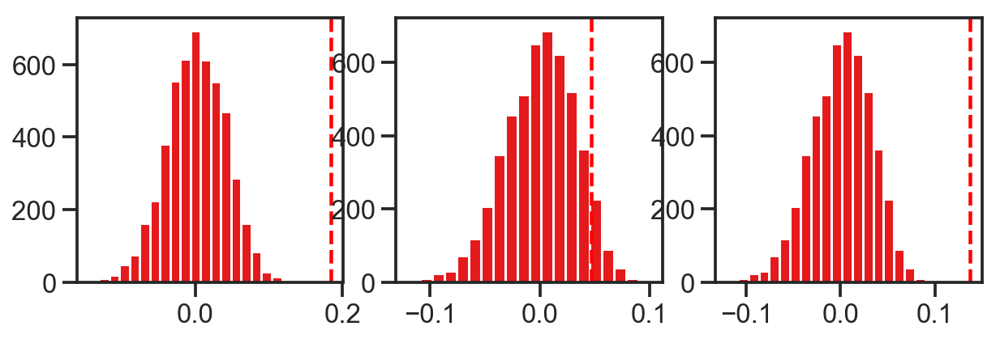

ep02 Pair-alone Subject wise permutation (SWP) r: 0.19 pval:  0.0002
ep02 Nonpair-alone Subject wise permutation (SWP) r: 0.07 pval:  0.0288
ep02 Pairs-Nonpair Subject wise permutation (SWP) r: 0.13 pval:  0.0002


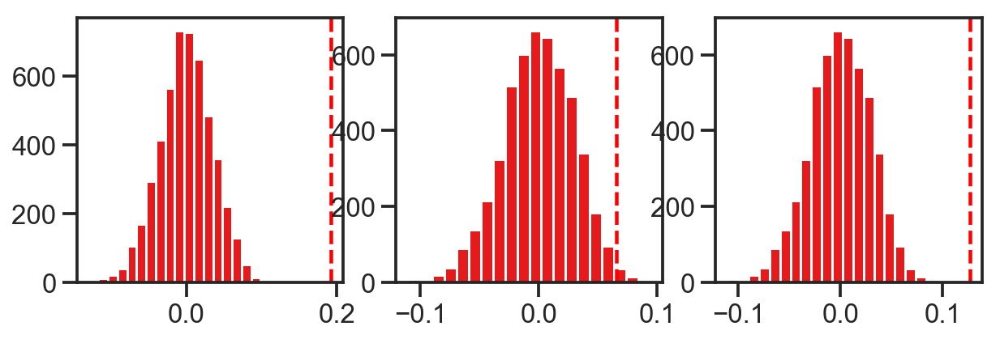

ep03 Pair-alone Subject wise permutation (SWP) r: 0.23 pval:  0.0002
ep03 Nonpair-alone Subject wise permutation (SWP) r: 0.07 pval:  0.0102
ep03 Pairs-Nonpair Subject wise permutation (SWP) r: 0.16 pval:  0.0002


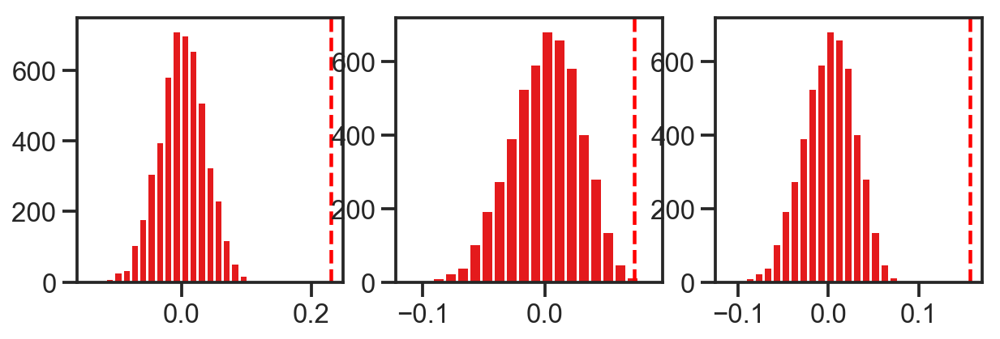

ep04 Pair-alone Subject wise permutation (SWP) r: 0.30 pval:  0.0002
ep04 Nonpair-alone Subject wise permutation (SWP) r: 0.11 pval:  0.0144
ep04 Pairs-Nonpair Subject wise permutation (SWP) r: 0.19 pval:  0.0002


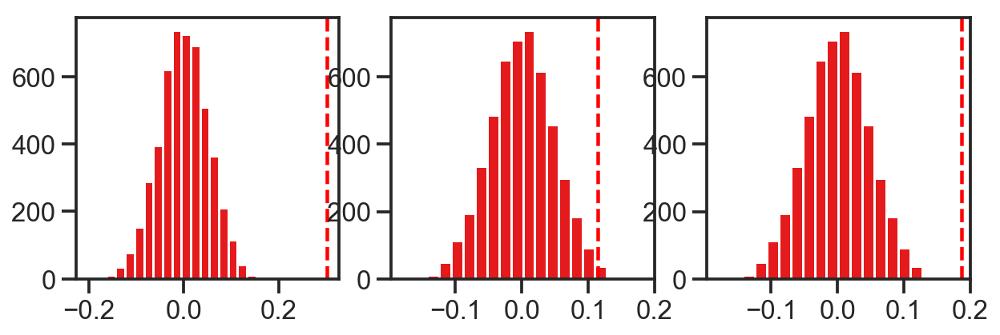

Negative Evidence
ep01 Pair-alone Subject wise permutation (SWP) r: 0.07 pval:  0.0094
ep01 Nonpair-alone Subject wise permutation (SWP) r: 0.02 pval:  0.1654
ep01 Pairs-Nonpair Subject wise permutation (SWP) r: 0.05 pval:  0.0348


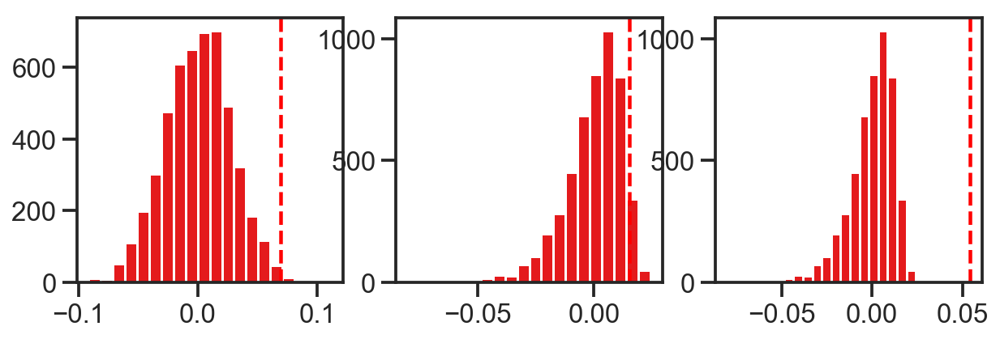

ep02 Pair-alone Subject wise permutation (SWP) r: 0.05 pval:  0.0418
ep02 Nonpair-alone Subject wise permutation (SWP) r: 0.00 pval:  0.7433
ep02 Pairs-Nonpair Subject wise permutation (SWP) r: 0.04 pval:  0.0358


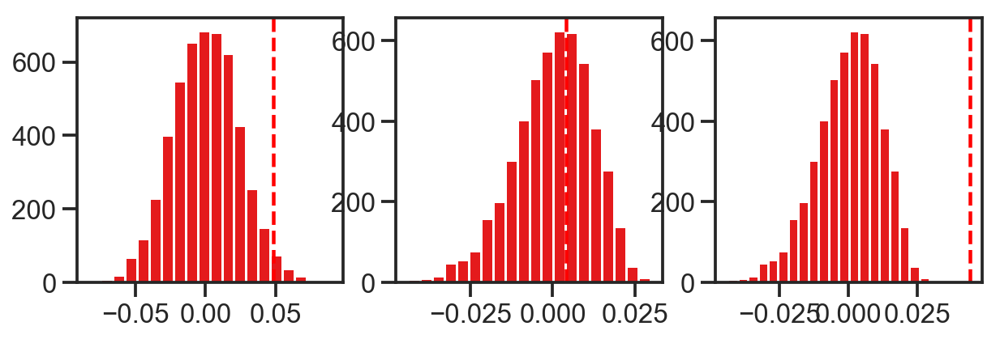

ep03 Pair-alone Subject wise permutation (SWP) r: 0.02 pval:  0.4453
ep03 Nonpair-alone Subject wise permutation (SWP) r: 0.02 pval:  0.1424
ep03 Pairs-Nonpair Subject wise permutation (SWP) r: 0.00 pval:  0.9066


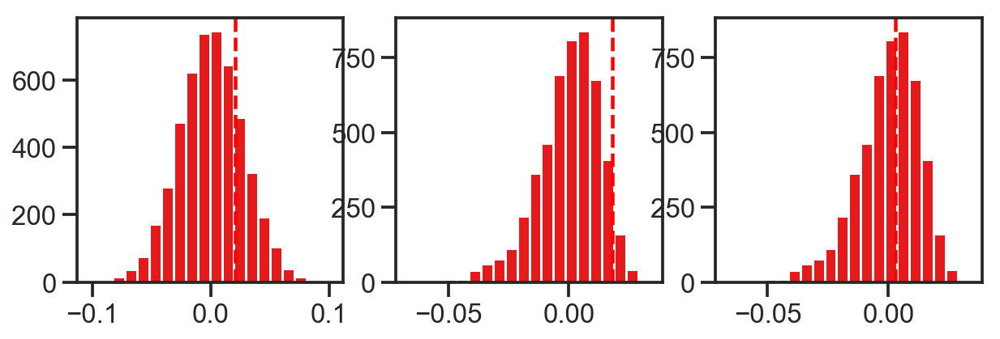

ep04 Pair-alone Subject wise permutation (SWP) r: 0.07 pval:  0.0016
ep04 Nonpair-alone Subject wise permutation (SWP) r: 0.02 pval:  0.0364
ep04 Pairs-Nonpair Subject wise permutation (SWP) r: 0.05 pval:  0.0126


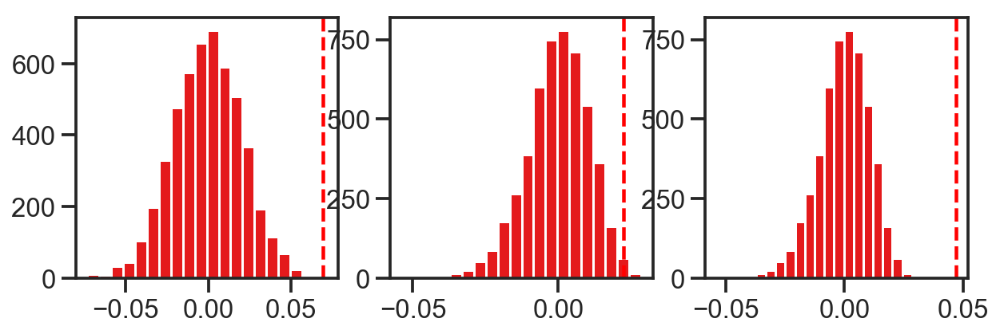

In [845]:
# Subject wise Permutation group difference of faical expression synchrony. Reassign across groups without replacement. 
random_state=1
from sklearn.utils import check_random_state
MAX_INT = np.iinfo(np.int32).max
fisher_transform = True
for emotion in ['Positive Evidence','Negative Evidence']:
    print(emotion)
    for epi, epn in enumerate(['ep01','ep02','ep03','ep04']):
        # generate a combined group matrix of correlations
        fullm = pd.concat([emdict_solo[epn][emotion], emdict_dyad[epn][emotion]],axis=1).corr()
        if fisher_transform:
            fullm = fullm.apply(nlstats.fisher_r_to_z) # Fisher r to z
        data = fullm.copy()
        diffs = []
        n_samples=5000
        n_jobs=-1
        random_state = check_random_state(random_state)
        seeds = random_state.randint(MAX_INT, size=n_samples)
        data_row_id = range(data.shape[0])
        diffs_pairs_alone, diffs_nonpairs_alone, diffs_pairs_nonpairs =[],[],[]
        for i in range(n_samples):
            # matrix permutation, shuffle the groups
            ix = random_state.choice(data_row_id,
                               size=len(data_row_id),
                               replace=False) 
            new_dat = data.iloc[ix,ix]
            new_dyad = new_dat.iloc[21:,21:]
            new_alone = new_dat.iloc[:21,:21]

            pairs = parse_triangle(new_dyad,condition='pairs').mean()
            nonpairs = parse_triangle(new_dyad,condition='nonpairs').mean()
            alone = parse_triangle(new_alone).mean()

            diffs_pairs_alone.append(pairs-alone)
            diffs_nonpairs_alone.append(nonpairs-alone)
            diffs_pairs_nonpairs.append(pairs-nonpairs)

        f,ax = plt.subplots(1,3,figsize=(10,3))

        # pairs - alone
        stats_mean = parse_triangle(fullm.iloc[21:,21:],condition='pairs').mean() - parse_triangle(fullm.iloc[:21,:21]).mean()
        print(f'{epn} Pair-alone Subject wise permutation (SWP) r: {stats_mean:.2f} pval: ',
              np.round(nlstats._calc_pvalue(np.array(diffs_pairs_alone), stats_mean, tail = 2),4))
        ax[0].hist(diffs_pairs_alone,bins=20)
        ax[0].axvline(stats_mean,color='r',linestyle='--')
        # nonpairs-alone
        stats_mean = parse_triangle(fullm.iloc[21:,21:],condition='nonpairs').mean() - parse_triangle(fullm.iloc[:21,:21]).mean()
        print(f'{epn} Nonpair-alone Subject wise permutation (SWP) r: {stats_mean:.2f} pval: ',
              np.round(nlstats._calc_pvalue(np.array(diffs_nonpairs_alone),stats_mean, tail = 2),4))
        ax[1].hist(diffs_nonpairs_alone,bins=20)
        ax[1].axvline(stats_mean,color='r',linestyle='--')
        # pairs - nonpairs
        stats_mean = parse_triangle(fullm.iloc[21:,21:],condition='pairs').mean() - parse_triangle(fullm.iloc[21:,21:],condition='nonpairs').mean()
        print(f'{epn} Pairs-Nonpair Subject wise permutation (SWP) r: {stats_mean:.2f} pval: ',
              np.round(nlstats._calc_pvalue(np.array(diffs_pairs_nonpairs),stats_mean, tail = 2),4))
        ax[2].hist(diffs_nonpairs_alone,bins=20)
        ax[2].axvline(stats_mean,color='r',linestyle='--')    
        plt.show()

### Assess group difference using lmer


In [10]:
# prepare dataframe.
pos_df = df.query('Emotion=="Joy Evidence" and Condition!="DyadNP"') # Alone, Dyad, DyadNP
pos_df['Episode_c'] = pos_df['Episode'].apply(lambda x: int(x[-1])-2.5)
_pos_df = pos_df.copy()
_pos_df['Sub1'] = pos_df['Sub2']
_pos_df['Sub2'] = pos_df['Sub1']
pos_df = pd.concat([pos_df,_pos_df],axis=0).reset_index(drop=True)

/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [60]:
%%R -i pos_df

library(lmerTest)
pos_df$Sub1 <- as.factor(pos_df$Sub1)
pos_df$Sub2 <- as.factor(pos_df$Sub2)
pos_df$Condition <- as.factor(pos_df$Condition)
contrasts(pos_df$Condition)<-c(-.5,.5)
# Dyad - Alone
m <- lmer('Synchrony ~ Condition * Episode_c + (1 + Condition|Sub1) + (1 + Condition|Sub2)', data = pos_df, 
          control = lmerControl(optimizer ="Nelder_Mead"))
# Alone - DyadNP
# m <- lmer('Synchrony ~ Condition * Episode_c + (1+Episode_c|Sub1) + (1+Episode_c|Sub2)', data = pos_df, 
#           control = lmerControl(optimizer ="Nelder_Mead"))
# For Dyad - DyadNP
# m <- lmer('Synchrony ~ Condition + Episode_c + (1 + Condition|Sub1) + (1 + Condition|Sub2)', data = pos_df, 
#           control = lmerControl(optimizer ="Nelder_Mead"))
summary(m)

R[write to console]: boundary (singular) fit: see ?isSingular



Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: 
"Synchrony ~ Condition * Episode_c + (1 + Condition|Sub1) + (1 + Condition|Sub2)"
   Data: pos_df
Control: lmerControl(optimizer = "Nelder_Mead")

REML criterion at convergence: -2417.2

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.0526 -0.6372 -0.0346  0.6467  2.9899 

Random effects:
 Groups   Name        Variance Std.Dev. Corr
 Sub1     (Intercept) 0.00000  0.0000       
          Condition1  0.00548  0.0740    NaN
 Sub2     (Intercept) 0.00944  0.0972       
          Condition1  0.02689  0.1640   0.93
 Residual             0.01447  0.1203       
Number of obs: 1904, groups:  Sub1, 77; Sub2, 77

Fixed effects:
                       Estimate Std. Error         df t value
(Intercept)             0.16244    0.01397   75.81627   11.63
Condition1              0.20258    0.02794   75.81627    7.25
Episode_c               0.02968    0.00383 1804.52510    7.76
Condition1:Episo

In [61]:
# Adjust for degrees of freedom 
tt = 7.25 # t-value
n = 75.81/2 #adjust degrees of freedom
pval = stats.t.sf(np.abs(tt), n-1)*2 
print(pval, n)

1.3395456541479114e-08 37.905


## Figure 1-b. Moment-to-moment synchrony difference between groups

In [3]:
from fnl_tools.stats import find_clustermasses, permute_clustermasses, tstat_threshold

In [7]:
# precompute moving-window correlations ( 1min )
emotion = 'Positive Evidence'
window_size = 30
demedian = False
epns = ['ep01','ep02','ep03','ep04']
seconds = []
rs_dyad, rs_solo, rs_pair, rs_nonpair ={}, {}, {}, {}
print(emotion)            
# get episode lengths
epn_lengths = []
for epn in epns: 
    epn_lengths.append(emdict_solo[epn][emotion].shape[0])
    
for epi, epn in enumerate(epns): 
    dyad_dat = emdict_dyad[epn][emotion]
    solo_dat = emdict_solo[epn][emotion]
    if demedian:
        all_triangle_dyad = dyad_dat-dyad_dat.median()
        all_triangle_solo = solo_dat-solo_dat.median()
        all_triangle_dyad = all_triangle_dyad.rolling(window=window_size,center=True).corr()
        all_triangle_solo = all_triangle_solo.rolling(window=window_size,center=True).corr()
    else:
        all_triangle_dyad = dyad_dat.rolling(window=window_size,center=True).corr()
        all_triangle_solo = solo_dat.rolling(window=window_size,center=True).corr()
    rs_dyad[epn],rs_solo[epn],rs_pair[epn],rs_nonpair[epn] = [],[],[],[]
    for i in np.arange(0,epn_lengths[epi]):
        rs_dyad[epn].append(parse_triangle(all_triangle_dyad.loc[i]))
        rs_pair[epn].append(parse_triangle(all_triangle_dyad.loc[i], 'pairs'))
        rs_nonpair[epn].append(parse_triangle(all_triangle_dyad.loc[i],'nonpairs'))
        rs_solo[epn].append(parse_triangle(all_triangle_solo.loc[i]))
        
# precompute clustermass comparisons
from scipy import stats
tstats = {'pairs_v_solos':{}, 'nonpairs_v_solos': {}, 'dyads_v_solos':{}}
pvals = {'pairs_v_solos':{}, 'nonpairs_v_solos': {}, 'dyads_v_solos':{}}
for epi, epn in enumerate(epns):
    tstats['pairs_v_solos'][epn],tstats['nonpairs_v_solos'][epn],tstats['dyads_v_solos'][epn]=[],[],[]
    pvals['pairs_v_solos'][epn],pvals['nonpairs_v_solos'][epn],pvals['dyads_v_solos'][epn]=[],[],[]
    for i in np.arange(0,emdict_dyad[epn][emotion].shape[0]):
        if (i < 15) or (i > emdict_dyad[epn][emotion].shape[0]-15):
            v0,v1,v2 = np.nan,np.nan,np.nan
            p0,p1,p2 = np.nan,np.nan,np.nan
        else:
            v0,p0 = stats.ttest_ind(
                nlstats.fisher_r_to_z(rs_pair[epn][i]), 
                nlstats.fisher_r_to_z(rs_solo[epn][i])
                    ,equal_var =False,nan_policy='omit')
            v1,p1 = stats.ttest_ind(
                nlstats.fisher_r_to_z(rs_nonpair[epn][i]), nlstats.fisher_r_to_z(rs_solo[epn][i])
                    ,equal_var =False,nan_policy='omit')
            v2,p2 = stats.ttest_ind(
                nlstats.fisher_r_to_z(rs_dyad[epn][i]), nlstats.fisher_r_to_z(rs_solo[epn][i])
                    ,equal_var =False,nan_policy='omit')
        tstats['pairs_v_solos'][epn].append(v0)
        tstats['nonpairs_v_solos'][epn].append(v1)
        tstats['dyads_v_solos'][epn].append(v2)
        pvals['pairs_v_solos'][epn].append(p0)
        pvals['nonpairs_v_solos'][epn].append(p1)
        pvals['dyads_v_solos'][epn].append(p2)

Positive Evidence


In [ ]:
# permute clustermass and save to file. Use pre computed file cause this takes a long time 4 hour / episode.
import json
permuted_masses_per_episode = {}
demedian=False
min_cluster_size=2
epns = ['ep01','ep02','ep03','ep04']
emotion='Positive Evidence'
for epn in epns: 
    dyad_dat = emdict_dyad[epn][emotion]
    solo_dat = emdict_solo[epn][emotion]
    if demedian: 
        dyad_dat = dyad_dat-dyad_dat.median()
        solo_dat = solo_dat-solo_dat.median()

    tstats_true = np.array(tstats['pairs_v_solos'][epn])
    true_clusterMasses,true_locations = find_clustermasses(tstats_true, min_cluster_size=min_cluster_size)
    permuted_masses, top, low = permute_clustermasses(dyad_dat, solo_dat, min_cluster_size, condition='synchrony')
    # save to json file
    with open('sync_'+epn+'.json','w') as fp:
        json.dump({'true_clusterMasses':true_clusterMasses,'true_locations':true_locations,'top':top,'low':low},fp)
    # also save to dict
    permuted_masses_per_episode[epn] = {'true_clusterMasses':true_clusterMasses,'permuted_masses':permuted_masses,'true_locations':true_locations,'top':top,'low':low}

/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/seaborn/timeseries.py:183: UserWarning: The `tsplot` function is deprecated and will be removed in a future release. Please update your code to use the new `lineplot` function.
  warnings.warn(msg, UserWarning)
/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/seaborn/algorithms.py:88: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/seaborn/timeseries.py:309: RuntimeWa

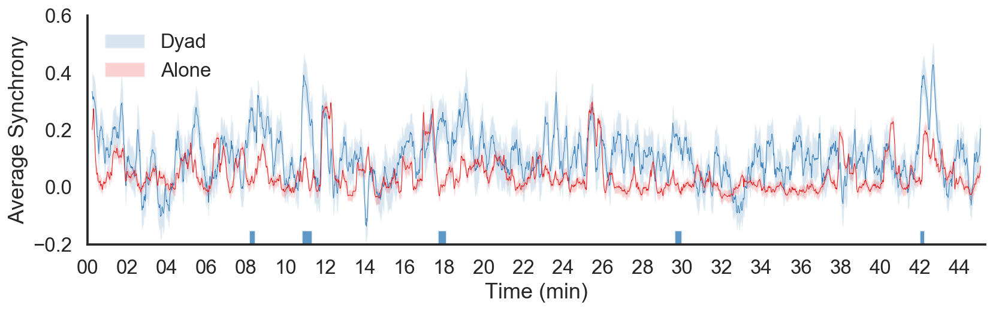

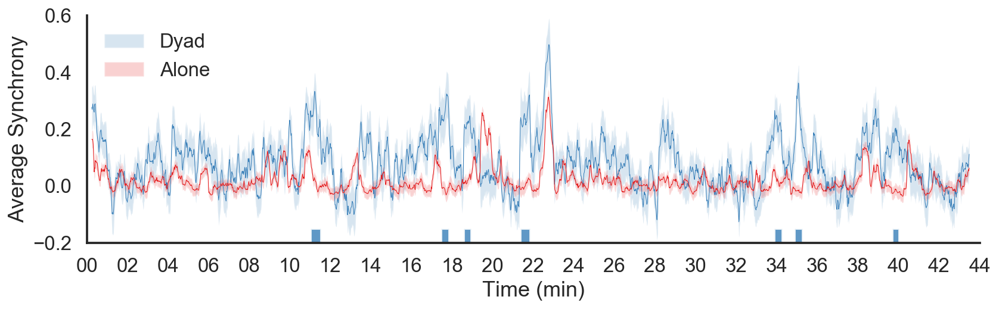

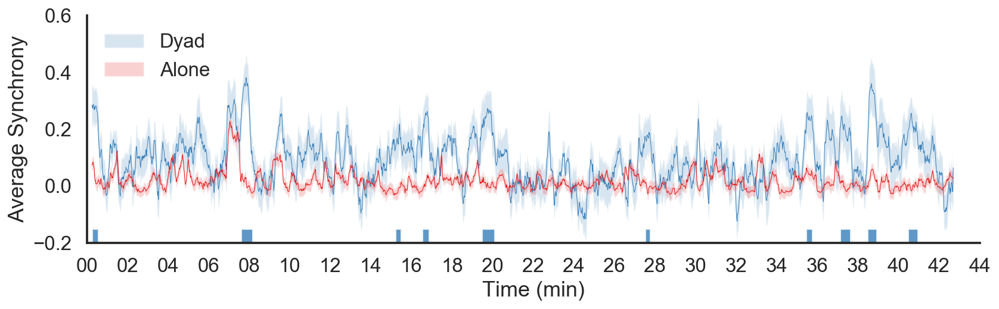

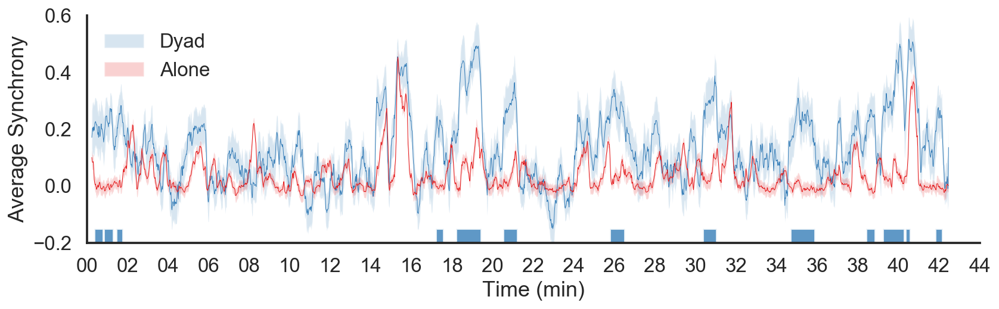

In [2315]:
# Load precomputed data
permuted_masses_per_episode = {}
# epns = ['ep01']
epns = ['ep01','ep02','ep03','ep04']
for epn in epns:
    with open('sync_'+epn+'.json','r') as fp:
        permuted_masses_per_episode[epn] = json.load(fp)
        
# pairs v solos
sns.set_style('white')
sns.set_context('talk')
nboot = 5000
ci = 68
linewidth=.5
tcutoff = 1.96  # p <.05
# tcutoff = 2.64 # p <.01
alpha=.80 # shading
plot_nonpair = False
seconds = []
# epns = ['ep01']
epns = ['ep01','ep02','ep03','ep04']
for epi, epn in enumerate(epns):
    f,ax = plt.subplots(figsize=(12,4))
    sns.tsplot(np.array(rs_pair[epn]).T,estimator=np.nanmean,ci=ci, n_boot=nboot,color=dyadcolor,ax=ax,linewidth=linewidth)
    sns.tsplot(np.array(rs_solo[epn]).T,estimator=np.nanmean,ci=ci, n_boot=nboot,color=solocolor,ax=ax,linewidth=linewidth)

    ax.set_xticks(np.arange(0,len(rs_solo[epn]),60*5))
    ax.set_xticklabels(rec_to_time(ax.get_xticks()))
    tstat = np.nan_to_num(tstats['pairs_v_solos'][epn])
#     ymin, ymax = -.1, .6
    ymin, ymax = -.2, .6
    fillmax = -.15
    
    episode_tstats = tstats['pairs_v_solos'][epn]
    true_locations = permuted_masses_per_episode[epn]['true_locations']
    true_clusterMasses = np.array(permuted_masses_per_episode[epn]['true_clusterMasses'])
    top = permuted_masses_per_episode[epn]['top']
    low = permuted_masses_per_episode[epn]['low']
    
    # plot dyad
    wheres = np.zeros_like(episode_tstats).astype('bool')
    for (start,end) in np.array(true_locations)[true_clusterMasses>top]:
        wheres[start:end] = True
    ax.fill_between(np.arange(0,len(episode_tstats),1),ymin,fillmax,
                   where=wheres,facecolor=dyadcolor,alpha=alpha)
    # plot alone
    wheres = np.zeros_like(episode_tstats).astype('bool')
    for (start,end) in np.array(true_locations)[true_clusterMasses<low]:
        wheres[start:end] = True
    ax.fill_between(np.arange(0,len(episode_tstats),1),ymin,fillmax,
                   where=wheres,facecolor=solocolor,alpha=alpha)
#     ax.set(title=epn.upper())
    ax.set(ylim = [ymin,ymax], xticklabels=rec_to_time(ax.get_xticks()))
    seconds.append([np.sum(tstat_threshold(tstat,-tcutoff,mode='lower')),
                    np.sum(tstat_threshold(tstat,tcutoff,mode='greater'))])
    ax.set(ylim=[ymin,ymax], #title='Episode '+str(epi+1)+': Synchrony Dyad vs Alone', 
               ylabel='Average Synchrony', xlabel = 'Time (min)')
    ax.set_xticks(np.arange(0,2718,120),minor=False)
    ax.set(xticklabels = [tick[:2] for tick in rec_to_time(ax.get_xticks(),TR=1)])
    if plot_nonpair:
        lables = ['Dyad_P','Alone','Dyad_NP']
    else:
        lables = ['Dyad','Alone']
    ax.legend(lables,loc = 2, frameon=False)
    plt.tight_layout()
    sns.despine()
#     plt.savefig('Figures/Filtered_'+epn+'_window_sync.pdf',dpi=300)
    plt.show()

In [1855]:
# Count the number of clusters for dyad higher. 
# Load precomputed data
# permuted_masses_per_episode = {}
# epns = ['ep01']
epns = ['ep01','ep02','ep03','ep04']
for epn in epns:
#     with open('sync_'+epn+'.json','r') as fp:
    with open('sync_'+epn+'.json','r') as fp:
        permuted_masses_per_episode[epn] = json.load(fp)
        
dyad_higher, solo_higher = [], []
dyad_higher_duration, solo_higher_duration = [], []
for epn in epns:
    true_locations = permuted_masses_per_episode[epn]['true_locations']
    true_clusterMasses = np.array(permuted_masses_per_episode[epn]['true_clusterMasses'])
    dyadhigher = np.array(true_clusterMasses)[true_clusterMasses > top]
    solohigher = np.array(true_clusterMasses)[true_clusterMasses < low]
    print(f"{epn}: DyadHigher:{len(dyadhigher)}, SoloHigher:{len(solohigher)}")
    dyad_higher.extend(dyadhigher)
    solo_higher.extend(solohigher)
    dyad_higher_duration.extend(list(map(lambda x: np.diff(x), np.array(true_locations)[true_clusterMasses>top])))        
    solo_higher_duration.extend(list(map(lambda x: np.diff(x), np.array(true_locations)[true_clusterMasses<low])))
    
# # Test if cluster sizes are greater in dyads than solo
# t,p = stats.ttest_ind(np.array(dyad_higher),abs(np.array(solo_higher)),equal_var=False)
# degress_of_freedom = len(np.array(dyad_higher))+len(abs(np.array(solo_higher)))-2
# print(f'Cluster size difference t({degress_of_freedom}):{t}, p:{p} ')

# t,p = stats.ttest_ind(np.array(dyad_higher_duration),abs(np.array(solo_higher_duration)),equal_var=False)
# degress_of_freedom = len(np.array(dyad_higher_duration))+len(abs(np.array(solo_higher_duration)))-2
# print(f'Duration difference t({degress_of_freedom}):{t}, p:{p} ')

ep01: DyadHigher:5, SoloHigher:0
ep02: DyadHigher:7, SoloHigher:0
ep03: DyadHigher:7, SoloHigher:0
ep04: DyadHigher:13, SoloHigher:0


ep01: DyadHigher:5, SoloHigher:0
Joy v Anger: 3.39 0.028
Joy v Disgust: 2.79 0.049
Joy v Fear: 4.27 0.013
Joy v Joy: nan nan
Joy v Sadness: 2.47 0.069
Joy v Surprise: 3.18 0.034


/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


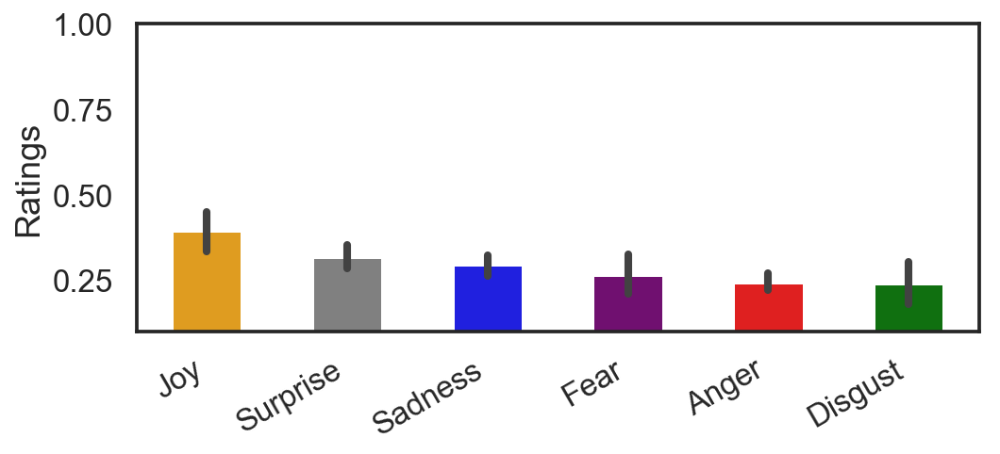

In [2276]:
mturk_clusters = pd.DataFrame()
for epn in ['ep01']:
    true_locations = permuted_masses_per_episode[epn]['true_locations']
    true_clusterMasses = np.array(permuted_masses_per_episode[epn]['true_clusterMasses'])
    dyadhigher = np.array(true_clusterMasses)[true_clusterMasses > top]
    solohigher = np.array(true_clusterMasses)[true_clusterMasses < low]
    print(f"{epn}: DyadHigher:{len(dyadhigher)}, SoloHigher:{len(solohigher)}")
    for (start,end) in np.array(true_locations)[true_clusterMasses > top]:
        mturk_clusters = pd.concat([mturk_clusters, dm.iloc[start:end,:].mean()],axis=1)
        
emotion_color ={}    
emotion_color['Joy'] = "Orange" # Orange
emotion_color['Sadness'] = "Blue"
emotion_color['Disgust'] = "Green"
emotion_color['Fear'] = "Purple"
emotion_color['Anger'] = "Red"
emotion_color['Surprise'] = "Grey"

emotions = ['Anger','Disgust','Fear','Joy','Sadness','Surprise']
f,ax=plt.subplots(figsize=(8,3))
ascending_index = mturk_clusters.T[emotions].mean().sort_values(ascending=False).index
ax = sns.barplot(data=mturk_clusters.T[emotions], order=ascending_index, palette = [emotion_color[emotion] for emotion in ascending_index])
# Change Width of Bars
newwidth = .5
for bar in ax.patches:
    x = bar.get_x()
    width= bar.get_width()
    centre = x + width/2.
    bar.set_x(centre - newwidth/2.)
    bar.set_width(newwidth)
ax.set_xticklabels(ascending_index, rotation=30,ha='right');
ax.set(ylim=[.1,1.], ylabel='Ratings')

for emotion in emotions:
    t,p = stats.ttest_1samp(mturk_clusters.T['Joy'].values-mturk_clusters.T[emotion].values,0)
    print(f"Joy v {emotion}: {t:.2f} {p:.3f}")
    
# f,ax=plt.subplots(figsize=(10,3))
# ascending_index = mturk_clusters.T.mean().sort_values(ascending=False).index
# sns.barplot(data=mturk_clusters.T, order=ascending_index)
# ax.set_xticklabels(ascending_index, rotation=30,ha='right');

In [2311]:
mturk_df_r = (100*mturk_clusters).T[['Anger', 'Disgust', 'Fear', 'Sadness', 'Surprise', 'Joy']].melt(var_name = 'Emotion', value_name = 'Rating')

In [2312]:
%%R -i mturk_df_r
mturk_df_r$Emotion <- as.factor(mturk_df_r$Emotion)
my.helmert = matrix(c(-1/6,-1/6,-1/6,5/6,-1/6,-1/6,-1/5,-1/5,-1/5,0,-1/5,4/5,-1/4,-1/4,-1/4,0,3/4,0,-1/3,-1/3,1/3,0,0,0,1/2,-1/2,0,0,0,0), ncol = 5)
contrasts(mturk_df_r$Emotion) <- my.helmert
print(contrasts(mturk_df_r$Emotion))
summary(lm('Rating ~ Emotion', data=mturk_df_r))

             [,1] [,2]  [,3]     [,4] [,5]
Anger    -0.16667 -0.2 -0.25 -0.33333  0.5
Disgust  -0.16667 -0.2 -0.25 -0.33333 -0.5
Fear     -0.16667 -0.2 -0.25  0.33333  0.0
Joy       0.83333  0.0  0.00  0.00000  0.0
Sadness  -0.16667 -0.2  0.75  0.00000  0.0
Surprise -0.16667  0.8  0.00  0.00000  0.0

Call:
lm(formula = "Rating ~ Emotion", data = mturk_df_r)

Residuals:
   Min     1Q Median     3Q    Max 
-9.971 -2.398 -0.318  2.731 11.397 

Coefficients:
            Estimate Std. Error t value             Pr(>|t|)    
(Intercept)   29.387      1.136   25.86 < 0.0000000000000002 ***
Emotion1      12.140      2.976    4.08              0.00043 ***
Emotion2       5.230      3.047    1.72              0.09896 .  
Emotion3       4.091      3.166    1.29              0.20869    
Emotion4       3.703      4.961    0.75              0.46267    
Emotion5       0.411      3.819    0.11              0.91520    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard 

ep01: DyadHigher:5, SoloHigher:0
Joy v Anger: 11.63 0.000
Joy v Disgust: 12.39 0.000
Joy v Fear: 18.79 0.000
Joy v Joy: nan nan
Joy v Sadness: 10.19 0.000
Joy v Surprise: 11.41 0.000


/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


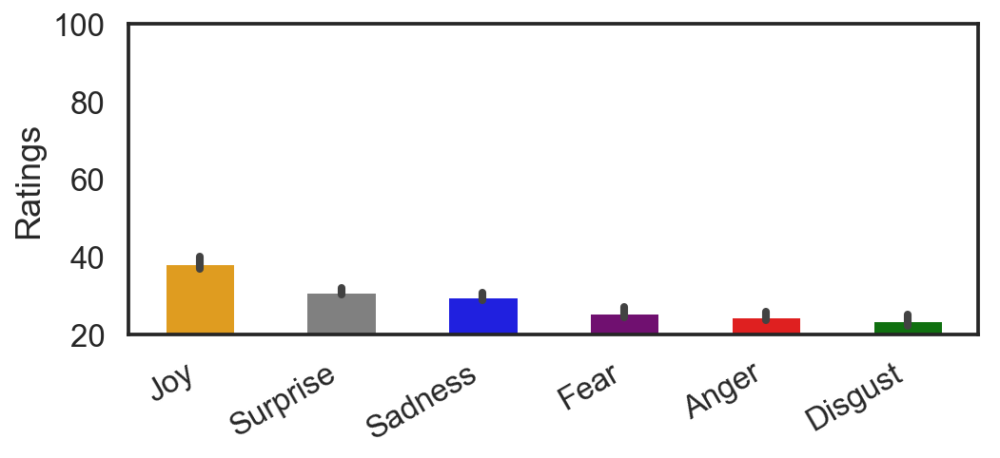

In [2275]:
# Grab all seconds
mturk_clusters = pd.DataFrame()
for epn in ['ep01']:
    true_locations = permuted_masses_per_episode[epn]['true_locations']
    true_clusterMasses = np.array(permuted_masses_per_episode[epn]['true_clusterMasses'])
    dyadhigher = np.array(true_clusterMasses)[true_clusterMasses > top]
    solohigher = np.array(true_clusterMasses)[true_clusterMasses < low]
    print(f"{epn}: DyadHigher:{len(dyadhigher)}, SoloHigher:{len(solohigher)}")
    for (start,end) in np.array(true_locations)[true_clusterMasses > top]:
        mturk_clusters = pd.concat([mturk_clusters, dm.iloc[start:end,:]],axis=0)
        
emotion_color ={}    
emotion_color['Joy'] = "Orange" # Orange
emotion_color['Sadness'] = "Blue"
emotion_color['Disgust'] = "Green"
emotion_color['Fear'] = "Purple"
emotion_color['Anger'] = "Red"
emotion_color['Surprise'] = "Grey"

emotions = ['Anger','Disgust','Fear','Joy','Sadness','Surprise']
f,ax=plt.subplots(figsize=(8,3))
ascending_index = mturk_clusters[emotions].mean().sort_values(ascending=False).index
ax = sns.barplot(data=100*mturk_clusters[emotions], order=ascending_index, palette = [emotion_color[emotion] for emotion in ascending_index])
# Change Width of Bars
newwidth = .5
for bar in ax.patches:
    x = bar.get_x()
    width= bar.get_width()
    centre = x + width/2.
    bar.set_x(centre - newwidth/2.)
    bar.set_width(newwidth)
ax.set_xticklabels(ascending_index, rotation=30,ha='right');
ax.set(ylim=[20,100], ylabel='Ratings')

for emotion in emotions:
    t,p = stats.ttest_1samp(mturk_clusters['Joy'].values-mturk_clusters[emotion].values,0)
    print(f"Joy v {emotion}: {t:.2f} {p:.3f}")
    
# f,ax=plt.subplots(figsize=(10,3))
# ascending_index = mturk_clusters.mean().sort_values(ascending=False).index
# sns.barplot(data=mturk_clusters, order=ascending_index)
# ax.set_xticklabels(ascending_index, rotation=30,ha='right');

## Figure 1-c. mTurk emotion ratings predicting positive synchrony


/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/scipy/linalg/basic.py:1226: RuntimeWarning: internal gelsd driver lwork query error, required iwork dimension not returned. This is likely the result of LAPACK bug 0038, fixed in LAPACK 3.2.2 (released July 21, 2010). Falling back to 'gelss' driver.
  warnings.warn(mesg, RuntimeWarning)
/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


CI [0.06172851 0.39177916]
CI [0.03526388 0.2446297 ]
CI [-0.06358234  0.2316449 ]
CI [-0.12652422  0.15821441]
CI [-0.20864564  0.0392923 ]
CI [-0.18384324  0.13103891]
Joy         0.229603
Disgust     0.136898
Surprise    0.079458
Anger       0.022440
Sadness    -0.084173
Fear       -0.038028
dtype: float64
CI [-0.13507832  0.17706498]
CI [-0.07692067  0.21178621]
CI [0.02555093 0.24760788]
CI [-0.21444228  0.16375892]
CI [-0.36033061 -0.04789622]
CI [-0.18830736  0.11906999]
CI [-0.10949398  0.22497376]
CI [-0.23416275  0.06084095]
CI [-0.3192352   0.09740749]
CI [0.0815782 0.3993713]
CI [-0.11164224  0.16215393]
CI [-0.11271029  0.1846296 ]
CI [-0.19555022  0.03320933]
CI [-0.17226823  0.14527206]
CI [-0.23429795 -0.02244212]
CI [-0.05927762  0.21207161]


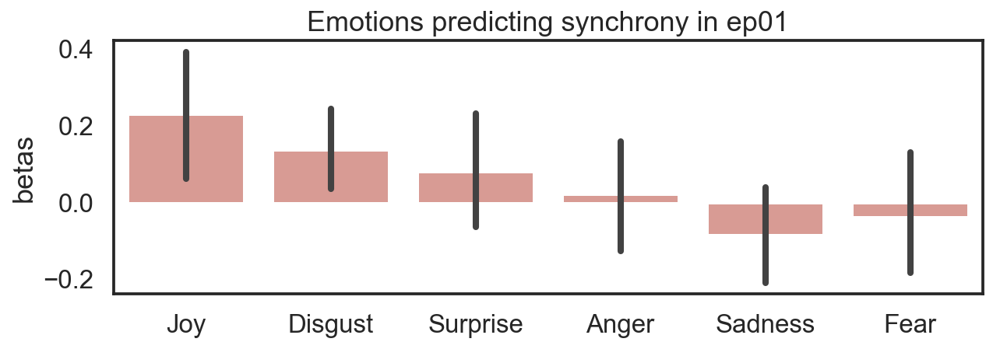

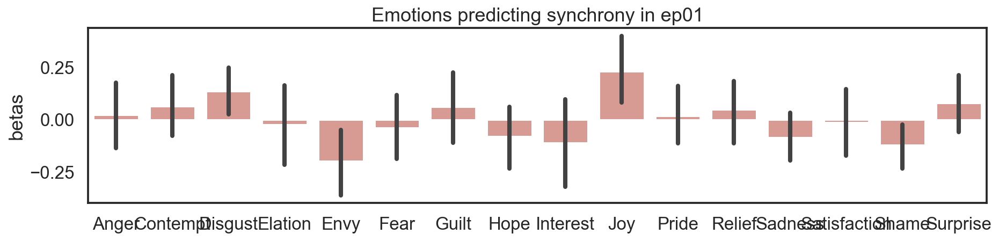

In [8]:
# Load emotion rating data from mTurk 
df = pd.read_csv('../../Data/mTurkRatings/mTurkRatings_long.csv',names=['rating','time','emotion','subID'])
df = df.replace({-1:np.nan})
df['dmrating'] = df.groupby('subID').transform(lambda x: x-x.mean())['rating']
df_short = pd.pivot_table(df,values =['rating'],index=['time'],columns=['emotion','subID'])
df_short = df_short.replace({-1:np.nan})
window = 30
emotions = ['Anger', 'Contempt', 'Disgust', 'Elation', 'Envy', 'Fear', 'Guilt',
       'Hope', 'Interest', 'Joy', 'Pride', 'Relief', 'Sadness', 'Satisfaction',
       'Shame', 'Surprise']
# emotions = ['Anger','Disgust','Fear','Joy','Sadness','Surprise']
dm = pd.DataFrame(index=range(0,2718))
for ix, emotion in enumerate(emotions):
    meandf = df_short.loc[:,'rating'][emotion].mean(axis=1)
    # set to zero indexing 
    meandf.index = meandf.index-1
    dm[emotion] = meandf/100
dm = dm.interpolate(method='linear',axis=0).rolling(window=window,center=True).mean()

from sklearn.linear_model import LinearRegression
epn = 'ep01'
Y = pd.DataFrame(rs_pair[epn])
coefs = []
noDyads = int(dyad_dat.shape[1]/2)
for pairix in range(noDyads):
    y = Y.iloc[:,pairix]
    X = dm.copy()
    notna = ~(y.isna() | X.isna().any(axis=1))
    lm = LinearRegression()
    lm.fit(X[notna],y[notna])
    coefs.append(lm.coef_)

f,ax = plt.subplots(figsize=(10,3))
sns.barplot(data = pd.DataFrame(coefs,columns=dm.columns)[['Joy','Disgust','Surprise','Anger','Sadness','Fear']],ci=95,color='salmon',saturation=.5)
ax.set(title=f'Emotions predicting synchrony in {epn}',ylabel='betas')
[print('CI',line.get_data()[1]) for line in ax.lines];
f,ax = plt.subplots(figsize=(15,3))
sns.barplot(data = pd.DataFrame(coefs,columns=dm.columns),ci=95,color='salmon',saturation=.5)
ax.set(title=f'Emotions predicting synchrony in {epn}',ylabel='betas')
print(pd.DataFrame(coefs,columns=dm.columns)[['Joy','Disgust','Surprise','Anger','Sadness','Fear']].mean())
[print('CI',line.get_data()[1]) for line in ax.lines];

In [9]:
emotions = ['Anger','Disgust','Fear','Joy','Sadness','Surprise']
dm = pd.DataFrame(index=range(0,2718))
for ix, emotion in enumerate(emotions):
    meandf = df_short.loc[:,'rating'][emotion].mean(axis=1)
    # set to zero indexing 
    meandf.index = meandf.index-1
    dm[emotion] = meandf/100
    print(emotion, dm[emotion].notna().sum())
dm = dm.interpolate(method='linear',axis=0).rolling(window=window,center=False).mean()

Anger 543
Disgust 558
Fear 664
Joy 888
Sadness 765
Surprise 918


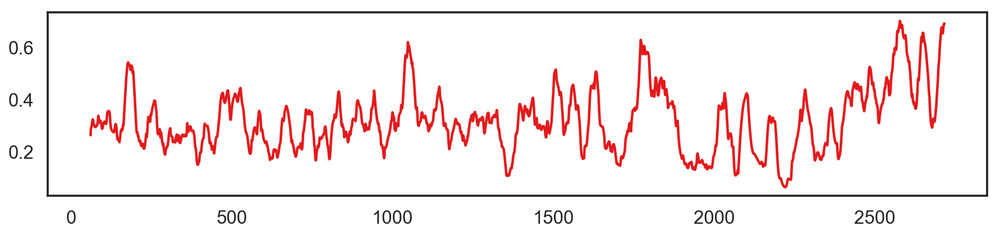

In [145]:
f,ax=plt.subplots(figsize=(15,3))
dm['Joy'].plot(ax=ax)

In [13]:
'''
Snippet to calculate Pearson correlation with emotion with Positive synchrony
'''
y = pd.Series(np.nanmean(rs_pair['ep01'],axis=1))
X = dm.Joy
notna = ~(y.isna() | X.isna())
print(stats.pearsonr(X[notna],y[notna]))

y = pd.Series(np.nanmean(rs_solo['ep01'],axis=1))
X = dm.Joy
notna = ~(y.isna() | X.isna())
print(stats.pearsonr(X[notna],y[notna]))

(0.24157390114176164, 1.373019177948745e-36)
(0.2229049061738034, 2.863680674090905e-31)


/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: Mean of empty slice
  if __name__ == '__main__':


# Connection predictions with emotion synchrony
## Figure 2-a. Positive & negative synchrony predicting connection ratings

ep01 rho :  0.37937523662479594 p :  0.04647169638832713
ep02 rho :  0.5770945301431022 p :  0.0013039904389288341
ep03 rho :  0.7182587332208666 p :  1.677403275383703e-05
ep04 rho :  0.6718075865531576 p :  9.054683457558923e-05


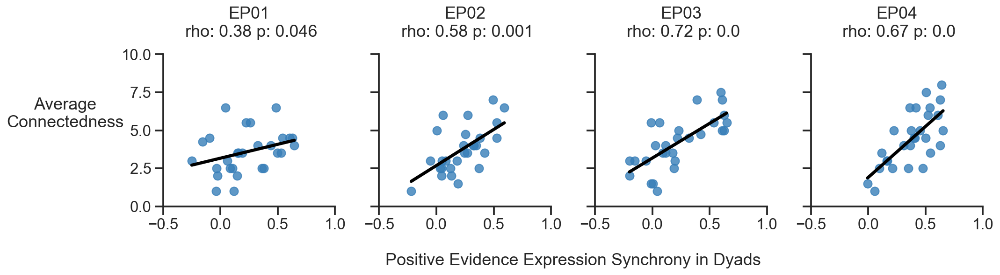

ep01 rho :  0.08415232521495472 p :  0.6702922164186618
ep02 rho :  -0.023655924495856434 p :  0.9048912754286917
ep03 rho :  0.22869929813997744 p :  0.2417664247457743
ep04 rho :  0.395164757215263 p :  0.03741125579354444


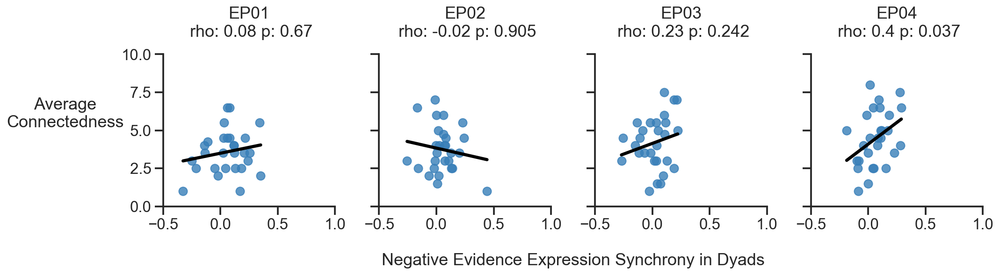

In [106]:
# Connectedness highly correlated with Synchrony.  
exclude_friends = False
sns.set_style("ticks")
sns.set_context('talk')
for emotion in ['Positive Evidence', 'Negative Evidence']:
    epns = ['ep01','ep02','ep03','ep04']
    dyad_expressivity, dyadpair_expressivity = [],[]
    f,ax = plt.subplots(1,len(epns),figsize=(15,5),sharex=True,sharey=True)
    ax[0].set_ylim([0,10])
    ax[0].set_xlim([-.5,1])
    rdf = pd.DataFrame()
    for i, epn in enumerate(epns):
        joydf = emdict_dyad[epn][emotion]
        dyadcorr = nlstats.fisher_r_to_z(np.diag(joydf.corr(),k=1)[range(0,noDyads*2,2)])
        dyadcorr = np.diag(joydf.corr(),k=1)[range(0,noDyads*2,2)]
        dyadconn = connection[epn]
        dyads_friends_bool = ~connection['ep01'].index.isin(dyads_friends)
        if exclude_friends:
            # Results still hold without friends.
            dyadcorr = dyadcorr[dyads_friends_bool]
            dyadconn = dyadconn[dyads_friends_bool]
        r, p = stats.spearmanr(dyadconn, dyadcorr)
        print(epn, 'rho : ',r,'p : ',p)
        ax[i].set_title(epn.upper()+'\n rho: '+ str(np.round(r,2))  +' p: ' + str(np.round(p,3)),y=1.08)
        sns.regplot(y = dyadconn.values,x = dyadcorr,ax=ax[i],color='k',ci=False,truncate=True,scatter_kws={'color':colors[1]})
        rdf = pd.concat([rdf, pd.DataFrame({'dyadID':dyadconn.index.values, 'Episode': np.repeat(epn,len(dyadconn)),
                                            'Session': np.repeat(i-1.5,len(dyadconn)),'Connection': dyadconn.values,
                                            'Synchrony':dyadcorr})])

    ax[0].set_ylabel('Average\nConnectedness',rotation=0,labelpad=60)
    # for common label
    f.add_subplot(111, frameon=False)
    # plt.tick_params(which='both',labelcolor='none', top='off', bottom='off', left='off', right='off')
    plt.gca().xaxis.set_major_locator(plt.NullLocator())
    plt.gca().yaxis.set_major_locator(plt.NullLocator())
    plt.grid(False)
    plt.xlabel(f'{emotion} Expression Synchrony in Dyads',rotation=0,labelpad=50)
    sns.despine()
    plt.tight_layout()
    # f.savefig('Figures/Synchrony_corr_connectedness.pdf',dpi=300)
    plt.show()

In [38]:
# bootstrap effect size 
# Connectedness highly correlated with Synchrony.  
exclude_friends = False
sns.set_style("ticks")
sns.set_context('talk')
for emotion in ['Negative Evidence']:
    epns = ['ep01','ep02','ep03','ep04']
    dyad_expressivity, dyadpair_expressivity = [],[]
    rdf = pd.DataFrame()
    for i, epn in enumerate(epns):
        joydf = emdict_dyad[epn][emotion]
        dyadcorr = nlstats.fisher_r_to_z(np.diag(joydf.corr(),k=1)[range(0,noDyads*2,2)])
        dyadcorr = np.diag(joydf.corr(),k=1)[range(0,noDyads*2,2)]
        dyadconn = connection[epn]
        dyads_friends_bool = ~connection['ep01'].index.isin(dyads_friends)
        if exclude_friends:
            # Results still hold without friends.
            dyadcorr = dyadcorr[dyads_friends_bool]
            dyadconn = dyadconn[dyads_friends_bool]
        r, p = stats.spearmanr(dyadconn, dyadcorr)
        print(epn, 'rho : ',r,'p : ',p)


ep01 rho :  0.08415232521495472 p :  0.6702922164186618
ep02 rho :  -0.023655924495856434 p :  0.9048912754286917
ep03 rho :  0.22869929813997744 p :  0.2417664247457743
ep04 rho :  0.395164757215263 p :  0.03741125579354444


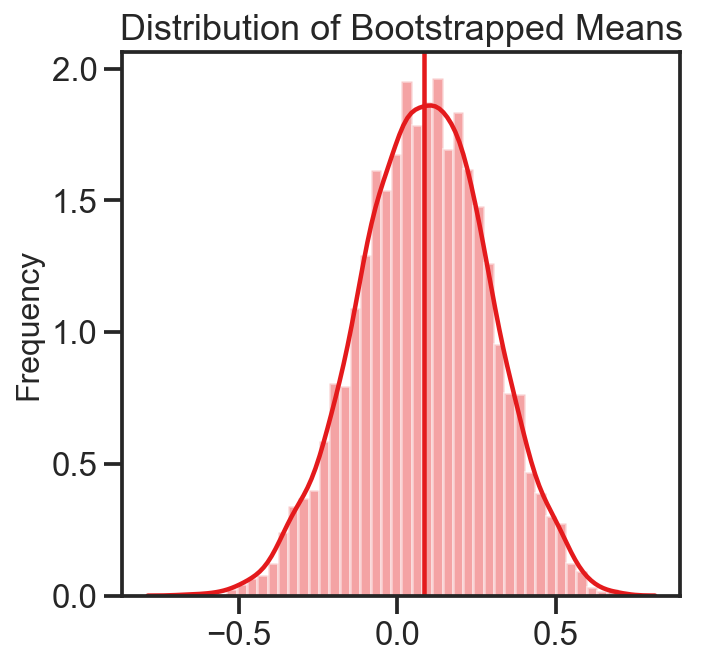

Bootstrapped Mean: 0.0831
Bootstrapped Std: 0.204
95% Confidence Intervals: [-0.331, 0.479]


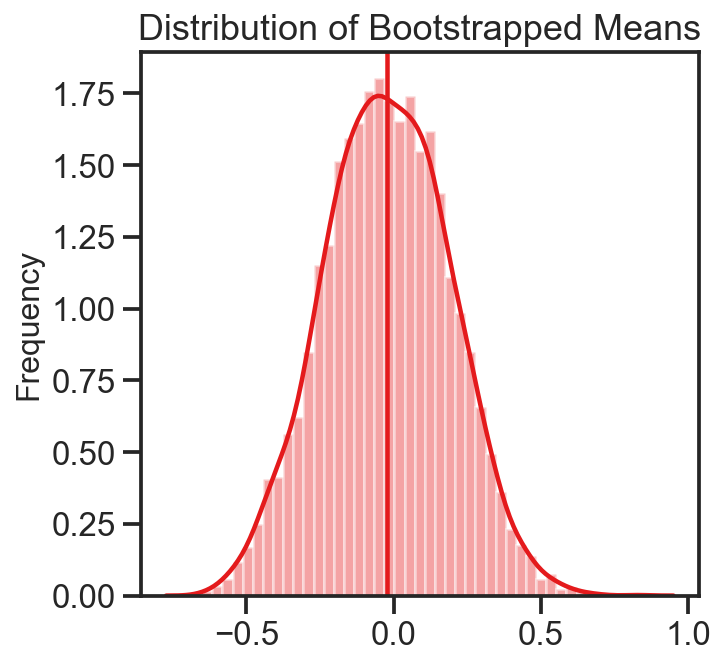

Bootstrapped Mean: -0.0229
Bootstrapped Std: 0.212
95% Confidence Intervals: [-0.436, 0.385]


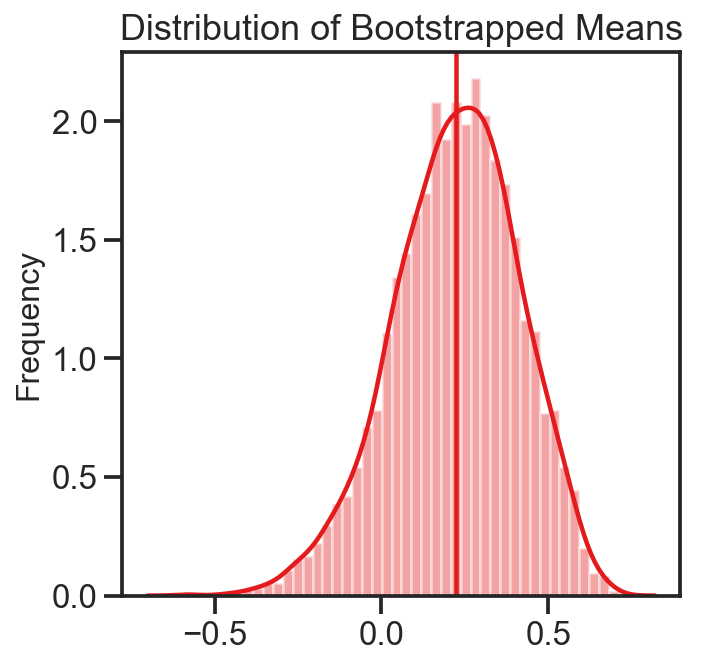

Bootstrapped Mean: 0.223
Bootstrapped Std: 0.189
95% Confidence Intervals: [-0.179, 0.563]


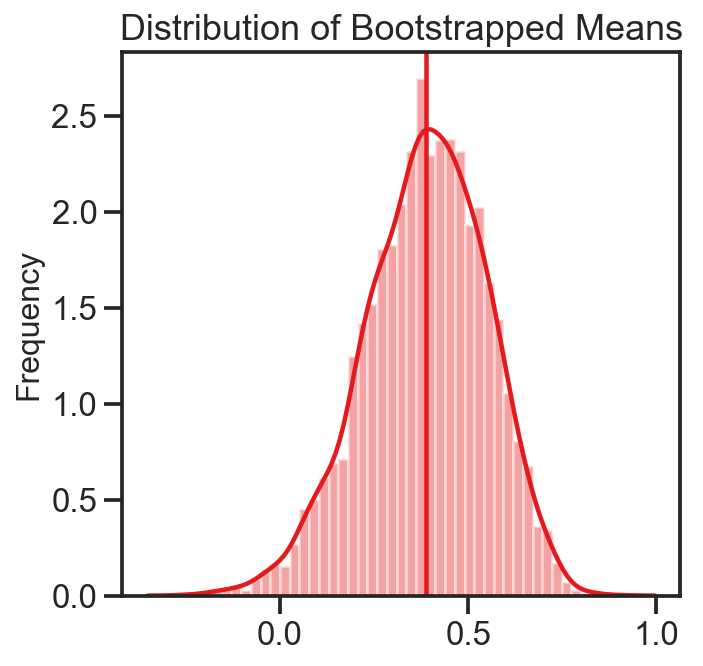

Bootstrapped Mean: 0.387
Bootstrapped Std: 0.161
95% Confidence Intervals: [0.0512, 0.676]


In [39]:
indices = np.array(range(len(dyadcorr)))
epns = ['ep01','ep02','ep03','ep04']
for i, epn in enumerate(epns):
    joydf = emdict_dyad[epn][emotion]
    dyadcorr = nlstats.fisher_r_to_z(np.diag(joydf.corr(),k=1)[range(0,noDyads*2,2)])
    dyadcorr = np.diag(joydf.corr(),k=1)[range(0,noDyads*2,2)]
    dyadconn = connection[epn]
    dyads_friends_bool = ~connection['ep01'].index.isin(dyads_friends)
    if exclude_friends:
        # Results still hold without friends.
        dyadcorr = dyadcorr[dyads_friends_bool]
        dyadconn = dyadconn[dyads_friends_bool]
    bootstrap_means = []
    for i in range(5000):
        new_indices = np.random.choice(indices, size=len(indices), replace=True)
        r, p = stats.spearmanr(dyadconn.values[new_indices], dyadcorr[new_indices])
        bootstrap_means.append(r)
    
    sns.distplot(bootstrap_means, kde=True, label='Bootstrap')
    plt.axvline(x=np.mean(bootstrap_means), ymin=0, ymax=1, linestyle='-')
    plt.title('Distribution of Bootstrapped Means', fontsize=18)
    plt.ylabel('Frequency', fontsize=16)
    plt.show()

    lower_bound = np.percentile(bootstrap_means, 2.5)
    upper_bound = np.percentile(bootstrap_means, 97.5)
    print(f'Bootstrapped Mean: {np.mean(bootstrap_means):.3}')
    print(f'Bootstrapped Std: {np.std(bootstrap_means):.3}')
    print(f'95% Confidence Intervals: [{lower_bound:.3}, {upper_bound:.3}]')

## Figure 2-b. Ridge regression predicting connectedness with synchrony of 6 emotions

0it [00:00, ?it/s]/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/scipy/stats/stats.py:3003: RuntimeWarning: invalid value encountered in double_scalars
  r = r_num / r_den
28it [00:00, 919.48it/s]
/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


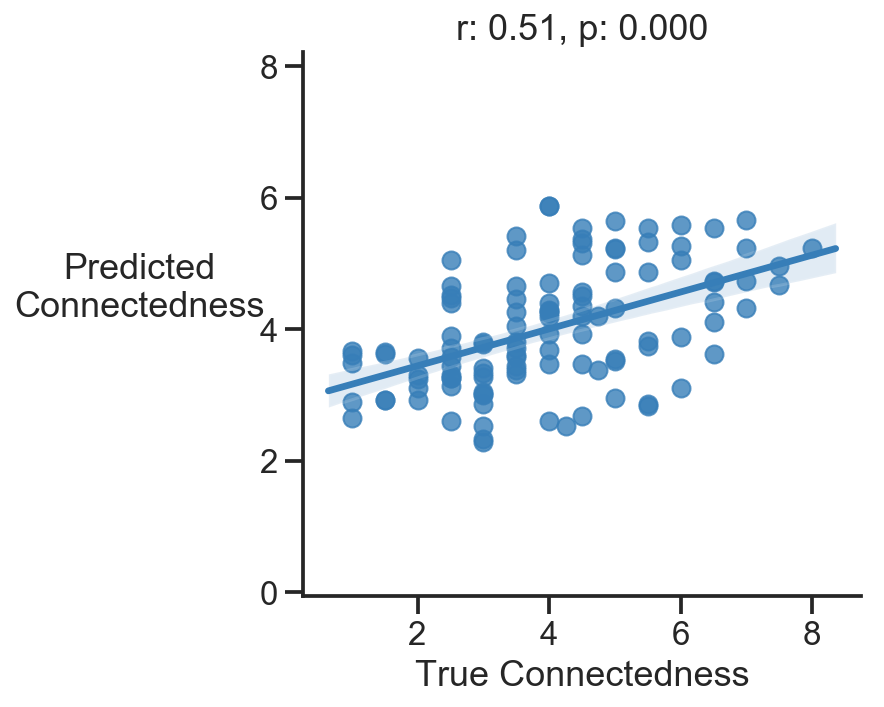

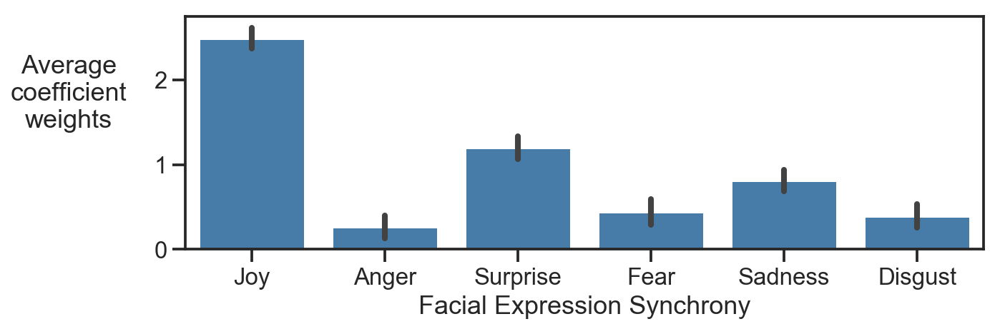

In [7]:
# prepare dataframe. 
import pandas as pd
ztransform = False
audf = pd.DataFrame()
emlist = emdict_dyad['ep01'].keys()
for au in emlist:
    _audf = []
    for i, epn in enumerate(['ep01','ep02','ep03','ep04']):
        # grab diagonal of all AU correlations. 
        _audf.extend(parse_triangle(emdict_dyad[epn][au].corr(),condition='pairs'))
    audf[au] =_audf
mean_synchrony_all_aus = pd.DataFrame(audf.mean(axis=1),columns=['mean_sync_all_aus'])

# Use R for Group random effect analysis 
allconns, allenjoy, allenjoy_diff, allcorrs,dyadIDs  = [],[],[],[],[]
groups = list(np.arange(0,noDyads)) * 4
epns = np.repeat(['ep01','ep02','ep03','ep04'],noDyads )
for i, epn in enumerate(['ep01','ep02','ep03','ep04']):
    allconns.extend(connection[epn])
    allenjoy.extend(enjoy[epn])
    allenjoy_diff.extend(enjoy_diff[epn])
    dyadIDs.extend(['s'+str(i).zfill(3) for i in connection[epn].index])
r_df = pd.DataFrame({'mean_Connection': allconns, 
                     'mean_Enjoy': allenjoy, 'diff_Enjoy':allenjoy_diff ,
                     'Groups':groups, 'Episode': epns, 'dyadID':dyadIDs })
if ztransform:
    r_df = pd.concat([r_df, audf, nlstats.fisher_r_to_z(mean_synchrony_all_aus)],axis=1)
else:
    r_df = pd.concat([r_df, audf, mean_synchrony_all_aus],axis=1)
r_df.columns = [col.replace(' Evidence','') for col in r_df.columns]
r_df = pd.concat([r_df,pd.get_dummies(r_df.Episode).astype('bool')],axis=1)

from sklearn.linear_model import RidgeCV
from sklearn.model_selection import LeaveOneGroupOut, LeavePGroupsOut, GroupKFold
# features = ['Joy']
features = ['Joy', 'Anger', 'Surprise', 'Fear', 'Sadness', 'Disgust']
X = r_df[features].as_matrix()
y = r_df[['mean_Connection']].values.ravel()
groups = r_df['dyadID'].values.ravel()
# logo = LeaveOneGroupOut()
logo = LeavePGroupsOut(n_groups=1)
# logo = GroupKFold(n_splits=10)

true_ys = []
predicted_ys=[]
coefs = []
eachrs = []
for train_ix, test_ix in tqdm(logo.split(X,y,groups)):
    X_train, X_test = X[train_ix], X[test_ix]
    y_train, y_test = y[train_ix], y[test_ix]
    clf = RidgeCV(alphas=[.1, 1., 10.], fit_intercept=True, normalize=False)
    clf.fit(X_train,y_train)
    coefs.append(clf.coef_)
    predicted_ys.extend(clf.predict(X_test))
    true_ys.extend(y_test)
    r1, p1 = stats.pearsonr(clf.predict(X_test),y_test)
    eachrs.append(r1)
r, p = stats.pearsonr(predicted_ys,true_ys)

_df  = pd.DataFrame({'pred':predicted_ys,'true':true_ys, #'group':np.sort(groups)
                    })
ax = sns.regplot(x='true',y='pred',data=_df,line_kws={'color':dyadcolor},scatter_kws={'color':dyadcolor})
ax.set_ylabel('Predicted\nConnectedness',rotation=0,labelpad=60)
ax.set(xlabel='True Connectedness', title=f'r: {r:.2f}, p: {p:.3f}')
sns.despine();
plt.axis('equal');

f,ax = plt.subplots(figsize=(10,3))
_df = pd.DataFrame(coefs, columns=features)
sns.barplot(x='variable',y='value',data=_df.melt(),color=dyadcolor, ci='sd')
# sns.stripplot(x='variable',y='value',data=_df.melt(), color='k',alpha=1, s=3)

ax.set_xticklabels(features,rotation=0)
ax.set_ylabel('Average\ncoefficient\nweights',rotation=0,labelpad=60)
ax.set_xlabel('Facial Expression Synchrony');
# ax.set(ylim=[-.1,3.5])

#  Test if coefficient is different from zero
# print('Testing if coefficients are significant from 0',stats.ttest_1samp(coefs,0))

/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/numpy/lib/function_base.py:3826: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)


0.35480986468884657 [nan nan nan]
Joy [2.19117514 2.70455039]
Anger [4.22981468e-04 5.71488819e-01]
Surprise [0.8851292  1.38911477]
Fear [0.18596549 0.72802166]
Sadness [0.53190065 1.03480734]
Disgust [0.14177052 0.66570748]


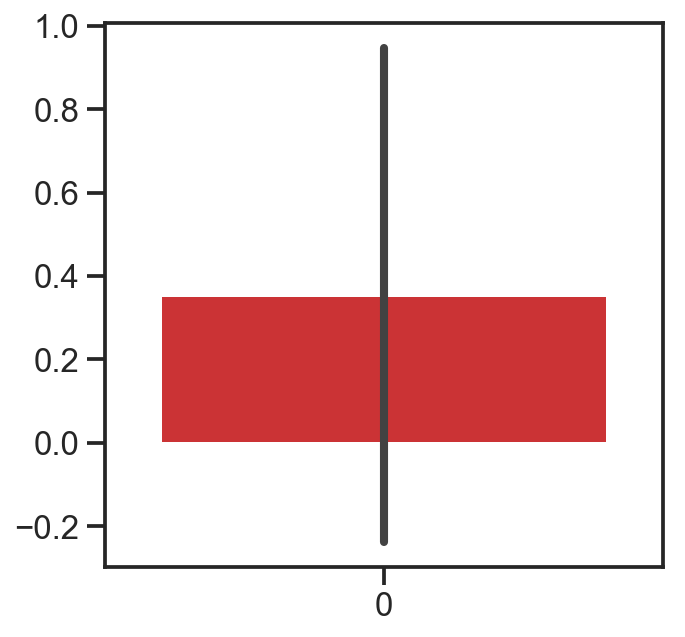

In [16]:
sns.barplot(data=eachrs, ci='sd')
# sns.stripplot(data=eachrs, color='k')
print(np.nanmean(eachrs), np.percentile(a = eachrs, q=[2.5, 50, 97.5]))
_df = pd.DataFrame(coefs, columns=features)
for em in features:
    print(em, np.percentile(a = _df[em], q=[2.5, 97.5]))

In [ ]:
_df  = pd.DataFrame({'pred':predicted_ys,'true':true_ys, #'group':np.sort(groups)
                    })
ax = sns.regplot(x='true',y='pred',data=_df,line_kws={'color':dyadcolor},scatter_kws={'color':dyadcolor})
ax.set_ylabel('Predicted\nConnectedness',rotation=0,labelpad=60)
ax.set(xlabel='True Connectedness', title=f'r: {r:.2f}, p: {p:.3f}')
sns.despine();
plt.axis('equal');

In [64]:
r_df['Episode_c'] = r_df.Episode.apply(lambda x: int(x[-1])-2.5)
if exclude_friends: 
    # Results Still hold with removing friedns.
    nofriend_r_df = r_df[~r_df.dyadID.isin(dyads_friends_str)]

In [65]:
%%R -i r_df
m <- lmer( "mean_Connection ~ Joy + Anger + Surprise + Fear + Sadness + Disgust + Episode_c + (1|dyadID)" , data=r_df)
print(summary(m))
print(confint(m))

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: 
"mean_Connection ~ Joy + Anger + Surprise + Fear + Sadness + Disgust + Episode_c + (1|dyadID)"
   Data: r_df

REML criterion at convergence: 244.3

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-1.7818 -0.4932  0.0558  0.6532  2.3123 

Random effects:
 Groups   Name        Variance Std.Dev.
 dyadID   (Intercept) 1.963    1.401   
 Residual             0.213    0.461   
Number of obs: 112, groups:  dyadID, 28

Fixed effects:
            Estimate Std. Error      df t value          Pr(>|t|)    
(Intercept)   3.6324     0.2903 34.2619   12.51 0.000000000000025 ***
Joy           0.7812     0.3622 80.0417    2.16             0.034 *  
Anger         0.1391     0.3464 78.4279    0.40             0.689    
Surprise      0.6401     0.5253 80.5776    1.22             0.227    
Fear          0.4303     0.4399 77.6428    0.98             0.331    
Sadness      -0.0449     0.3620 80.2248   

In [66]:
%%R -i nofriend_r_df
m <- lmer( "mean_Connection ~ Joy + Anger + Surprise + Fear + Sadness + Disgust + Episode_c + (1|dyadID)" , data=nofriend_r_df)
print(summary(m))
print(confint(m))

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: 
"mean_Connection ~ Joy + Anger + Surprise + Fear + Sadness + Disgust + Episode_c + (1|dyadID)"
   Data: nofriend_r_df

REML criterion at convergence: 198.3

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-1.9559 -0.5592  0.0603  0.6700  2.2503 

Random effects:
 Groups   Name        Variance Std.Dev.
 dyadID   (Intercept) 1.692    1.301   
 Residual             0.223    0.472   
Number of obs: 92, groups:  dyadID, 23

Fixed effects:
            Estimate Std. Error      df t value        Pr(>|t|)    
(Intercept)   3.3562     0.2987 28.1251   11.24 0.0000000000065 ***
Joy           1.0862     0.4457 65.2523    2.44           0.018 *  
Anger         0.0532     0.3662 63.5834    0.15           0.885    
Surprise      0.3887     0.6467 67.2361    0.60           0.550    
Fear          0.0947     0.4986 62.7951    0.19           0.850    
Sadness      -0.1619     0.4207 65.2648   -0.3

## Apply bootstrapping to prediction


In [6]:
from sklearn.linear_model import RidgeCV, LinearRegression
from sklearn.model_selection import LeaveOneGroupOut, LeavePGroupsOut, GroupKFold
features = ['Joy', 'Anger', 'Surprise', 'Fear', 'Sadness', 'Disgust']
# features = ['Joy']
# features = ['Positive','Negative']
X = r_df[features].as_matrix()
y = r_df[['mean_Connection']].values.ravel()
groups = r_df['dyadID'].values.ravel()
# logo = LeaveOneGroupOut()
# logo = LeavePGroupsOut(n_groups=1)
# logo = GroupKFold(n_splits=5)


bs_rs = []
bs_coefs = []
for _ in tqdm(range(10000)):
    # Group level Bootstrap
    # Gen new sample with replacement of groups
    bs_groups = np.random.choice(np.unique(groups), len(np.unique(groups)), replace=True)
    bs_ix = np.sort(np.ravel([np.array(range(len(groups)))[groups==g] for g in bs_groups]))
    bs_X = X[bs_ix]
    bs_y = y[bs_ix]    
    bs_groups = groups[bs_ix]
#     logo = LeavePGroupsOut(n_groups=2)
    logo = GroupKFold(n_splits=5)
    logo_rs = []
    coefs = []
    true_ys = []
    predicted_ys=[]
    for train_ix, test_ix in logo.split(bs_X, bs_y, bs_groups):
#         print(np.unique(bs_groups[test_ix])[0] in np.unique(bs_groups[train_ix]), len(test_ix))
        X_train, X_test = bs_X[train_ix], bs_X[test_ix]
        y_train, y_test = bs_y[train_ix], bs_y[test_ix]    
#         IID level 
        clf = RidgeCV(alphas=[.01, .1, 1., 10.], fit_intercept=True, normalize=False)
#         clf = LinearRegression(fit_intercept=True)
        clf.fit(X_train,y_train)
        coefs.append(clf.coef_)
        predicted_ys.extend(clf.predict(X_test))
        true_ys.extend(y_test)
#         r1, _ = stats.pearsonr(clf.predict(X_test), y_test)
#         logo_rs.append(r1)
#     bs_rs.append(np.mean(logo_rs))
    r, p = stats.pearsonr(predicted_ys,true_ys)
    bs_rs.append(r)
    bs_coefs.append(np.median(coefs, axis=0))


/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:6: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
100%|██████████| 10000/10000 [01:31<00:00, 97.91it/s]


M 0.39842593582203756 CI: [0.00593447 0.42434111 0.64544733]
Joy [1.3278836  2.43559047 4.40649539]
Anger [-1.30016716  0.2303826   1.42726268]
Surprise [-0.00932397  1.19399543  2.60616689]
Fear [-1.07533381  0.38805697  1.80334827]
Sadness [-0.68136487  0.83262773  1.90419862]
Disgust [-0.97339284  0.38059753  1.67261798]


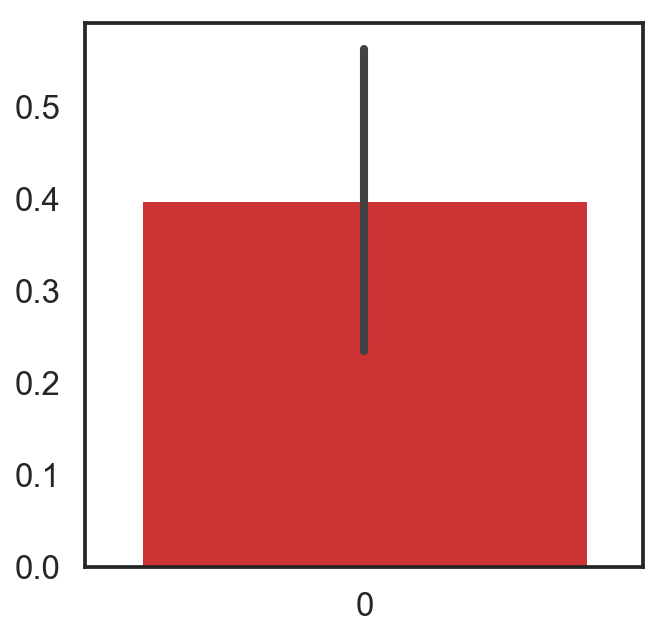

In [7]:
sns.barplot(data=bs_rs, ci='sd')
print('M',np.nanmean(bs_rs), 'CI:', np.percentile(a = bs_rs, q=[2.5, 50, 97.5]))
_df = pd.DataFrame(bs_coefs, columns=features)
for em in features:
    print(em, np.percentile(a = _df[em], q=[2.5, 97.5]))

### bootstrap all datapoints

In [254]:
from sklearn.linear_model import RidgeCV, LinearRegression
from sklearn.model_selection import LeaveOneGroupOut, LeavePGroupsOut, GroupKFold
features = ['Joy', 'Anger', 'Surprise', 'Fear', 'Sadness', 'Disgust']
# features = ['Joy']
# features = ['Positive','Negative']
X = r_df[features].as_matrix()
y = r_df[['mean_Connection']].values.ravel()
groups = r_df['dyadID'].values.ravel()

bs_rs = []
bs_coefs = []
for _ in tqdm(range(5000)):
    # Group level Bootstrap
    # Gen new sample with replacement of groups
    bs_ix = np.random.choice(range(0,112), 
                                 len(np.unique(groups)), replace=True)
    bs_X = X[bs_ix]
    bs_y = y[bs_ix]    
    bs_groups = groups[bs_ix]
#     logo = LeavePGroupsOut(n_groups=1)
    logo = GroupKFold(n_splits=5)
    logo_rs = []
    coefs = []
    true_ys = []
    predicted_ys=[]
    for train_ix, test_ix in logo.split(bs_X, bs_y, bs_groups):
#         print(np.unique(bs_groups[test_ix])[0] in np.unique(bs_groups[train_ix]), len(test_ix))
        X_train, X_test = bs_X[train_ix], bs_X[test_ix]
        y_train, y_test = bs_y[train_ix], bs_y[test_ix]    
#         IID level 
        clf = RidgeCV(alphas=[.01, .1, 1., 10.], fit_intercept=True, normalize=False)
#         clf = LinearRegression(fit_intercept=True)
        clf.fit(X_train,y_train)
        coefs.append(clf.coef_)
        predicted_ys.extend(clf.predict(X_test))
        true_ys.extend(y_test)
#         r1, _ = stats.pearsonr(clf.predict(X_test), y_test)
#         logo_rs.append(r1)
#     bs_rs.append(np.mean(logo_rs))
    r, p = stats.pearsonr(predicted_ys,true_ys)
    bs_rs.append(r)
    bs_coefs.append(np.median(coefs, axis=0))

/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/ipykernel/__main__.py:6: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
100%|██████████| 5000/5000 [01:18<00:00, 63.82it/s]


M 0.31509560269774217 CI: -0.3395073103053283 0.6932649922981582
Joy 0.21165871292139493 5.662969253862694
Anger -2.875893009177951 1.849984579147069
Surprise -0.976101925943301 3.9703183368468973
Fear -3.0130287704063035 3.4862870367288856
Sadness -1.8238858428506777 2.7742756538180884
Disgust -1.916747888993498 2.8512409369008385


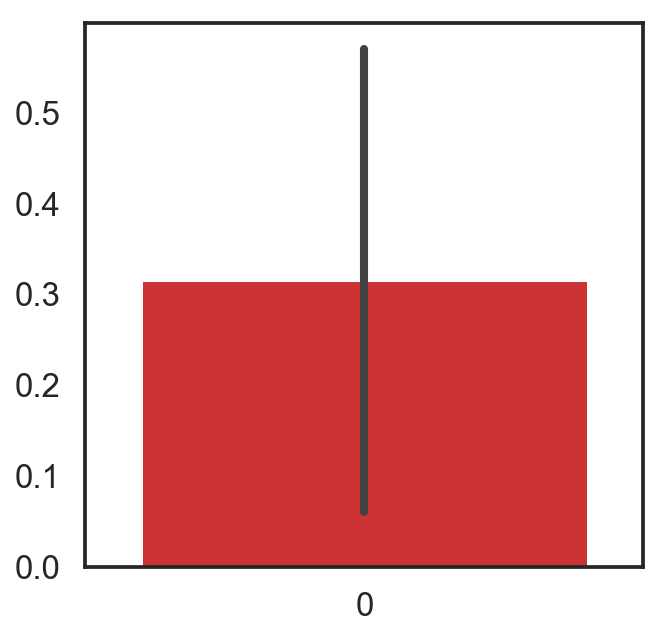

In [255]:
sns.barplot(data=bs_rs, ci='sd')
print('M',np.nanmean(bs_rs), 'CI:', np.percentile(a = bs_rs, q=2.5) , np.percentile(a = bs_rs, q = 97.5))
_df = pd.DataFrame(bs_coefs, columns=features)
for em in features:
    print(em, np.percentile(a = _df[em], q=2.5) , np.percentile(a = _df[em], q=97.5))

### Test time effect with R

In [6]:
%reload_ext rpy2.ipython

In [ ]:
%%R
require('lme4')
require('lmerTest')
require('lattice')
require('boot')
require('sjPlot')
require('optimx')
options("scipen"=15, "digits"=5)
r2 <- function(m) {
  lmfit <-  lm(model.response(model.frame(m)) ~ fitted(m))
#   summary(lmfit)$r.squared
  summary(lmfit)$adj.r.squared
}

In [ ]:
r_df['Positive_dm']=r_df.Positive-r_df.Positive.mean()
r_df['Negative_dm']=r_df.Negative-r_df.Negative.mean()
r_df['Episode_c'] = r_df.Episode.apply(lambda x: int(x[-1])-2.5)

In [36]:
%%R -i r_df
# m0 <- lmer('mean_Connection ~ Positive_dm * Episode_c + (1|dyadID)', data=r_df)
# print(summary(m0)$coef)
# m1 <- lmer('mean_Connection ~ Negative_dm * Episode_c + (1|dyadID)', data=r_df)
# print(summary(m1)$coef)
m2 <- lmer('mean_Connection ~ Positive_dm * Episode_c + Negative_dm * Episode_c + (1|dyadID)', data=r_df)
print(summary(m2)$coef)

                      Estimate Std. Error     df  t value             Pr(>|t|)
(Intercept)            3.96560   0.271837 26.099 14.58816 0.000000000000046149
Positive_dm            1.15017   0.313094 84.845  3.67355 0.000417800551132113
Episode_c              0.24307   0.040763 78.991  5.96294 0.000000066023301135
Negative_dm           -0.74069   0.391074 79.623 -1.89399 0.061857849227458142
Positive_dm:Episode_c  0.47423   0.201567 79.017  2.35270 0.021125878192880018
Episode_c:Negative_dm -0.24631   0.333910 79.177 -0.73764 0.462913920148596558


# SRM analyses
## Figure 3-a. Spatial similarity comparison between groups for feature 0 & 1. 

In [13]:
fex_dir = os.path.join('../../../../../Data/FEX/downsampled_na_1/')
fex_list = np.sort(glob.glob(os.path.join(fex_dir,'*dyad*')))

beh_dat = pd.read_csv(rating_file_path)

alone_sublist = [ 's022', 's023', 's024', 's025',
       's026', 's027', 's028', 's029', 's030', 's031', 's032', 's033', 's034',
       's035', 's036', 's037', 's038', 's039', 's040', 's041','s042']

# Retrieve rating data.
all_dyads = set(np.arange(71,103,1))
# 82, 86 excluded b/c more than 10% missing values. 90, 91 excluded b/c didn't return for second half.
dyads_to_exclude = set([90, 91, 82, 86]) 
dyads = list(all_dyads-dyads_to_exclude)
noDyads = len(dyads)
connection, connection_diff, enjoy,enjoy_diff, dyads_dat = load_dyad_df(dyad_file, dyads = dyads)

# names for dyads to retrieve beh rating data.
alldyads= ['s'+str(_dyad).zfill(3)+'_1' for _dyad in dyads]
alldyads.extend(['s'+str(_dyad).zfill(3)+'_2' for _dyad in dyads])
alldyads =np.sort(alldyads)

# set color pallette
colors = sns.color_palette('Set1')

In [6]:
aulist = [u'AU1 Evidence', u'AU10 Evidence', u'AU12 Evidence', u'AU14 Evidence',
       u'AU15 Evidence', u'AU17 Evidence', u'AU18 Evidence', u'AU2 Evidence',
       u'AU20 Evidence', u'AU23 Evidence', u'AU24 Evidence', u'AU25 Evidence',
       u'AU26 Evidence', u'AU28 Evidence', u'AU4 Evidence', u'AU43 Evidence',
       u'AU5 Evidence', u'AU6 Evidence', u'AU7 Evidence', u'AU9 Evidence']
aulist = natsort.natsorted(aulist) 
aulist.extend([u'Joy Evidence', u'Disgust Evidence', u'Surprise Evidence', 
               u'Anger Evidence', u'Sadness Evidence', u'Fear Evidence',
               u'Positive Evidence', u'Negative Evidence'])
audict_dyad = dict.fromkeys(aulist)
nulls = pd.DataFrame()
fex_list = np.sort(glob.glob(os.path.join(fex_dir,'*dyad*')))
epns = ['ep01','ep02','ep03','ep04']
for i, epn in enumerate(epns):
    print(epn, fex_list[i])
    df = pd.read_json(fex_list[i],orient='values')
    # save for each au
    audict_dyad[epn] = {}
    for au in aulist:
        audict_dyad[epn][au] = df[[au]].apply(lambda x: pd.Series(x[au]),axis=1)
    # Calculate missing data percentage for each subject. 
    nulls = pd.concat([nulls, pd.DataFrame(audict_dyad[epn][au].isnull().sum()/audict_dyad[epn][au].shape[0]).T])
nulls.index = epns

#remove dyads that have lost face. 
for i, epn in enumerate(epns):
    for au in aulist:
        for dy_excl in list(dyads_to_exclude):
            try:
                audict_dyad[epn][au] = audict_dyad[epn][au].drop('s' +str(dy_excl).zfill(3)+'_1',axis=1)
                audict_dyad[epn][au] = audict_dyad[epn][au].drop('s' +str(dy_excl).zfill(3)+'_2',axis=1)
            except:
                pass
#                 print('check dyad ' + str(dy_excl) + ' is in data. ')        

audict_solo = dict.fromkeys(aulist)
nulls = pd.DataFrame()
fex_list = np.sort(glob.glob(os.path.join(fex_dir,'*ctrl*')))
epns = ['ep01','ep02','ep03','ep04']
for i, epn in enumerate(epns):
    print(epn, fex_list[i])
    df = pd.read_json(fex_list[i],orient='values')
    # save for each au
    audict_solo[epn] = {}
    for au in aulist:
        audict_solo[epn][au] = df[[au]].apply(lambda x: pd.Series(x[au]),axis=1)
    nulls = pd.concat([nulls, pd.DataFrame(audict_solo[epn][au].isnull().sum()/audict_solo[epn][au].shape[0]).T])
nulls.index = epns

# Create Dict with standardized features for each column of each subject for each group. 
# Note that to do out of sample prediction, standardized need to be split too.
# Creates au_standardized_solo, au_standardized_dyad, and au_standardized_allsubs
epns = ['ep01','ep02','ep03','ep04']
au_standardized_solo={}
au_standardized_dyad={}
au_standardized_allsubs = {}
_onecolforcolname = aulist[0]
for epn in epns: 
    one_sub = pd.DataFrame()
    all_subs_solo = []
    cols = []
    for sub in audict_solo[epn][_onecolforcolname].columns:
        one_sub = pd.DataFrame()
        for key in audict_solo[epn].keys():
            cols.append(key)
            one_sub = pd.concat([one_sub, audict_solo[epn][key][sub]],axis=1)      
        one_sub = (one_sub - one_sub.mean())/one_sub.std()
#         all_subs_solo.append(one_sub.fillna(0).as_matrix().T)
        # linear interpolate 
        all_subs_solo.append(one_sub.interpolate(method='linear', axis=0, limit_direction='both').values.T)
    au_standardized_solo[epn] = all_subs_solo
        
    one_sub = pd.DataFrame()
    all_subs_dyad = []
    cols = []
    for sub in audict_dyad[epn][_onecolforcolname].columns:
        one_sub = pd.DataFrame()
        for key in audict_dyad[epn].keys():
            cols.append(key)
            one_sub = pd.concat([one_sub, audict_dyad[epn][key][sub]],axis=1)
        one_sub = (one_sub - one_sub.mean())/one_sub.std()
#         all_subs_dyad.append(one_sub.fillna(0).as_matrix().T)
        all_subs_dyad.append(one_sub.interpolate(method='linear', axis=0, limit_direction='both').values.T)
    all_subs = np.concatenate([all_subs_solo, all_subs_dyad])
    au_standardized_dyad[epn] = all_subs_dyad
    
    au_standardized_allsubs[epn] = np.concatenate([all_subs_solo, all_subs_dyad])

ep01 ../../Data/FEX/downsampled_na_1/group_dyad_facet_ep01_1hz_downsample.json
ep02 ../../Data/FEX/downsampled_na_1/group_dyad_facet_ep02_1hz_downsample.json
ep03 ../../Data/FEX/downsampled_na_1/group_dyad_facet_ep03_1hz_downsample.json
ep04 ../../Data/FEX/downsampled_na_1/group_dyad_facet_ep04_1hz_downsample.json
ep01 ../../Data/FEX/downsampled_na_1/group_ctrl_facet_ep01_1hz_downsample.json
ep02 ../../Data/FEX/downsampled_na_1/group_ctrl_facet_ep02_1hz_downsample.json
ep03 ../../Data/FEX/downsampled_na_1/group_ctrl_facet_ep03_1hz_downsample.json
ep04 ../../Data/FEX/downsampled_na_1/group_ctrl_facet_ep04_1hz_downsample.json


In [8]:
# combine all 4 episodes print out temporal isc for each shared response
features = 2
n_iter = 20
seed = 100
# indexing just the 20 AUs
srm_data = np.concatenate([au_standardized_allsubs[epn][:,:20,:] for epn in epns],axis=2) 
srm_both = brainiak.funcalign.srm.SRM(n_iter=n_iter, features=features, rand_seed=seed)
srm_both.fit(srm_data)

t_srm = srm_both.transform(srm_data)
for feature_i in range(features):
    sub_t_srm = np.array([sub_srm[feature_i] for sub_srm in t_srm])
    corr_t_srm = pd.DataFrame(sub_t_srm).T.corr()
    alone_t_srm = parse_triangle(corr_t_srm.iloc[:21,:21],condition='upper')
    dyad_t_srm = parse_triangle(corr_t_srm.iloc[21:,21:],condition='pairs')
    ## Use Mantel test for comparison.
    print(f'Feature {feature_i}: Alone {np.mean(alone_t_srm):.2f}', f'dyad {np.mean(dyad_t_srm):.2f}')
    t, p = stats.ttest_ind(dyad_t_srm, alone_t_srm)
    print(f"Feature {feature_i}: Dyad v Alone difference in t-ISC feature {feature_i}: t: {t:.2f}, p: {p:.3f}",)

Feature 0: Alone 0.12 dyad 0.33
Feature 0: Dyad v Alone difference in t-ISC feature 0: t: 11.11, p: 0.000
Feature 1: Alone 0.23 dyad 0.24
Feature 1: Dyad v Alone difference in t-ISC feature 1: t: 0.40, p: 0.692


In [13]:
# USE MANTEL TEST FOR SIGNIFICANCE TESTING.
random_state=1
from sklearn.utils import check_random_state
MAX_INT = np.iinfo(np.int32).max
n_samples=5000
n_jobs=-1
# combine all 4 episodes print out temporal isc for each shared response
features = 2
n_iter = 20
seed = 100
# indexing just the 20 AUs
srm_data = np.concatenate([au_standardized_allsubs[epn][:,:20,:] for epn in epns],axis=2) 
srm_both = brainiak.funcalign.srm.SRM(n_iter=n_iter, features=features,rand_seed=seed)
srm_both.fit(srm_data)

t_srm = srm_both.transform(srm_data)
for feature_i in range(features):
    sub_t_srm = np.array([sub_srm[feature_i] for sub_srm in t_srm])
    corr_t_srm = pd.DataFrame(sub_t_srm).T.corr()
    alone_t_srm = parse_triangle(corr_t_srm.iloc[:21,:21],condition='upper')
    dyad_t_srm = parse_triangle(corr_t_srm.iloc[21:,21:],condition='pairs')
    # r_diff to compare against distribution.
    r_diff = np.mean(dyad_t_srm)-np.mean(alone_t_srm) 
    
    random_state = check_random_state(random_state)
    seeds = random_state.randint(MAX_INT, size=n_samples)
    data_row_id = range(corr_t_srm.shape[0])
    diffs_pairs_alone, diffs_nonpairs_alone, diffs_pairs_nonpairs =[],[],[]
    for i in range(n_samples):
        # matrix permutation, shuffle the groups
        ix = random_state.choice(data_row_id,
                           size=len(corr_t_srm),
                           replace=False) 
        new_dat = corr_t_srm.iloc[ix,ix]
        new_dyad = new_dat.iloc[21:,21:]
        new_alone = new_dat.iloc[:21,:21]
        
        diffs_pairs_alone.append(np.mean(parse_triangle(new_dyad))-np.mean(parse_triangle(new_alone)) )
                              
    ## Use Mantel test for comparison.
    mantel_p = nlstats._calc_pvalue(np.array(diffs_pairs_alone), r_diff, tail=2)
    print(f'Feature {feature_i}: Alone {np.mean(alone_t_srm):.2f}', f'dyad {np.mean(dyad_t_srm):.2f}',f"Mantel p: {mantel_p:.3f}")
    t, p = stats.ttest_ind(dyad_t_srm, alone_t_srm)
    print(f"Feature {feature_i}: Dyad v Alone difference in t-ISC feature {feature_i}: t: {t:.2f}, p: {p:.3f}",)

Feature 0: Alone 0.13 dyad 0.28 Mantel p: 0.000
Feature 0: Dyad v Alone difference in t-ISC feature 0: t: 8.93, p: 0.000
Feature 1: Alone 0.22 dyad 0.20 Mantel p: 0.336
Feature 1: Dyad v Alone difference in t-ISC feature 1: t: -1.35, p: 0.179


In [38]:
# Calculate mean synchrony across all 4 episodes.
for emotion in ['Positive Evidence', 'Negative Evidence']:
    dyad_em_df = pd.DataFrame()
    solo_em_df = pd.DataFrame()
    for epn in epns:
        dyad_em_df = pd.concat([dyad_em_df, audict_dyad[epn][emotion]])
        solo_em_df = pd.concat([solo_em_df, audict_solo[epn][emotion]])
    print(f'Alone {emotion}: {np.mean(parse_triangle(solo_em_df.corr(),condition="upper")):.2f}')
    print(f'Dyad {emotion} : {np.mean(parse_triangle(dyad_em_df.corr(),condition="pairs")):.2f}')

Alone Positive Evidence: 0.07
Dyad Positive Evidence : 0.20
Alone Negative Evidence: 0.01
Dyad Negative Evidence : 0.03


/Users/jinhyuncheong/Dropbox/Packages/fnl_tools/fnl_tools/utils.py:117: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  df = df.as_matrix()


## Figure 3-b. Temporal similarity predicting connection ratings

Alone SRM - Positive Evidence 0.06 t:6.74, p: 0.000
Dyad SRM - Positive Evidence 0.10 t:3.49, p: 0.002
Positive Evidence - Conn: r: 0.68, p:0.000
Positive Evidence SRM - Conn: r: 0.70, p:0.000


/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


Alone SRM - Negative Evidence 0.22 t:21.65, p: 0.000
Dyad SRM - Negative Evidence 0.20 t:6.11, p: 0.000
Negative Evidence - Conn: r: 0.21, p:0.285
Negative Evidence SRM - Conn: r: 0.18, p:0.348


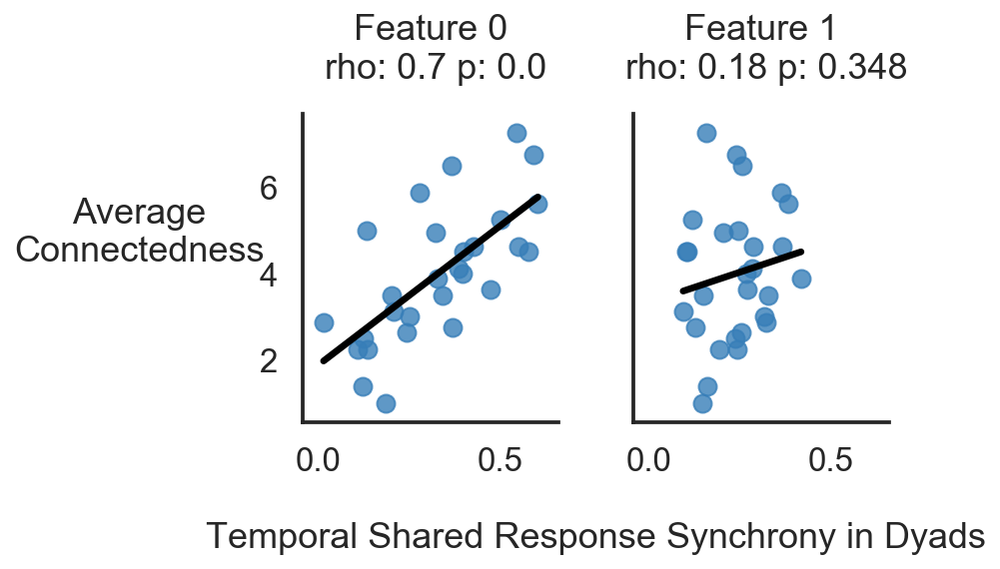

In [14]:
sns.set_style('white')
# Positive comparison 
features = range(2)
emotions = ['Positive Evidence','Negative Evidence']
f,ax = plt.subplots(1,2,figsize=(7,5),sharex=True,sharey=True)
for feature_i, emotion in zip(features, emotions):
    sub_t_srm = np.array([sub_srm[feature_i] for sub_srm in t_srm])
    corr_t_srm = pd.DataFrame(sub_t_srm).T.corr()
    alone_t_srm = parse_triangle(corr_t_srm.iloc[:21,:21],condition='upper')
    dyad_t_srm = parse_triangle(corr_t_srm.iloc[21:,21:],condition='pairs')

    dyad_em_df = pd.DataFrame()
    solo_em_df = pd.DataFrame()
    for epn in epns:
        dyad_em_df = pd.concat([dyad_em_df, audict_dyad[epn][emotion]])
        solo_em_df = pd.concat([solo_em_df, audict_solo[epn][emotion]])

    diff = alone_t_srm - parse_triangle(solo_em_df.corr(),condition='upper')
    t,p = stats.ttest_1samp(diff,0)
    print(f'Alone SRM - {emotion} {np.mean(diff):.2f} t:{t:.2f}, p: {p:.3f}')
    diff = dyad_t_srm - parse_triangle(dyad_em_df.corr(),condition='pairs')
    t,p = stats.ttest_1samp(diff,0)
    print(f'Dyad SRM - {emotion} {np.mean(diff):.2f} t:{t:.2f}, p: {p:.3f}')

    average_conn_across_episodes= np.mean([connection[epn] for epn in epns],axis=0)
    r,p = stats.spearmanr(parse_triangle(dyad_em_df.corr(),condition='pairs'),average_conn_across_episodes)
    print(f'{emotion} - Conn: r: {r:.2f}, p:{p:.3f}')
    r,p = stats.spearmanr(dyad_t_srm,average_conn_across_episodes)
    print(f'{emotion} SRM - Conn: r: {r:.2f}, p:{p:.3f}')
    ax[feature_i].set_title(f"Feature {feature_i}"+'\n rho: '+ str(np.round(r,2))  +' p: ' + str(np.round(p,3)),y=1.08)
    sns.regplot(y = average_conn_across_episodes,x = dyad_t_srm, ax=ax[feature_i], color='k',ci=False,truncate=True,scatter_kws={'color':colors[1]})

ax[0].set_ylabel('Average\nConnectedness',rotation=0,labelpad=60)
# for common label
f.add_subplot(111, frameon=False)
# plt.tick_params(which='both',labelcolor='none', top='off', bottom='off', left='off', right='off')
plt.gca().xaxis.set_major_locator(plt.NullLocator())
plt.gca().yaxis.set_major_locator(plt.NullLocator())
plt.grid(False)
plt.xlabel(f'Temporal Shared Response Synchrony in Dyads',rotation=0,labelpad=50)
sns.despine()
plt.tight_layout()
# f.savefig('Figures/Synchrony_corr_connectedness.pdf',dpi=300)
plt.show()

alone 0.1279159148565268 dyad 0.2771254466107233
Ttest_indResult(statistic=8.92698459667974, pvalue=1.257104820074704e-16)
alone 0.22432303311483076 dyad 0.1997744971217881
Ttest_indResult(statistic=-1.3467041221469878, pvalue=0.17936740059573067)


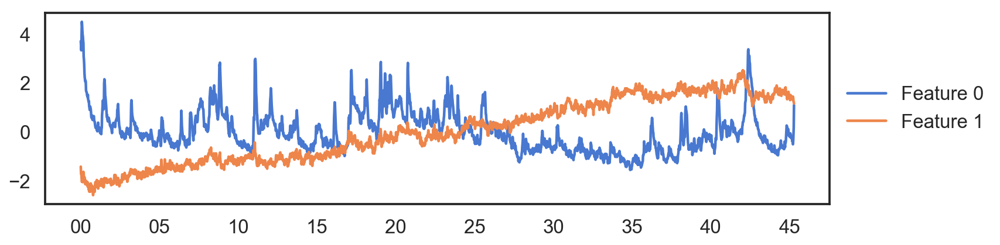

In [14]:
# combine all 4 episodes print out temporal isc for each shared response
sns.set_palette("muted")
features = 2
n_iter = 20
seed = 100
t_srm = srm_both.transform(srm_data)
for feature_i in range(features):
    sub_t_srm = np.array([sub_srm[feature_i] for sub_srm in t_srm])
    corr_t_srm = pd.DataFrame(sub_t_srm).T.corr()
    alone_t_srm = parse_triangle(corr_t_srm.iloc[:21,:21],condition='upper')
    dyad_t_srm = parse_triangle(corr_t_srm.iloc[21:,21:],condition='pairs')

    print('alone',np.mean(alone_t_srm),'dyad',np.mean(dyad_t_srm))
    print(stats.ttest_ind(dyad_t_srm, alone_t_srm))

f,ax = plt.subplots(figsize=(15,3))
for feature_i in range(features):
    sub_t_srm = np.array([sub_srm[feature_i] for sub_srm in t_srm])
    ax.plot(-1*np.mean(sub_t_srm,axis=0)[:2718],label=f"Feature {feature_i}")
ax.set_xticks(range(0,2718,300))
ax.set(title = '', xticklabels = [tick[:2] for tick in rec_to_time(ax.get_xticks(),TR=1)])
# Shrink current axis by 20%
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
plt.legend(loc = 'center left', frameon=False, bbox_to_anchor=(1, 0.5))

## Figure 3-c. Average loadings on facial action units for SRM

/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


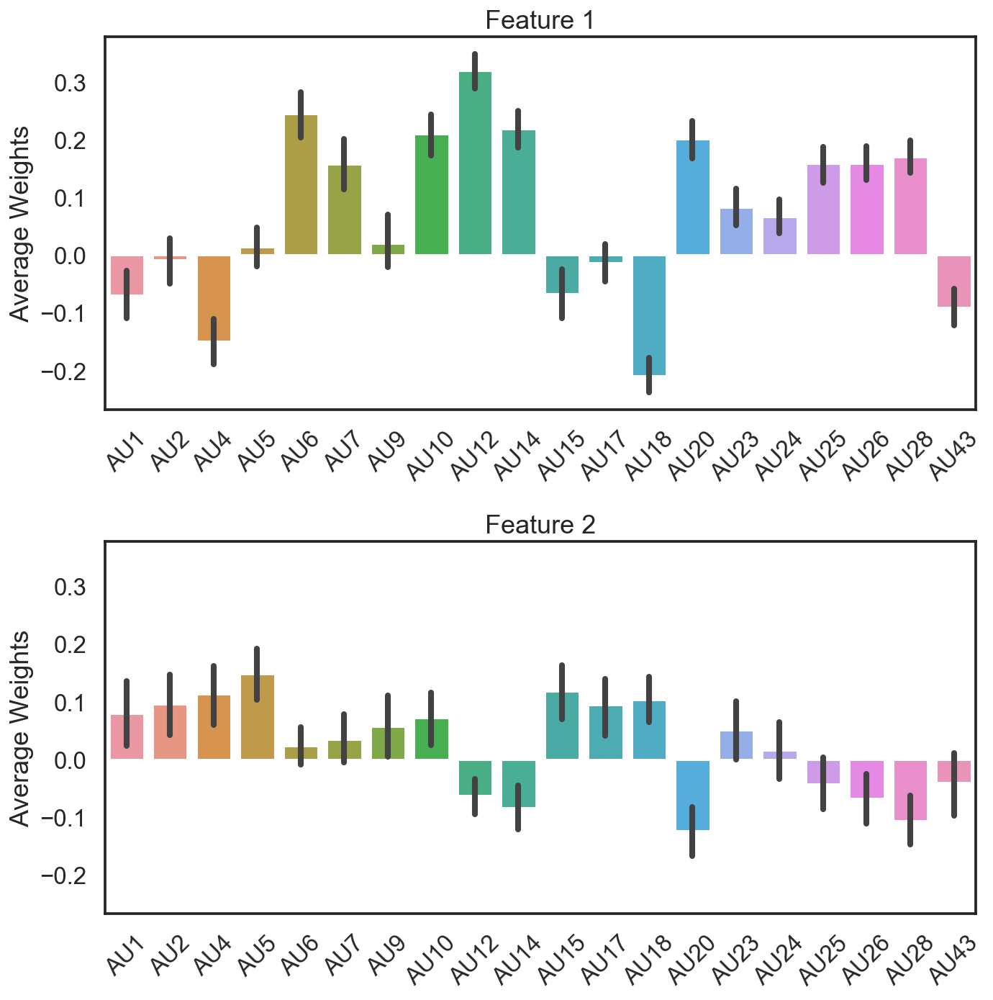

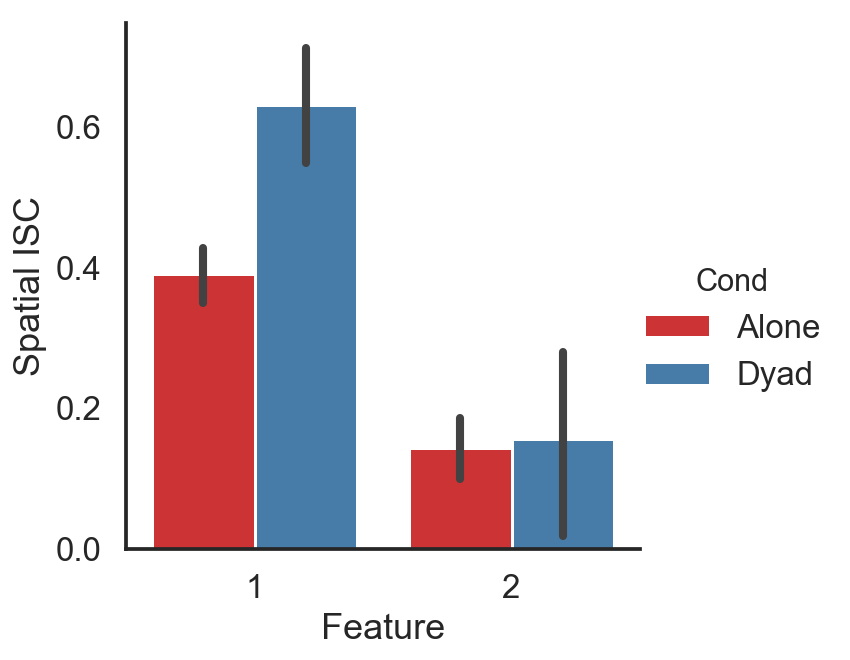

In [13]:
sns.set_context('talk')
au_list = [au.split(' ')[0] for au in aulist if 'AU' in au]
f, axes = plt.subplots(2,1,figsize=(10,10),sharey=True)
w1 = -1*np.array([w[:,0] for w in srm_both.w_])
sns.barplot(data=w1,ci=95,ax=axes[0])
w2 = -1*np.array([w[:,1] for w in srm_both.w_])
sns.barplot(data=w2, ci=95,ax=axes[1])
axes[0].set(xticklabels=au_list,ylabel='Average Weights', title='Feature 1')
axes[0].set_xticklabels(au_list,rotation=45)
axes[1].set(xticklabels=au_list,ylabel='Average Weights', title='Feature 2')
axes[1].set_xticklabels(au_list,rotation=45)
plt.tight_layout()
plt.show()

s_isc_df = pd.DataFrame()
w1corr = pd.DataFrame(w1).T.corr()
s_isc_alone = parse_triangle(w1corr.iloc[:21,:21],condition='upper')
s_isc_dyad = parse_triangle(w1corr.iloc[21:,21:],condition='pairs')
s_isc_df = pd.concat([pd.DataFrame({'Cond':'Alone', 'Feature': 1, 'Spatial ISC': s_isc_alone}), 
                     pd.DataFrame({'Cond':'Dyad', 'Feature': 1, 'Spatial ISC': s_isc_dyad})],axis=0)
w2corr = pd.DataFrame(w2).T.corr()
s_isc_alone = parse_triangle(w2corr.iloc[:21,:21],condition='upper')
s_isc_dyad = parse_triangle(w2corr.iloc[21:,21:],condition='pairs')
s_isc_df = pd.concat([s_isc_df,pd.DataFrame({'Cond':'Alone', 'Feature': 2, 'Spatial ISC': s_isc_alone}), 
                     pd.DataFrame({'Cond':'Dyad', 'Feature': 2, 'Spatial ISC': s_isc_dyad})],axis=0)
sns.set_palette('Set1')
sns.catplot(x='Feature',y='Spatial ISC',data=s_isc_df, hue='Cond',kind='bar',ci=95)
plt.show()

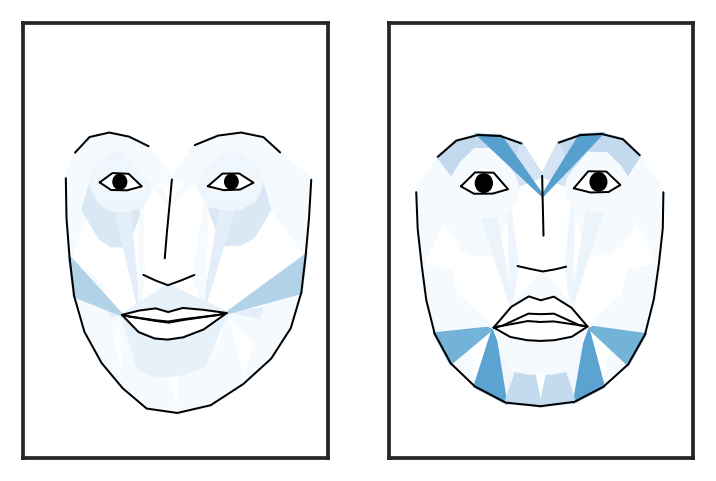

In [10]:
fig, axes = plt.subplots(1,2,figsize=(6,4))
muscles = {'all': 'heatmap'}
wmean = 50*np.mean(w1,axis=0)**3
wmean[wmean<0] = 0
plot_face(model=None, ax= axes[0], au = wmean, muscles = muscles,color = 'k',linewidth=1,)
wmean = 1500*np.mean(w2,axis=0)**3
wmean[wmean<0] = 0
plot_face(model=None, ax= axes[1], au = wmean, muscles = muscles,color = 'k',linewidth=1)
plt.show()

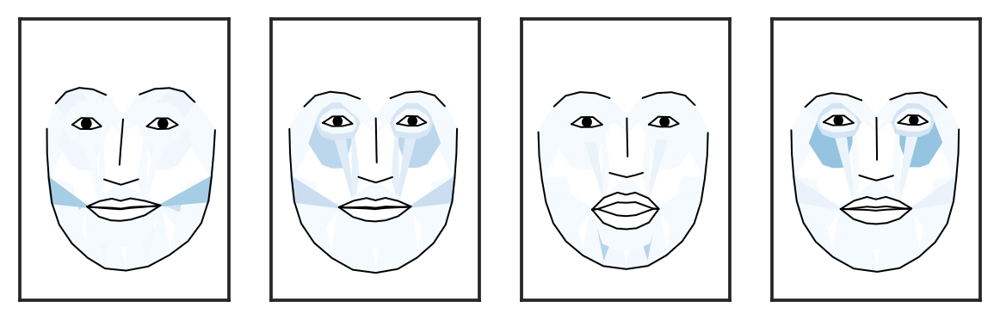

In [380]:
fig, axes = plt.subplots(1,4,figsize=(10,3))
muscles = {'all': 'heatmap'}
wmean = 12*(w1**3)
wmean[wmean<0] = 0
plot_face(model=None, ax= axes[0], au = wmean[28,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[1], au = wmean[58,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[2], au = wmean[62,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[3], au = wmean[63,:], muscles = muscles,color = 'k',linewidth=1,)
# wmean = 1500*(w2)**3
# wmean[wmean<0] = 0
# plot_face(model=None, ax= axes[1], au = wmean, muscles = muscles,color = 'k',linewidth=1)
# plt.show()

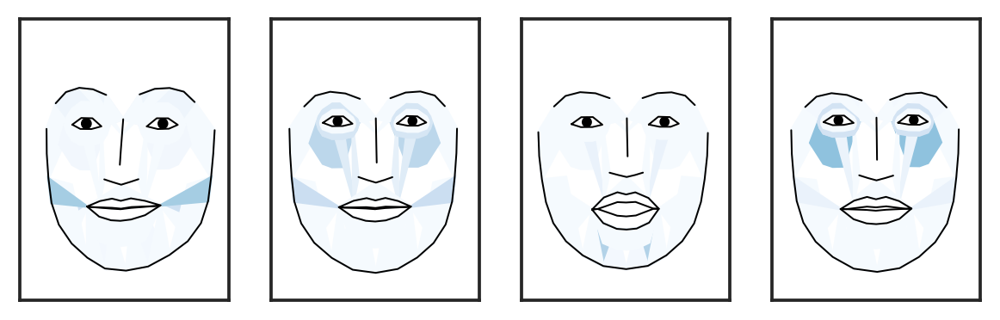

In [112]:
fig, axes = plt.subplots(1,4,figsize=(10,3))
muscles = {'all': 'heatmap'}
wmean = 12*(w1**3)
wmean[wmean<0] = 0
plot_face(model=None, ax= axes[0], au = wmean[28,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[1], au = wmean[58,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[2], au = wmean[62,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[3], au = wmean[63,:], muscles = muscles,color = 'k',linewidth=1,)

In [ ]:
# Plot all positive subject faces
wmean = 12*(w1**3)
wmean[wmean<0] = 0
f,axes = plt.subplots(7,8, figsize=(20,20))
axes = axes.flatten()
for ix,i in enumerate(range(21,77)):
    plot_face(model=None, ax= axes[ix], au = wmean[i,:], muscles = muscles,color = 'k',linewidth=1)
    axes[ix].set(title=f"{i}")

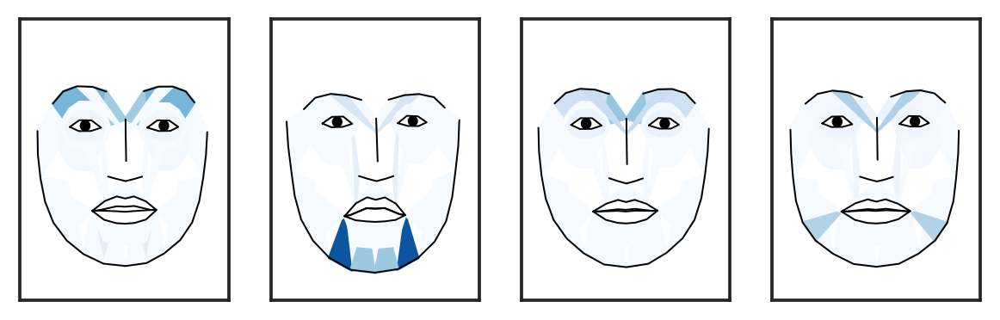

In [113]:
fig, axes = plt.subplots(1,4,figsize=(10,3))
muscles = {'all': 'heatmap'}
wmean = 15*(w2)**3
wmean[wmean<0] = 0
plot_face(model=None, ax= axes[0], au = wmean[26,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[1], au = wmean[49,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[2], au = wmean[64,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[3], au = wmean[75,:], muscles = muscles,color = 'k',linewidth=1,)
plt.show()

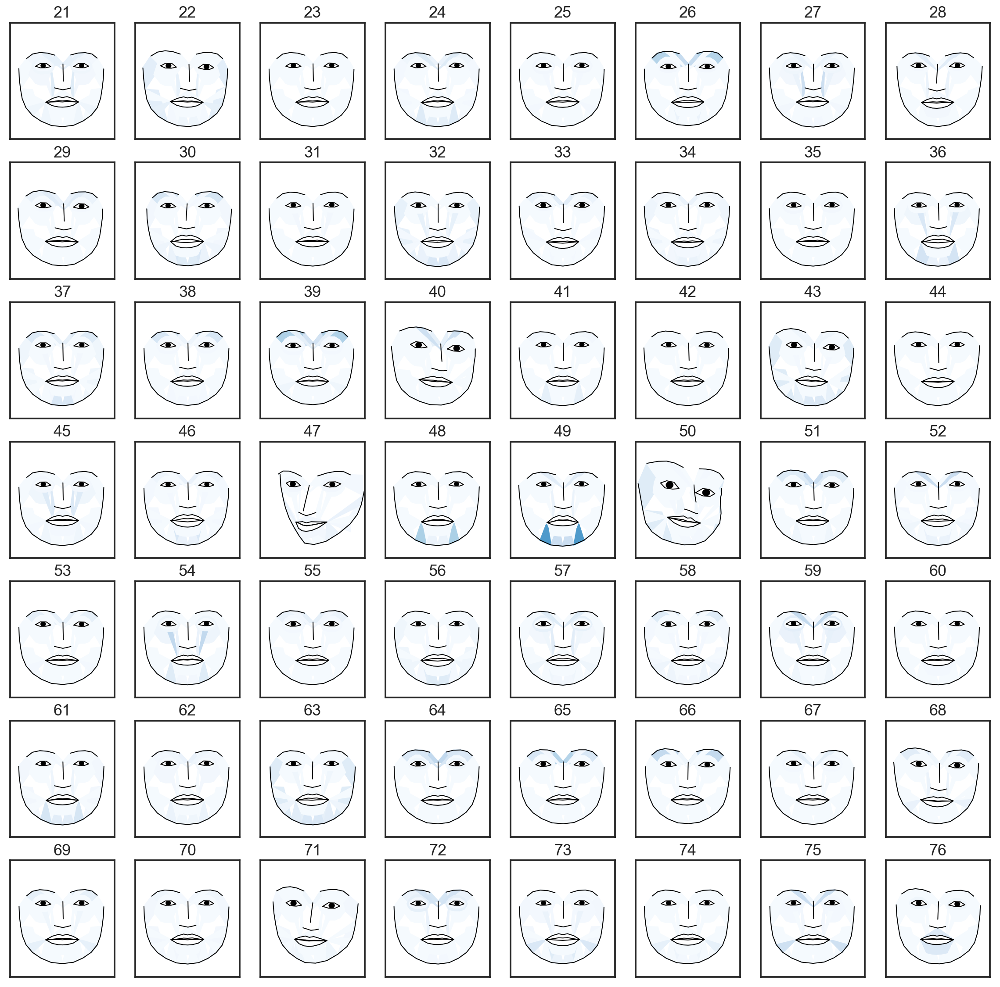

In [390]:
wmean = 10*(w2)**3
wmean[wmean<0] = 0
f,axes = plt.subplots(7,8, figsize=(20,20))
axes = axes.flatten()
for ix,i in enumerate(range(21,77)):
    plot_face(model=None, ax= axes[ix], au = wmean[i,:], muscles = muscles,color = 'k',linewidth=1)
    axes[ix].set(title=f"{i}")
plt.show()

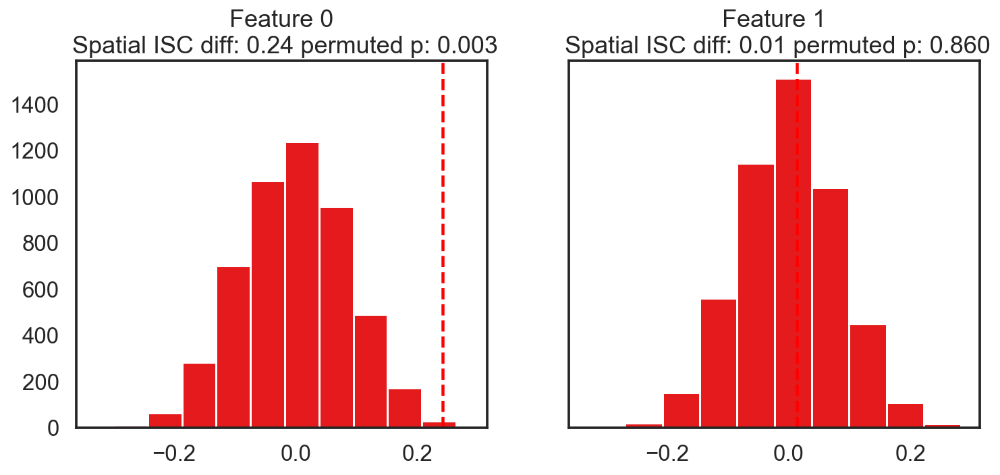

In [52]:
ps = []
n_features=2
f, axes = plt.subplots(1,2,figsize=(12,5),sharex=True, sharey=True)
axes = axes.flatten()
for feature_num in range(n_features):
    weights = [s[:,feature_num] for s in srm_both.w_]

    w_isc = pd.DataFrame(weights).T.corr()
    w_isc_solo = parse_triangle(w_isc.iloc[:21,:21],condition='upper')
    w_isc_dyad = parse_triangle(w_isc.iloc[21:,21:],condition='pairs')
    w_isc_df = pd.concat([pd.DataFrame({'w_isc':w_isc_solo,'Cond':'Alone'}),pd.DataFrame({'w_isc':w_isc_dyad,'Cond':'Dyad'})])
    # sns.catplot(x='Cond',y='w_isc', data = w_isc_df, ci=95, kind='bar')
    r_diff = np.mean(w_isc_dyad)-np.mean(w_isc_solo)

    # permute 
    sub_range = list(range(0,77))
    r_diffs = []
    for i in range(0,5000):
        np.random.shuffle(sub_range)
        solo_index = sub_range[:21]
        dyad_index = sub_range[21:]
        _w_isc_solo = parse_triangle(w_isc.loc[solo_index,solo_index],condition='upper')
        _w_isc_dyad = parse_triangle(w_isc.loc[dyad_index,dyad_index],condition='pairs')
        r_diffs.append( np.mean(_w_isc_dyad)-np.mean(_w_isc_solo)   )
#     permuted_p = np.mean(r_diff < r_diffs) # p-value
    permuted_p = nlstats._calc_pvalue(all_p=r_diffs, stat=r_diff, tail=2) # p-value
    ps.append(permuted_p)

    axes[feature_num].hist(r_diffs)
    axes[feature_num].axvline(r_diff, color='r',linestyle='--')
    axes[feature_num].set(title=f'Feature {feature_num}\n Spatial ISC diff: {r_diff:.2f} permuted p: {permuted_p:.3f}')

### Plot spatial similarity predicting connection

0 0.5128697373687385 0.005258390007674732
1 0.4501643610433561 0.016228490313717377


/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


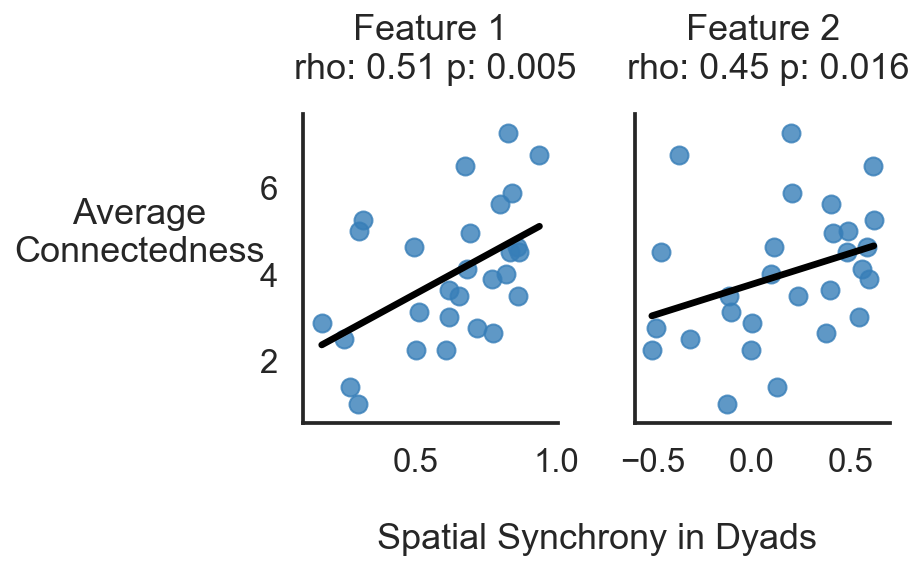

In [14]:
sns.set_context('talk')
# combine all 4 episodes print out temporal isc for each shared response
features = 2
n_iter = 20
seed = 100
# indexing just the 20 AUs
srm_data = np.concatenate([au_standardized_allsubs[epn][:,:20,:] for epn in epns],axis=2) 
srm_both = brainiak.funcalign.srm.DetSRM(n_iter=n_iter, features=features,rand_seed=seed)
srm_both.fit(srm_data)

f,ax = plt.subplots(1,2,figsize=(7,5),sharex=False,sharey=True)
for feature_num in range(features):
    weights = [s[:,feature_num] for s in srm_both.w_]
    w_isc = pd.DataFrame(weights).T.corr()
    w_isc_dyad = parse_triangle(w_isc.iloc[21:,21:],condition='pairs')
    r,p = stats.spearmanr(w_isc_dyad, average_conn_across_episodes)
    print(feature_num,r,p)
    
    ax[feature_num].set_title(f"Feature {feature_num+1}"+'\n rho: '+ str(np.round(r,2))  +' p: ' + str(np.round(p,3)),y=1.08)
    sns.regplot(y = average_conn_across_episodes,x = w_isc_dyad, ax=ax[feature_num], color='k',ci=False,truncate=True,scatter_kws={'color':colors[1]})

ax[0].set_ylabel('Average\nConnectedness',rotation=0,labelpad=60)
# for common label
f.add_subplot(111, frameon=False)
# plt.tick_params(which='both',labelcolor='none', top='off', bottom='off', left='off', right='off')
plt.gca().xaxis.set_major_locator(plt.NullLocator())
plt.gca().yaxis.set_major_locator(plt.NullLocator())
plt.grid(False)
plt.xlabel(f'Spatial Synchrony in Dyads',rotation=0,labelpad=50)
sns.despine()
plt.tight_layout()
# f.savefig('Figures/Synchrony_corr_connectedness.pdf',dpi=300)
plt.show()


## Fit SRM for each episode for episode level prediction.

/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/numpy/lib/type_check.py:546: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  'a.item() instead', DeprecationWarning, stacklevel=1)


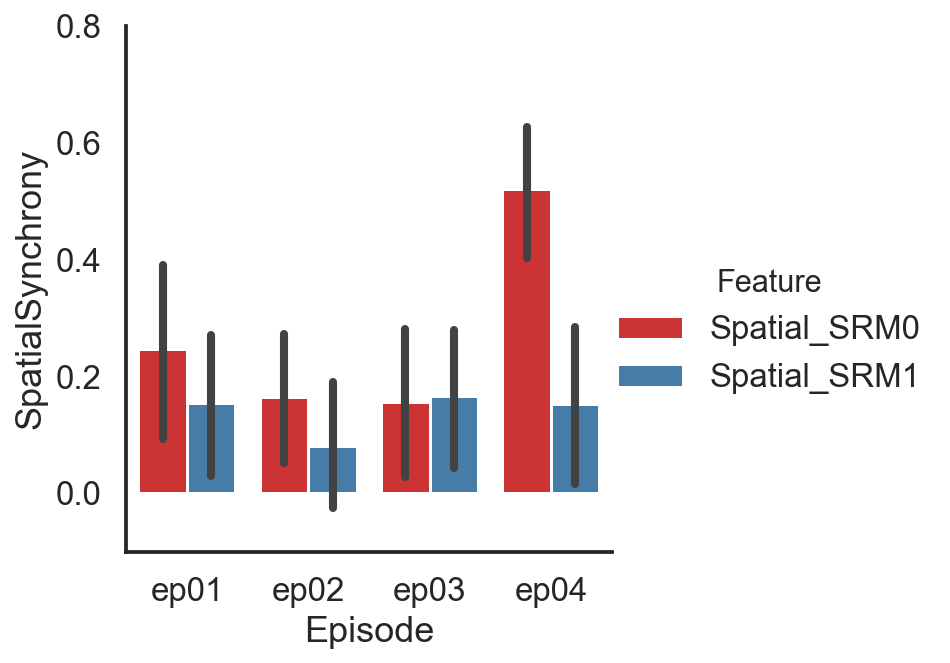

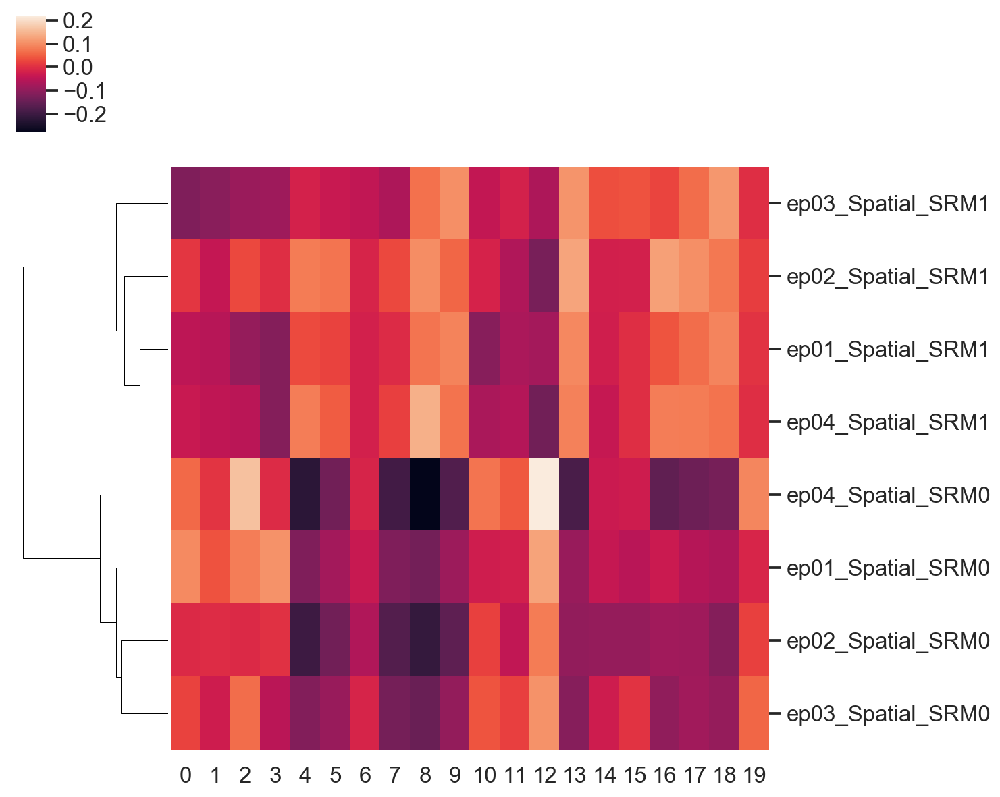

In [9]:
# Fit SRM for each episode
features = 2
n_iter = 20
seed = 100
exclude_friends = False

wsimdf = pd.DataFrame()
wsimdf_avg = pd.DataFrame()

tsimdf = pd.DataFrame()
srms_per_episode = {}
epns = [f'ep0{i}' for i in np.arange(1,5,1)]
for epn in epns:
    srm_data  = au_standardized_allsubs[epn][:,:20,:] # Just use 20 aus
    srm_both = brainiak.funcalign.srm.SRM(n_iter=n_iter, features=features,rand_seed=seed)
    srm_both.fit(srm_data)
    srms_per_episode[epn]=srm_both
    t_srm = np.array(srm_both.transform(srm_data))
    _wsimdf = pd.DataFrame()
    for feature_i in range(features):
        wsims = parse_triangle(pd.DataFrame([w[:,feature_i] for w in srm_both.w_]).T.corr().iloc[21:, 21:],condition='pairs')
        _wsimdf = pd.concat([_wsimdf ,pd.DataFrame({f'Spatial_SRM{feature_i}': wsims})], axis=1)
    _wsimdf['Episode'] = epn
    # concat spatial
    wsimdf = pd.concat([wsimdf, _wsimdf],axis=0)
    wsimdf_avg = pd.concat([wsimdf_avg, pd.DataFrame(np.mean(srm_both.w_,axis=0) , columns=[f'{epn}_Spatial_SRM0',f'{epn}_Spatial_SRM1'])], axis=1)
    # concat temporal
    tsimdf = pd.concat([tsimdf, pd.DataFrame({f'Temporal_SRM0': parse_triangle(np.corrcoef(t_srm[:,0,:])[21:, 21:], condition='pairs'),
                        f'Temporal_SRM1': parse_triangle(np.corrcoef(t_srm[:,1,:])[21:, 21:], condition='pairs'),
                        'Episode':epn, })])
wsimdf_long = wsimdf.melt(var_name='Feature',value_name='SpatialSynchrony',id_vars=['Episode'])
sns.catplot(x='Episode',y='SpatialSynchrony',hue='Feature',data=wsimdf_long,kind='bar',ci=95)
plt.ylim([-.1,.8])
# show that each average spatial weights of each SRM is well matched acrossed episodes 
# This allows us to consider SRM0s to be same and SRM1s to be the same. 
sns.clustermap(wsimdf_avg.T,col_cluster=False)

/Users/jinhyuncheong/.local/lib/python3.6/site-packages/matplotlib/colors.py:101: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  ret = np.asscalar(ex)


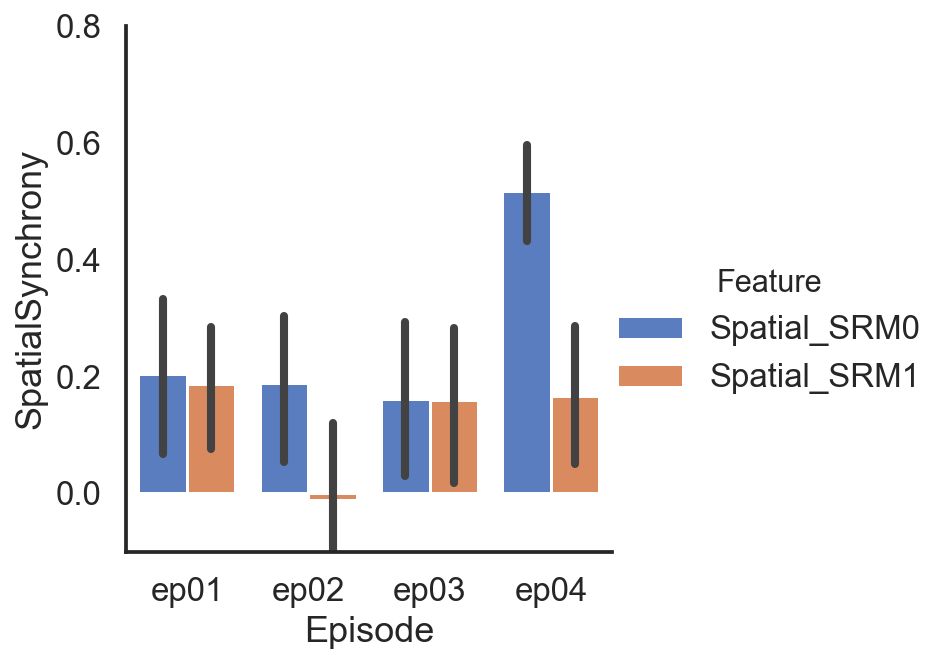

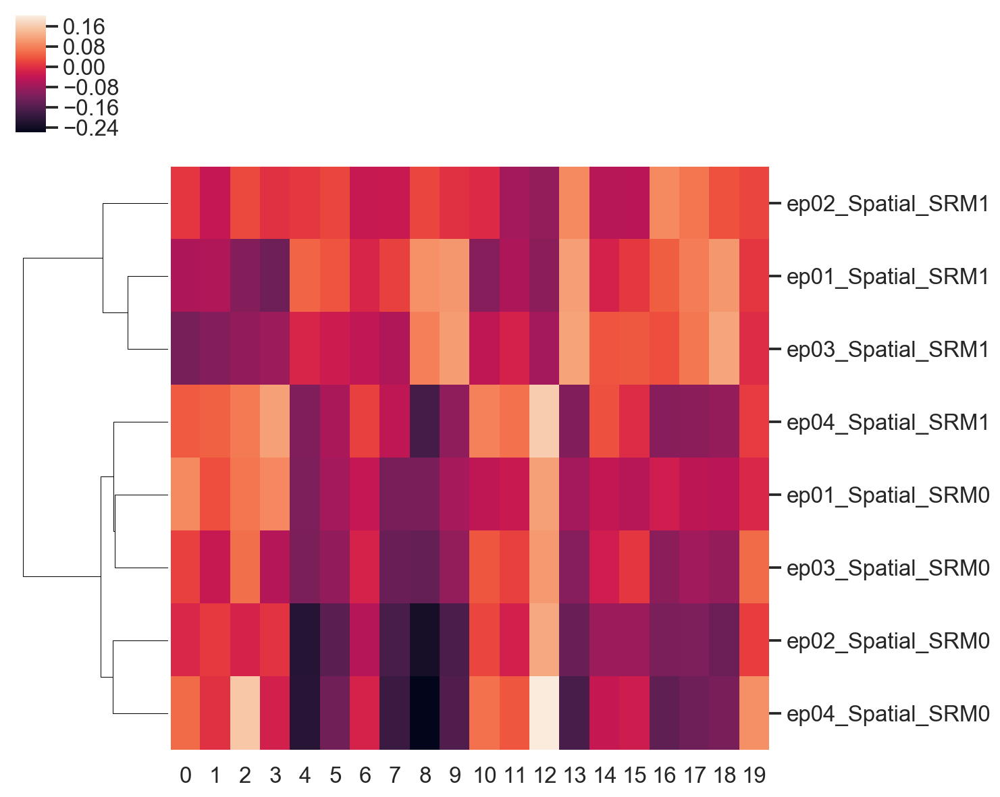

In [20]:
# Fit SRM for each episode
features = 2
n_iter = 20
seed = 100
exclude_friends = False

wsimdf = pd.DataFrame()
wsimdf_avg = pd.DataFrame()

tsimdf = pd.DataFrame()
srms_per_episode = {}
epns = [f'ep0{i}' for i in np.arange(1,5,1)]
for epn in epns:
    srm_data  = au_standardized_allsubs[epn][:,:20,:] # Just use 20 aus
    srm_both = brainiak.funcalign.srm.SRM(n_iter=n_iter, features=features,rand_seed=seed)
    srm_both.fit(srm_data)
    srms_per_episode[epn]=srm_both
    t_srm = np.array(srm_both.transform(srm_data))
    _wsimdf = pd.DataFrame()
    for feature_i in range(features):
        wsims = parse_triangle(pd.DataFrame([w[:,feature_i] for w in srm_both.w_]).T.corr().iloc[21:, 21:],condition='pairs')
        _wsimdf = pd.concat([_wsimdf ,pd.DataFrame({f'Spatial_SRM{feature_i}': wsims})], axis=1)
    _wsimdf['Episode'] = epn
    # concat spatial
    wsimdf = pd.concat([wsimdf, _wsimdf],axis=0)
    wsimdf_avg = pd.concat([wsimdf_avg, pd.DataFrame(np.mean(srm_both.w_,axis=0) , columns=[f'{epn}_Spatial_SRM0',f'{epn}_Spatial_SRM1'])], axis=1)
    # concat temporal
    tsimdf = pd.concat([tsimdf, pd.DataFrame({f'Temporal_SRM0': parse_triangle(np.corrcoef(t_srm[:,0,:])[21:, 21:], condition='pairs'),
                        f'Temporal_SRM1': parse_triangle(np.corrcoef(t_srm[:,1,:])[21:, 21:], condition='pairs'),
                        'Episode':epn, })])
wsimdf_long = wsimdf.melt(var_name='Feature',value_name='SpatialSynchrony',id_vars=['Episode'])
sns.catplot(x='Episode',y='SpatialSynchrony',hue='Feature',data=wsimdf_long,kind='bar',ci=95)
plt.ylim([-.1,.8])
# show that each average spatial weights of each SRM is well matched acrossed episodes 
# This allows us to consider SRM0s to be same and SRM1s to be the same. 
sns.clustermap(wsimdf_avg.T,col_cluster=False)

In [25]:
_dyad_list = np.tile(np.sort(np.unique([int(dyad.split('_')[0].split('s')[1] )for dyad in audict_dyad[epn][_onecolforcolname].columns])),4)

In [19]:
from scipy.signal import detrend
from statsmodels.tsa.tsatools import detrend

In [31]:
order = 1
_srm = detrend(_srmdf, order=order)
_tempdf = pd.concat([dm, _srm/_srm.std()],axis=1)

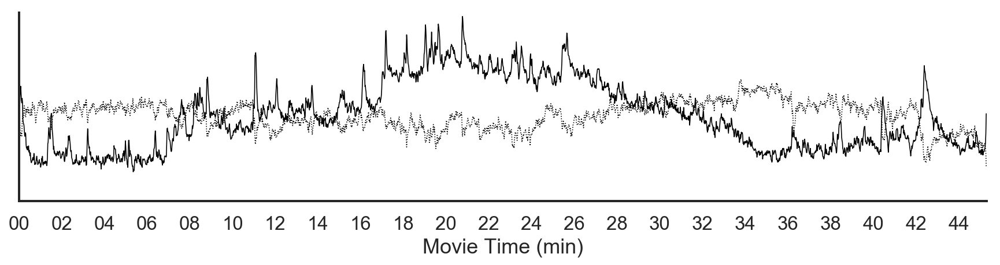

In [34]:
srm_no = 1 # 0 1
emotion_to_plot = 'Fear' # Joy Fear
color='Purple' # Orange, Purple
label = 'SR2' # SR1 SR2
order = 1
srm_no_dict = {0:{'emotion_to_plot': 'Joy', 'color':'Orange', 'label':'SR1', 'linestyle': '-'}, 
             1:{'emotion_to_plot': 'Fear', 'color':'Purple', 'label':'SR2', 'linestyle': 'dotted'}}
f,ax = plt.subplots(figsize=(15,3))
for srm_no in srm_no_dict.keys():
    emotion_to_plot = srm_no_dict[srm_no]['emotion_to_plot']
    color = srm_no_dict[srm_no]['color']
    label = srm_no_dict[srm_no]['label']
    _srmdf = pd.DataFrame(-srms_per_episode['ep01'].s_[srm_no,:], columns=['SRM'])
    # detrend
    _srm = detrend(_srmdf, order=order)
        
    # scale
    _tempdf = pd.concat([dm, _srm/_srm.std()],axis=1)
    
    #Old
#     _tempdf = pd.concat([dm, _srmdf/_srmdf.std()],axis=1)
#     _srm = detrend(_tempdf['SRM'], order=order)
    # _tempdf[['SRM']].plot(ax=ax, color='k')
    ax.plot(_srm, color='k', linewidth=.8, linestyle=srm_no_dict[srm_no]['linestyle'])
    ax.plot([0,0],[0,0],alpha=1,color=color)
    ax.set_yticklabels([])
    ax.set_xlabel('Movie Time (min)')
    ax.set_yticks([], [])
    ax.set(xlim=[0,2718])

#     plt.legend([label,emotion_to_plot], ncol=1,bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    ax2 = ax.twinx()
    ax2.set_yticks([], [])
    ax2.set(xlim=[0,2718])
#     _tempdf[[emotion_to_plot]].plot(ax=ax2, color=color, alpha=1, linewidth=.5)
#     ax2.get_legend().remove()
    ax2.set_yticklabels([])
    ax.set_xticks(range(0,2718,120))
    ax.set(title = '', xlim=[0,2718], xticklabels = [tick[:2] for tick in rec_to_time(ax.get_xticks(),TR=1)], ylim=[-2.5,3])
    sns.despine()

#     _tempdf['Detrend_SRM'] = _srm
#     for emotion in emotions:
#         _tempmat = _tempdf[[emotion,'SRM']].dropna().as_matrix()
# #         r,p = stats.pearsonr(_tempmat[:,0], _tempmat[:,1])
# #         print(srm_no, f'Correlation between SRM and {emotion} {r:.2f} {p:2f}',)
#         det_r, det_p = stats.pearsonr(detrend(_tempmat[:,0], order=order), detrend(_tempmat[:,1], order=order))
#         print(srm_no, f'Correlation between detrended order {order} SRM and {emotion} {det_r:.3f}, {det_p:.3f}',)
    
#     print(_tempdf[np.append(emotions,['SRM'])].corr()['SRM'].sort_values(ascending=False))
#     print(_tempdf[np.append(emotions,['Detrend_SRM'])].corr()['Detrend_SRM'].sort_values(ascending=False))
#     _tempmat = _tempdf[['Joy','SRM']].dropna().as_matrix()
#     print(srm_no, 'Correlation between SRM and Joy',stats.pearsonr(_tempmat[:,0], _tempmat[:,1]))
#     print(srm_no, f'Correlation between detrended order {order} SRM and Joy',stats.pearsonr(detrend(_tempmat[:,0], order=order), 
#                                                                                             detrend(_tempmat[:,1], order=order)))
#     _tempmat = _tempdf[['Fear','SRM']].dropna().as_matrix()
#     print(srm_no, 'Correlation between SRM and Fear',stats.pearsonr(_tempmat[:,0], _tempmat[:,1]))
#     print(srm_no, f'Correlation between detrended order {order} SRM and Fear',stats.pearsonr(detrend(_tempmat[:,0], order=order), 
#                                                                                              detrend(_tempmat[:,1], order=order)))

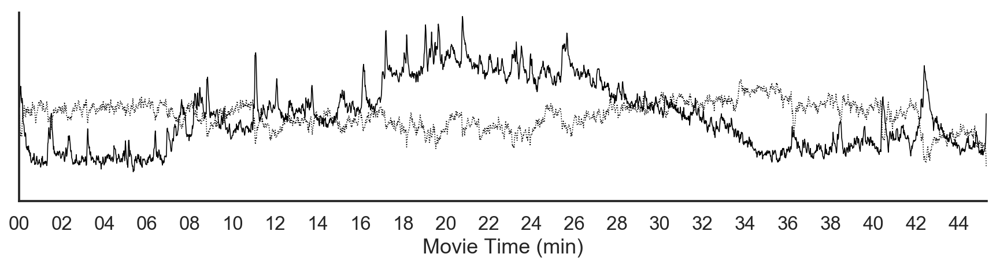

In [43]:
f,ax = plt.subplots(figsize=(15,3))
for srm_no in srm_no_dict.keys():
    emotion_to_plot = srm_no_dict[srm_no]['emotion_to_plot']
    color = srm_no_dict[srm_no]['color']
    label = srm_no_dict[srm_no]['label']
    _srmdf = pd.DataFrame(-srms_per_episode['ep01'].s_[srm_no,:], columns=['SRM'])
    # detrend
    _srm = detrend(_srmdf, order=order)
        
    # scale
    _tempdf = pd.concat([dm, _srm/_srm.std()],axis=1)

    ax.plot(_srm, color='k', linewidth=.8, linestyle=srm_no_dict[srm_no]['linestyle'])
    ax.plot([0,0],[0,0],alpha=1,color=color)
    ax.set_yticklabels([])
    ax.set_xlabel('Movie Time (min)')
    ax.set_yticks([], [])
    ax.set(xlim=[0,2718])

    #     plt.legend([label,emotion_to_plot], ncol=1,bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    ax.set_yticks([], [])
    ax.set(xlim=[0,2718])
    #     _tempdf[[emotion_to_plot]].plot(ax=ax2, color=color, alpha=1, linewidth=.5)
    #     ax2.get_legend().remove()
    ax.set_yticklabels([])
    ax.set_xticks(range(0,2718,120))
    ax.set(title = '', xlim=[0,2718], xticklabels = [tick[:2] for tick in rec_to_time(ax.get_xticks(),TR=1)], ylim=[-2.5,3])
    sns.despine()

In [264]:
for emotion in emotions:
    _tempmat = _tempdf[[emotion,'SRM']].dropna().as_matrix()
#     r,p = stats.pearsonr(_tempmat[:,0], _tempmat[:,1])
#     print(srm_no, f'Correlation between SRM and {emotion} {r:.2f} {p:2f}',)
    det_r, det_p = stats.pearsonr(detrend(_tempmat[:,0], order=order), detrend(_tempmat[:,1], order=order))
    print(srm_no, f'Correlation between detrended order {order} SRM and {emotion} {det_r:.2f}, {det_p:.2f}',)

1 Correlation between detrended order 2 SRM and Anger 0.16, 0.00
1 Correlation between detrended order 2 SRM and Disgust 0.11, 0.00
1 Correlation between detrended order 2 SRM and Fear 0.29, 0.00
1 Correlation between detrended order 2 SRM and Joy -0.38, 0.00
1 Correlation between detrended order 2 SRM and Sadness 0.23, 0.00
1 Correlation between detrended order 2 SRM and Surprise 0.09, 0.00


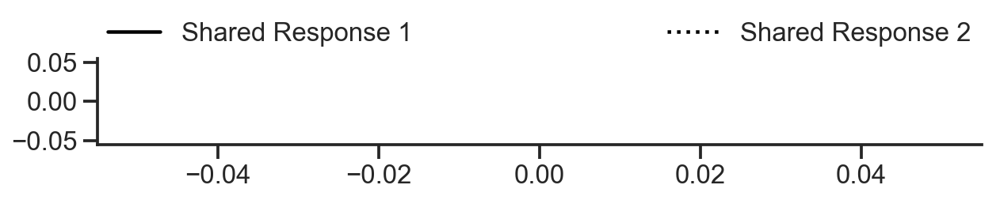

In [222]:
f,ax = plt.subplots(figsize=(10,1))
plt.plot([0,0],[0,0], linestyle='-', label='Shared Response 1', color='k')
plt.plot([0,0],[0,0], linestyle='dotted', label='Shared Response 2',color='k')
plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc='lower left',
           ncol=2, mode="expand", borderaxespad=0., frameon=False)
sns.despine()

In [70]:
for epn in epns: 
    _wsimdf = wsimdf.query('Episode==@epn')
    print(f'Pos {epn} SRM0-connection',stats.spearmanr(_wsimdf.Spatial_SRM0.values, r_df.query("Episode==@epn").mean_Connection.values))
print()
for epn in epns: 
    _wsimdf = wsimdf.query('Episode==@epn')
    print(f'Neg {epn} SRM1-connection',stats.spearmanr(_wsimdf.Spatial_SRM1.values, r_df.query("Episode==@epn").mean_Connection.values))

Pos ep01 SRM0-connection SpearmanrResult(correlation=0.1856869339989001, pvalue=0.3441342084390143)
Pos ep02 SRM0-connection SpearmanrResult(correlation=-0.3086272940040804, pvalue=0.11005761700324336)
Pos ep03 SRM0-connection SpearmanrResult(correlation=0.2152302288985605, pvalue=0.2713667461449603)
Pos ep04 SRM0-connection SpearmanrResult(correlation=-0.2403437702199999, pvalue=0.21796686636048537)

Neg ep01 SRM1-connection SpearmanrResult(correlation=0.3217102006578269, pvalue=0.09503123620424873)
Neg ep02 SRM1-connection SpearmanrResult(correlation=0.0618905001345081, pvalue=0.754385028238824)
Neg ep03 SRM1-connection SpearmanrResult(correlation=-0.15255782508135515, pvalue=0.4383346928083778)
Neg ep04 SRM1-connection SpearmanrResult(correlation=0.1407963505178947, pvalue=0.4748383543859124)


/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/pandas/core/indexes/api.py:87: RuntimeWarning: '<' not supported between instances of 'str' and 'int', sort order is undefined for incomparable objects
  result = result.union(other)


ep01 rho :  0.39786115724578597 p :  0.036016163812628905 permuted_p 0.04399120175964807
ep02 rho :  0.3578646252222002 p :  0.06151560481667059 permuted_p 0.0613877224555089
ep03 rho :  0.47279181827014566 p :  0.011061558022132661 permuted_p 0.012397520495900819
ep04 rho :  0.20624465407894726 p :  0.29235886267793404 permuted_p 0.2803439312137572


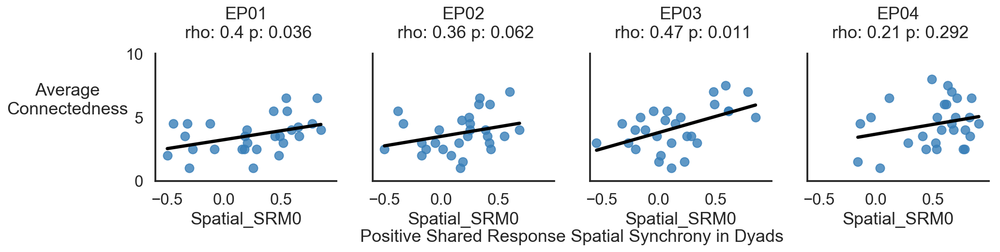

ep01 rho :  -0.08856687342295234 p :  0.6540323181933605 permuted_p 0.6440711857628474
ep02 rho :  0.2621406516808277 p :  0.17779285548210869 permuted_p 0.16636672665466906
ep03 rho :  0.08521247887427043 p :  0.6663737770167031 permuted_p 0.6638672265546891
ep04 rho :  0.20349472535789462 p :  0.29898276357854925 permuted_p 0.3059388122375525


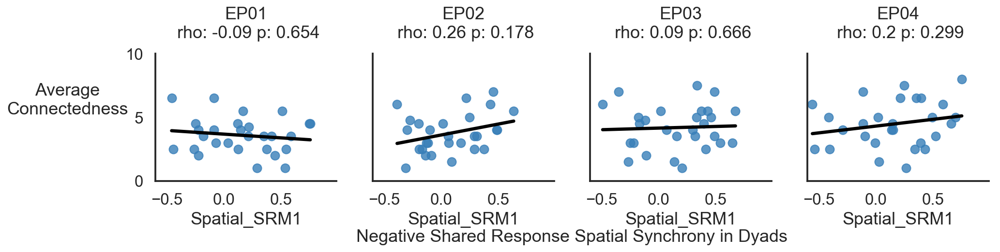

In [12]:
_df = pd.concat([wsimdf,combined_r_df.mean_Connection])
sns.set_style('white')
exclude_friends=False
for spatial_srm, title in zip(['Spatial_SRM0', 'Spatial_SRM1'],['Positive', 'Negative']):
    f,ax = plt.subplots(1,len(epns),figsize=(15,5),sharex=True,sharey=True)
    ax[0].set_ylim([0,10])
    ax[0].set_xlim([-.6,.99])
    rdf = pd.DataFrame()
    epns=['ep01','ep02','ep03','ep04']
    for i, epn in enumerate(epns):
        dyadcorr = _df.query('Episode==@epn')[spatial_srm]
        dyadconn = connection[epn].values
        dyads_friends_bool = ~connection['ep01'].index.isin(dyads_friends)
        if exclude_friends:
            # Results similar for both episode 1&2
            dyadcorr = dyadcorr[dyads_friends_bool]
            dyadconn = dyadconn[dyads_friends_bool]
        r, p = stats.spearmanr(dyadconn, dyadcorr)
        rs = []
        permuteidx = range(len(dyadcorr))
        rs = [stats.spearmanr(dyadcorr.values[np.random.permutation(permuteidx)], dyadconn)[0] for permute_i in range(5000)]
        permuted_p = nlstats._calc_pvalue(rs, r, tail=2)

        print(epn, 'rho : ',r,'p : ',p, 'permuted_p', permuted_p)
        ax[i].set_title(epn.upper()+'\n rho: '+ str(np.round(r,2))  +' p: ' + str(np.round(p,3)),y=1.08)
        sns.regplot(y = dyadconn,x = dyadcorr,ax=ax[i],color='k',ci=False,truncate=True,scatter_kws={'color':colors[1]})

    ax[0].set_ylabel('Average\nConnectedness',rotation=0,labelpad=60)
    # for common label
    f.add_subplot(111, frameon=False)
    # plt.tick_params(which='both',labelcolor='none', top='off', bottom='off', left='off', right='off')
    plt.gca().xaxis.set_major_locator(plt.NullLocator())
    plt.gca().yaxis.set_major_locator(plt.NullLocator())
    plt.grid(False)
    plt.xlabel(f'{title} Shared Response Spatial Synchrony in Dyads',rotation=0,labelpad=50)
    sns.despine()
    plt.tight_layout()
    # f.savefig('Figures/Synchrony_corr_connectedness.pdf',dpi=300)
    plt.show()

/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/pandas/core/indexes/api.py:87: RuntimeWarning: '<' not supported between instances of 'str' and 'int', sort order is undefined for incomparable objects
  result = result.union(other)


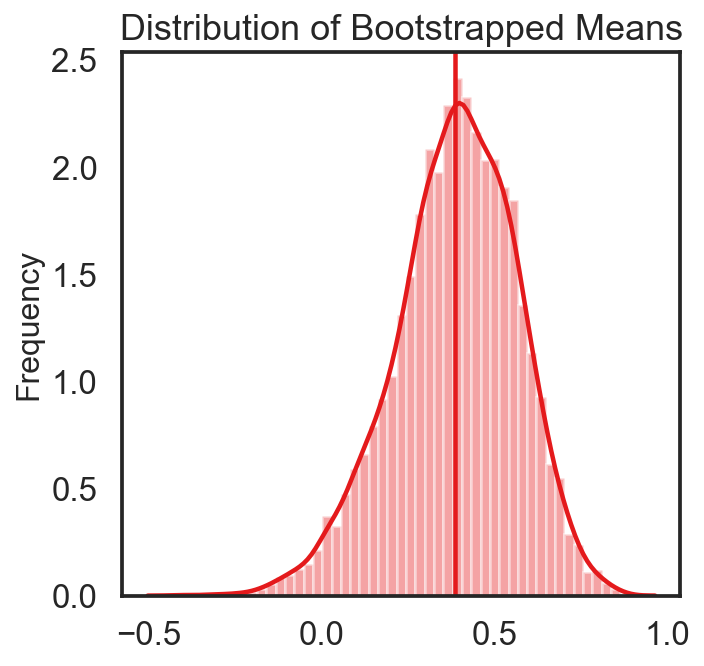

Bootstrapped Mean: 0.387
Bootstrapped Std: 0.176
95% Confidence Intervals: [0.0117, 0.7]


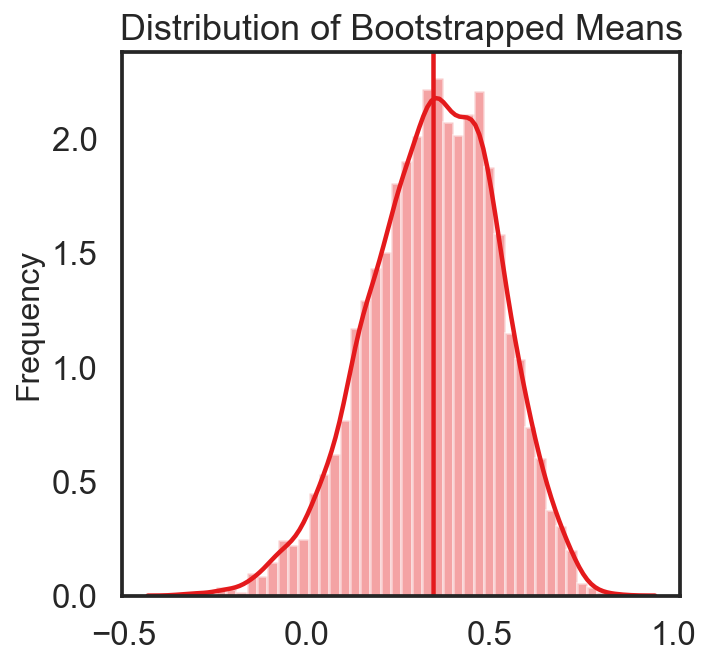

Bootstrapped Mean: 0.346
Bootstrapped Std: 0.175
95% Confidence Intervals: [-0.0231, 0.659]


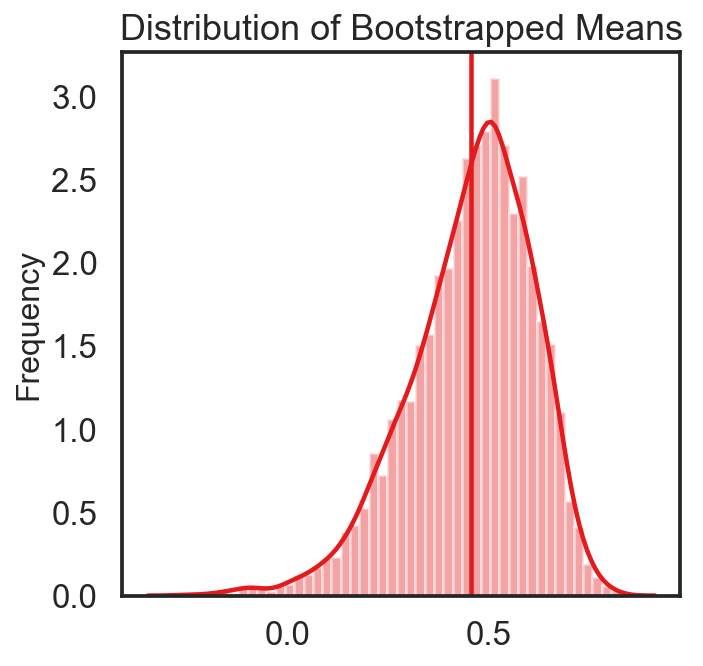

Bootstrapped Mean: 0.456
Bootstrapped Std: 0.152
95% Confidence Intervals: [0.114, 0.699]


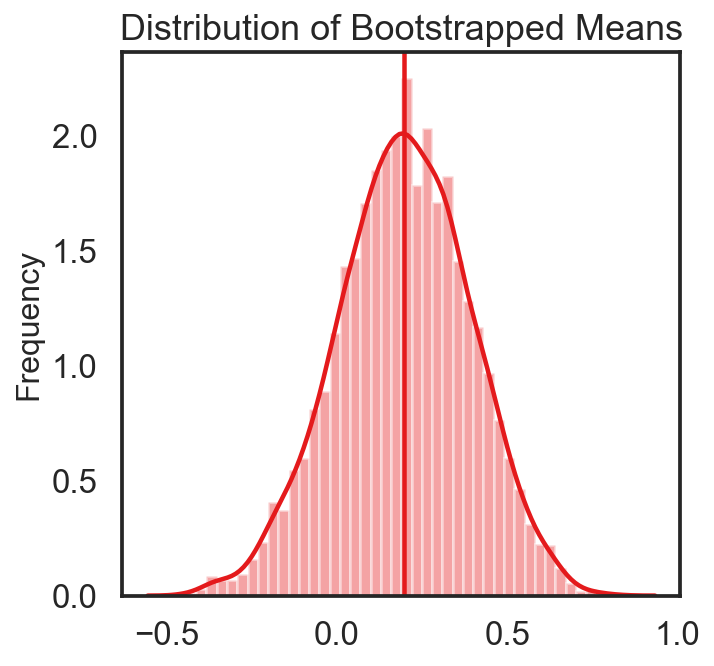

Bootstrapped Mean: 0.196
Bootstrapped Std: 0.194
95% Confidence Intervals: [-0.194, 0.562]


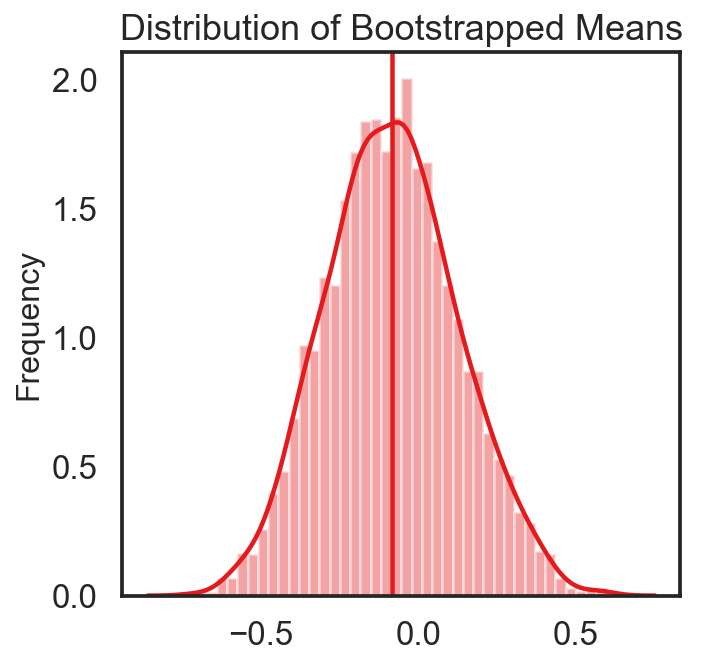

Bootstrapped Mean: -0.0837
Bootstrapped Std: 0.21
95% Confidence Intervals: [-0.478, 0.342]


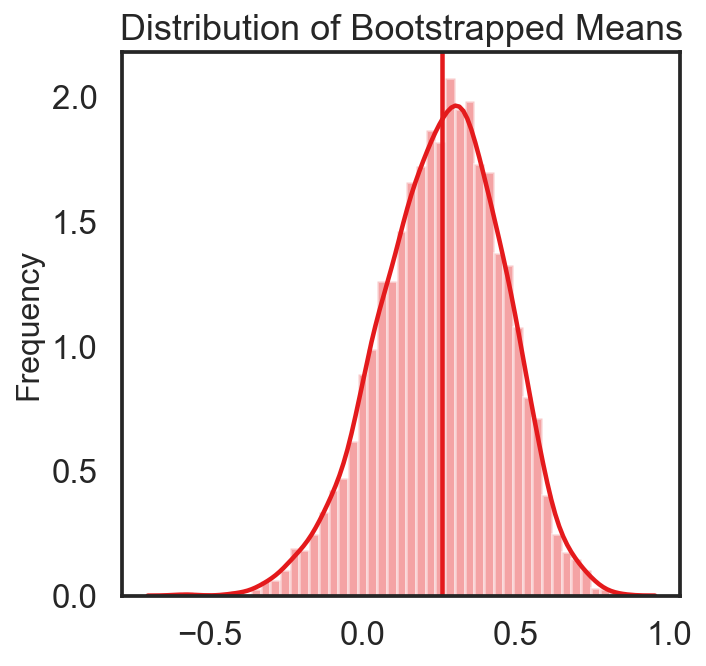

Bootstrapped Mean: 0.258
Bootstrapped Std: 0.199
95% Confidence Intervals: [-0.155, 0.612]


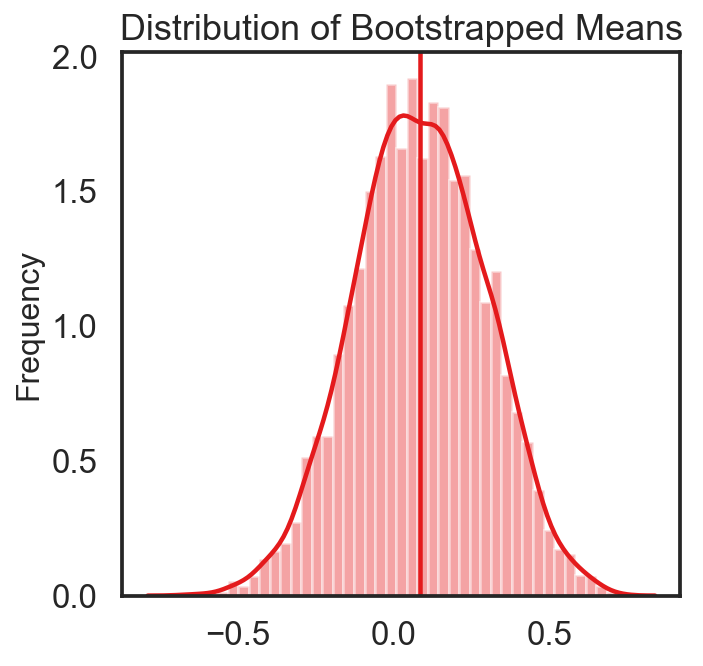

Bootstrapped Mean: 0.0835
Bootstrapped Std: 0.209
95% Confidence Intervals: [-0.321, 0.481]


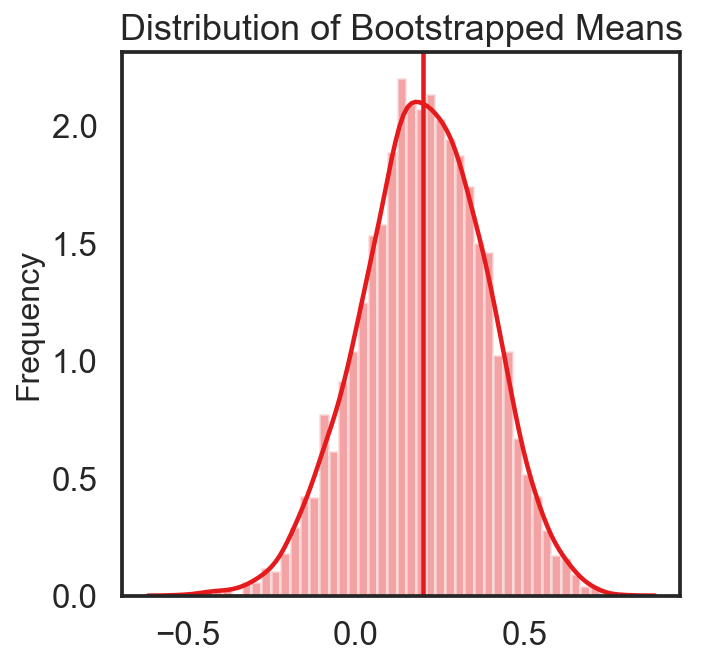

Bootstrapped Mean: 0.2
Bootstrapped Std: 0.184
95% Confidence Intervals: [-0.169, 0.545]


In [14]:
_df = pd.concat([wsimdf,combined_r_df.mean_Connection])
sns.set_style('white')
exclude_friends=False
for spatial_srm, title in zip(['Spatial_SRM0', 'Spatial_SRM1'],['Positive', 'Negative']):
    epns=['ep01','ep02','ep03','ep04']
    for i, epn in enumerate(epns):
        dyadcorr = _df.query('Episode==@epn')[spatial_srm]
        dyadconn = connection[epn].values
        dyads_friends_bool = ~connection['ep01'].index.isin(dyads_friends)
        if exclude_friends:
            # Results similar for both episode 1&2
            dyadcorr = dyadcorr[dyads_friends_bool]
            dyadconn = dyadconn[dyads_friends_bool]
        bootstrap_means = []
        indices = np.array(range(len(dyadcorr)))
        for i in range(5000):
            new_indices = np.random.choice(indices, size=len(indices), replace=True)
            r, p = stats.spearmanr(dyadconn[new_indices], dyadcorr[new_indices])
            bootstrap_means.append(r)

        sns.distplot(bootstrap_means, kde=True, label='Bootstrap')
        plt.axvline(x=np.mean(bootstrap_means), ymin=0, ymax=1, linestyle='-')
        plt.title('Distribution of Bootstrapped Means', fontsize=18)
        plt.ylabel('Frequency', fontsize=16)
        plt.show()

        lower_bound = np.percentile(bootstrap_means, 2.5)
        upper_bound = np.percentile(bootstrap_means, 97.5)
        print(f'Bootstrapped Mean: {np.mean(bootstrap_means):.3}')
        print(f'Bootstrapped Std: {np.std(bootstrap_means):.3}')
        print(f'95% Confidence Intervals: [{lower_bound:.3}, {upper_bound:.3}]')

In [48]:
wsimdf.to_csv('SpatialSimilarityForEachEpisode.csv', index=False)
tsimdf.to_csv('TemporalSimilarityForEachEpisode.csv', index=False)

In [137]:
spatialsimilarities = parse_triangle(np.corrcoef(np.array(srm_both.w_)[:,:,0]), condition='pairs')
stats.ttest_1samp(spatialsimilarities,0)

Ttest_1sampResult(statistic=5.935317522452678, pvalue=7.681788957696014e-07)

In [121]:
srm_both_ws = []
for epn in epns:
    print(epn)
    srm_data  = au_standardized_allsubs[epn][:,:20,:] # Just use 20 aus
    srm_both = brainiak.funcalign.srm.SRM(n_iter=n_iter, features=features,rand_seed=seed)
    srm_both.fit(srm_data)
    srm_both_ws.append(srm_both.w_)
    spatialsimilarities0 = parse_triangle(np.corrcoef(np.array(srm_both.w_)[:,:,0]), condition='pairs')
    print(f'{epn} Spatial SRM0 Similarity Significance', stats.ttest_1samp(spatialsimilarities0,0))
    spatialsimilarities1 = parse_triangle(np.corrcoef(np.array(srm_both.w_)[:,:,1]), condition='pairs')
    print(f'{epn} Spatial SRM1 Similarity Significance', stats.ttest_1samp(spatialsimilarities1,0))
    print('Difference Between SRMs ', stats.ttest_1samp(spatialsimilarities0-spatialsimilarities1,0))

ep01
ep01 Spatial SRM0 Similarity Significance Ttest_1sampResult(statistic=2.2754290132114887, pvalue=0.028765422832704283)
ep01 Spatial SRM1 Similarity Significance Ttest_1sampResult(statistic=1.8019863148464474, pvalue=0.07969976102401174)
Difference Between SRMs  Ttest_1sampResult(statistic=-0.06980444550737135, pvalue=0.944725224703703)
ep02
ep02 Spatial SRM0 Similarity Significance Ttest_1sampResult(statistic=1.3255190259183938, pvalue=0.19312566482210644)
ep02 Spatial SRM1 Similarity Significance Ttest_1sampResult(statistic=1.127174963494547, pvalue=0.2669255976133789)
Difference Between SRMs  Ttest_1sampResult(statistic=0.21689990148332003, pvalue=0.8294779229602199)
ep03
ep03 Spatial SRM0 Similarity Significance Ttest_1sampResult(statistic=1.2798877562118682, pvalue=0.20855164791329717)
ep03 Spatial SRM1 Similarity Significance Ttest_1sampResult(statistic=1.6440391547186626, pvalue=0.1086398275494612)
Difference Between SRMs  Ttest_1sampResult(statistic=-0.0024847663035954164, 

/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


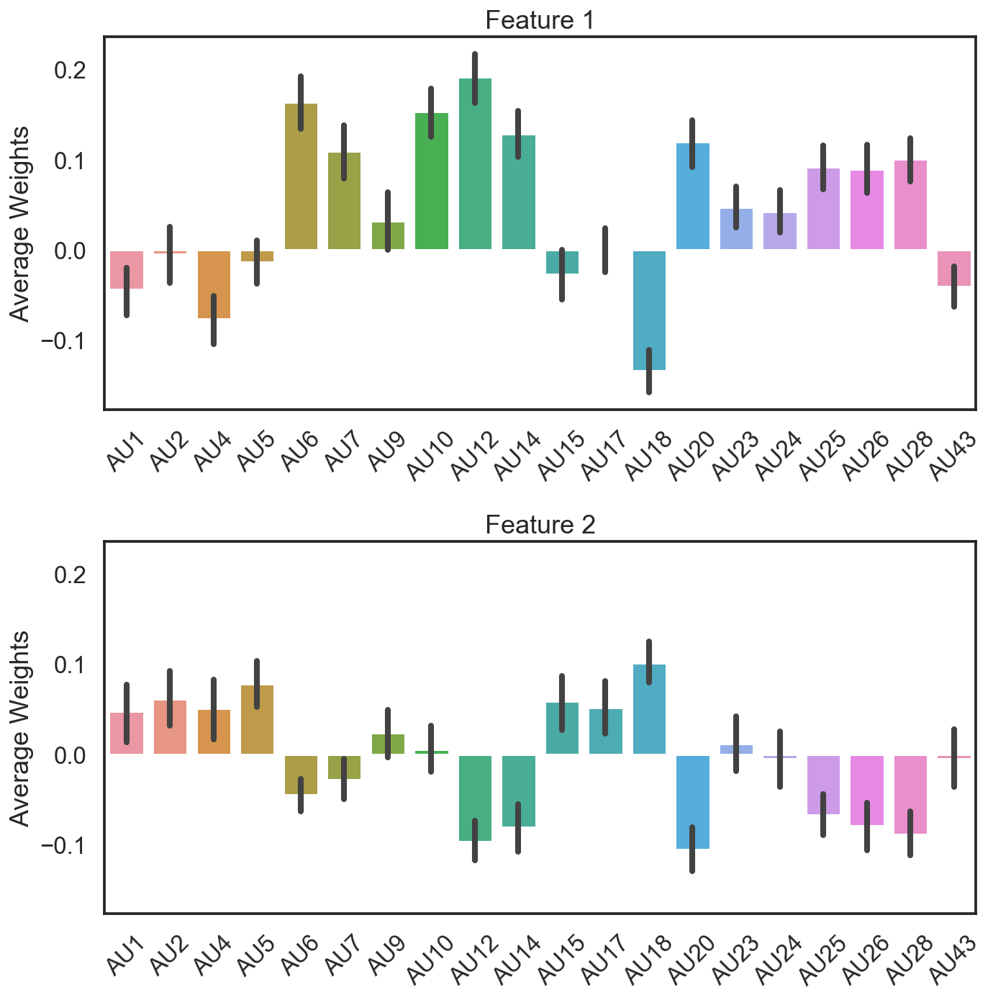

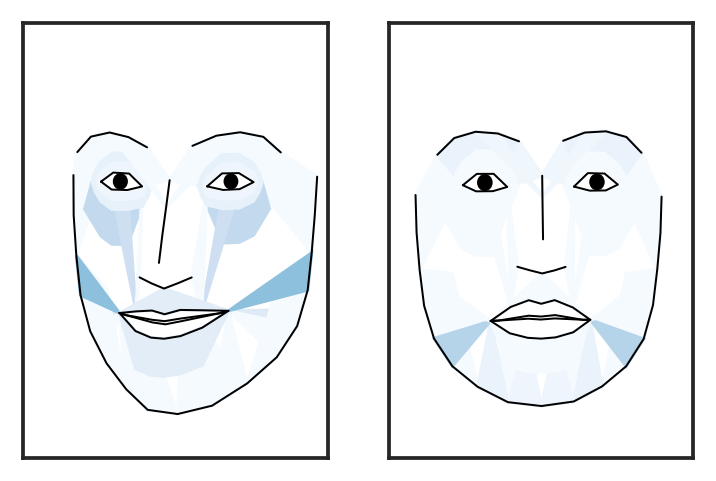

In [122]:
srm_both_average = np.mean(srm_both_ws,axis=0)

sns.set_context('talk')
au_list = [au.split(' ')[0] for au in aulist if 'AU' in au]
f, axes = plt.subplots(2,1,figsize=(10,10),sharey=True)
w1 = -1*np.array([w[:,0] for w in srm_both_average])
sns.barplot(data=w1,ci=95,ax=axes[0])
w2 = -1*np.array([w[:,1] for w in srm_both_average])
sns.barplot(data=w2, ci=95,ax=axes[1])
axes[0].set(xticklabels=au_list,ylabel='Average Weights', title='Feature 1')
axes[0].set_xticklabels(au_list,rotation=45)
axes[1].set(xticklabels=au_list,ylabel='Average Weights', title='Feature 2')
axes[1].set_xticklabels(au_list,rotation=45)
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1,2,figsize=(6,4))
muscles = {'all': 'heatmap'}
wmean = 300*np.mean(w1,axis=0)**3
wmean[wmean<0] = 0
plot_face(model=None, ax= axes[0], au = wmean, muscles = muscles,color = 'k',linewidth=1,)
wmean = 1500*np.mean(w2,axis=0)**3
wmean[wmean<0] = 0
plot_face(model=None, ax= axes[1], au = wmean, muscles = muscles,color = 'k',linewidth=1)
plt.show()

<function matplotlib.pyplot.tight_layout>

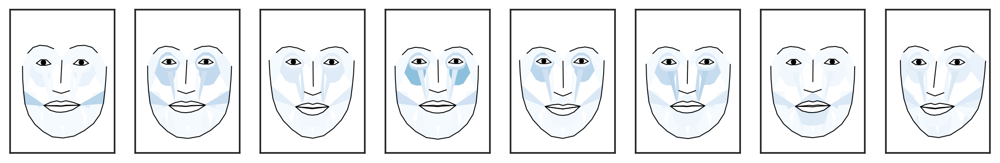

In [132]:
fig, axes = plt.subplots(1,8,figsize=(20,3))
muscles = {'all': 'heatmap'}
wmean = 30*(w1**3)
wmean[wmean<0] = 0
plot_face(model=None, ax= axes[0], au = wmean[28,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[1], au = wmean[37,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[2], au = wmean[48,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[3], au = wmean[58,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[4], au = wmean[34,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[5], au = wmean[41,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[6], au = wmean[54,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[7], au = wmean[75,:], muscles = muscles,color = 'k',linewidth=1,)
# wmean = 1500*(w2)**3
# wmean[wmean<0] = 0
# plot_face(model=None, ax= axes[1], au = wmean, muscles = muscles,color = 'k',linewidth=1)
# plt.show()

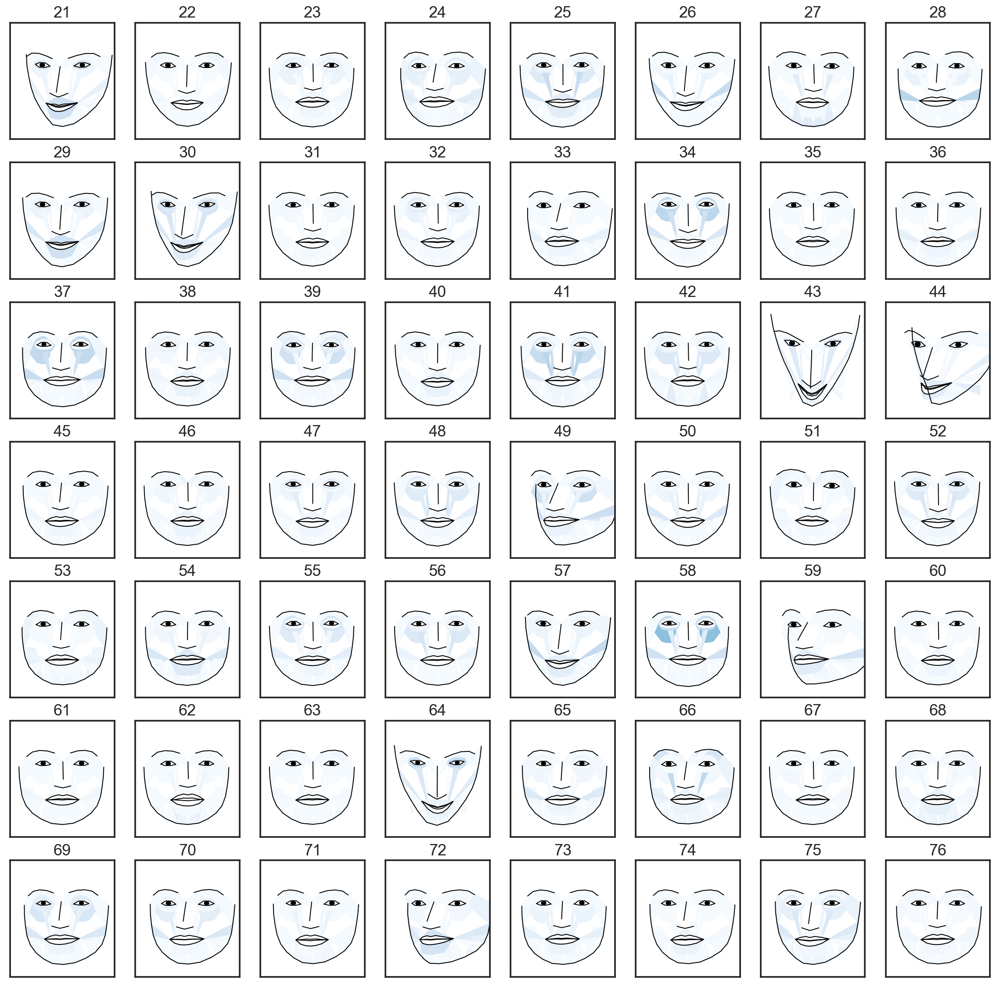

In [129]:
# Plot all positive subject faces
wmean = 30*(w1**3)
wmean[wmean<0] = 0
f,axes = plt.subplots(7,8, figsize=(20,20))
axes = axes.flatten()
for ix,i in enumerate(range(21,77)):
    plot_face(model=None, ax= axes[ix], au = wmean[i,:], muscles = muscles,color = 'k',linewidth=1)
    axes[ix].set(title=f"{i}")

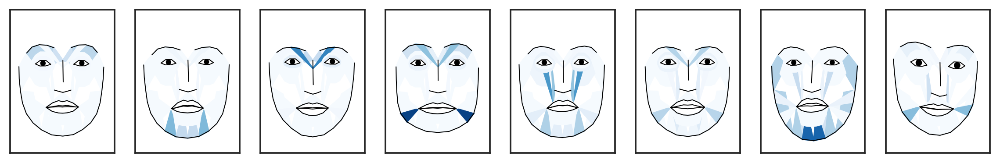

In [137]:
fig, axes = plt.subplots(1,8,figsize=(20,3))
muscles = {'all': 'heatmap'}
wmean = 100*(w2)**3
wmean[wmean<0] = 0
plot_face(model=None, ax= axes[0], au = wmean[26,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[1], au = wmean[49,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[2], au = wmean[64,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[3], au = wmean[75,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[4], au = wmean[54,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[5], au = wmean[57,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[6], au = wmean[63,:], muscles = muscles,color = 'k',linewidth=1,)
plot_face(model=None, ax= axes[7], au = wmean[68,:], muscles = muscles,color = 'k',linewidth=1,)
plt.show()

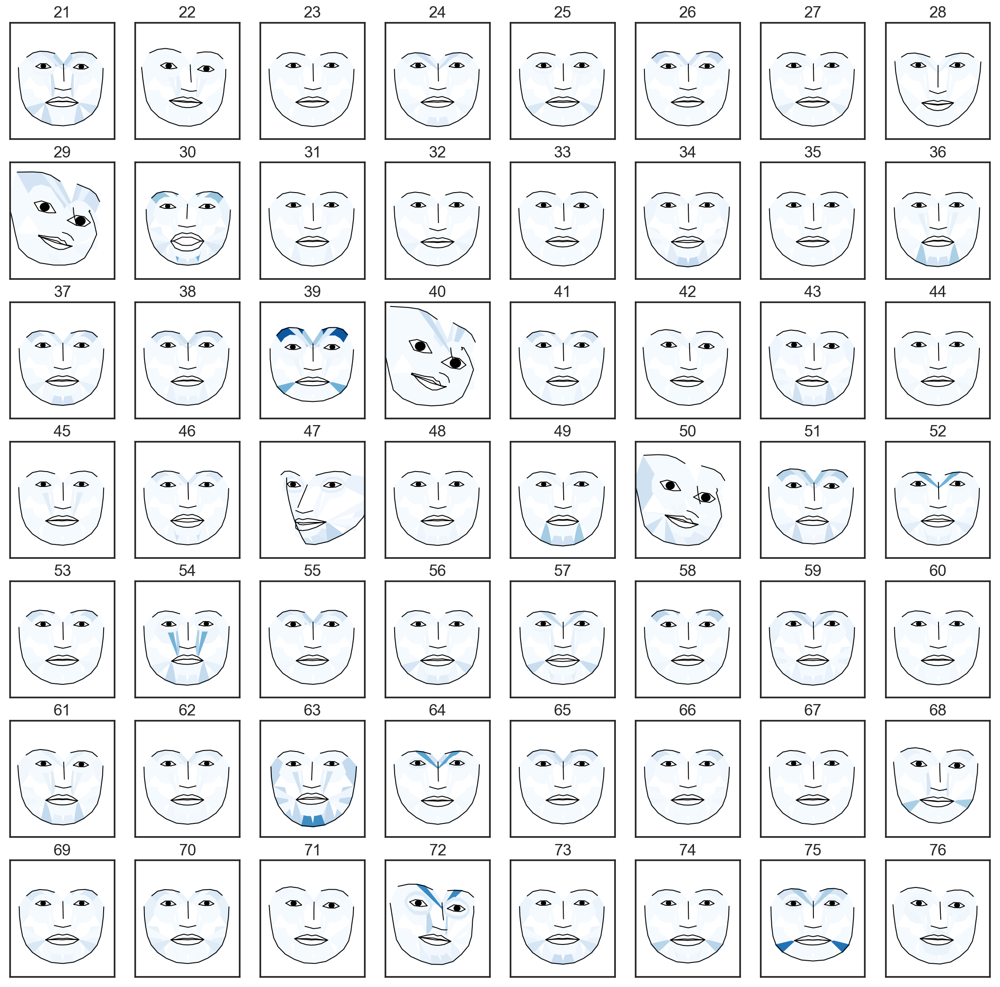

In [136]:
# Plot all negative subject faces
wmean = 80*(w2**3)
wmean[wmean<0] = 0
f,axes = plt.subplots(7,8, figsize=(20,20))
axes = axes.flatten()
for ix,i in enumerate(range(21,77)):
    plot_face(model=None, ax= axes[ix], au = wmean[i,:], muscles = muscles,color = 'k',linewidth=1)
    axes[ix].set(title=f"{i}")
plt.show()

# Impression analysis results

In [90]:
from scipy.spatial.distance import squareform, pdist
# All characters
char_list = ['BillyRiggins', 'BuddyGarrity', 'CoachTaylor', 'GrandmaSaracen',
       'JasonStreet', 'JulieTaylor', 'LandryClarke', 'LylaGarrity',
       'MattSaracen', 'SmashWilliams', 'TamiTaylor', 'TimRiggins',
       'TyraCollette']
char=char_list
dims = [u'annoy', u'like',u'attractive',u'friends',u'be',u'remind',u'relate',u'care']
# dims = [u'like']
metric_beh = 'correlation' # sqeuclidean, correlation
emotion = 'Positive Evidence'
x,y,eps,sub_row,sub_col = [],[],[],[],[]
# Single: Liking rating corr vs fex corr
rank = False
rtoz = False
alljoys_solo, alljoys_dyad = {},{}
epns = ['ep01','ep02','ep03','ep04']
for epn in epns: 
    print(emotion)
    alljoys_solo[epn] = emdict_solo[epn][emotion]
    alljoys_dyad[epn] = emdict_dyad[epn][emotion]
    
for i,epn in enumerate(epns):
    _sublist = alone_sublist
    joys = alljoys_solo[epn][_sublist].corr()
#     joys = pd.DataFrame(squareform(pdist(alljoys_solo[epn][_sublist].T,metric='correlation')))
    behs = 1-grab_pairwise_dist(beh_dat,_sublist,epn, dim=dims, char=char, metric=metric_beh)
#     behs = 1/(1+grab_pairwise_dist(beh_dat,_sublist,epn, dim=dims, char=char, metric=metric_beh))
    behs.columns= _sublist
    behs.index = _sublist
    if rank:
        x.extend(stats.rankdata(parse_triangle(joys)))
        y.extend(stats.rankdata(parse_triangle(behs)))
    elif rtoz:
        x.extend(nlstats.fisher_r_to_z(parse_triangle(joys)))
        y.extend(nlstats.fisher_r_to_z(parse_triangle(behs)))
    else:
        x.extend(parse_triangle(joys))
        y.extend(parse_triangle(behs))     
    eps.extend(np.repeat([epn],len(parse_triangle(joys))))
    df_row,df_col = grab_subIDs(behs)
    sub_row.extend(df_row)
    sub_col.extend(df_col)
r_df_sing = pd.DataFrame({'Episode':eps,'JoySim':x,'ImpSim':y,'Cond':'Alone','sub1':sub_row,'sub2':sub_col})
x,y,eps,sub_row,sub_col = [],[],[],[],[]
# Dyad nonPair: Liking rating corr vs fex corr
for i,epn in enumerate(['ep01','ep02','ep03','ep04']):
    _sublist = alldyads
    joys = alljoys_dyad[epn][_sublist].corr()
#     joys = pd.DataFrame(squareform(pdist(alljoys_dyad[epn][_sublist].T,metric='correlation')))
    behs = 1-grab_pairwise_dist(beh_dat,_sublist,epn, dim=dims, char=char, metric=metric_beh)
#     behs = 1/(1+grab_pairwise_dist(beh_dat,_sublist,epn, dim=dims, char=char, metric=metric_beh))
    behs.columns= _sublist
    behs.index = _sublist
    if rank:
        x.extend(stats.rankdata(parse_triangle(joys,condition='nonpairs')))
        y.extend(stats.rankdata(parse_triangle(behs,condition='nonpairs')))
    elif rtoz:
        x.extend(nlstats.fisher_r_to_z(parse_triangle(joys,condition='nonpairs')))
        y.extend(nlstats.fisher_r_to_z(parse_triangle(behs,condition='nonpairs')))
    else:
        x.extend(parse_triangle(joys,condition='nonpairs'))
        y.extend(parse_triangle(behs,condition='nonpairs'))        
    eps.extend(np.repeat([epn],len(parse_triangle(joys,condition='nonpairs'))))
    sub_row.extend(parse_triangle(behs.apply(lambda x:x.index),condition='nonpairs'))
    sub_col.extend(parse_triangle(behs.apply(lambda x:x.index).T,condition='nonpairs'))
r_df_np = pd.DataFrame({'Episode':eps,'JoySim':x,'ImpSim':y,'Cond':'Dyad_NP','sub1':sub_row,'sub2':sub_col})
x,y,eps,sub_row,sub_col = [],[],[],[],[]
# Dyad Pair: Liking rating corr vs fex corr
for i,epn in enumerate(['ep01','ep02','ep03','ep04']):
    _sublist = alldyads
    joys = alljoys_dyad[epn][_sublist].corr()
#     joys = pd.DataFrame(squareform(pdist(alljoys_dyad[epn][_sublist].T,metric='correlation')))
    behs = 1-grab_pairwise_dist(beh_dat,_sublist,epn, dim=dims, char=char, metric=metric_beh)
#     behs = 1/(1+grab_pairwise_dist(beh_dat,_sublist,epn, dim=dims, char=char, metric=metric_beh))
    behs.columns= _sublist
    behs.index = _sublist
    if rank:
        x.extend(stats.rankdata(parse_triangle(joys,condition='pairs')))
        y.extend(stats.rankdata(parse_triangle(behs,condition='pairs')))
    elif rtoz:
        x.extend(nlstats.fisher_r_to_z(parse_triangle(joys,condition='pairs')))
        y.extend(nlstats.fisher_r_to_z(parse_triangle(behs,condition='pairs')))
    else:
        x.extend(parse_triangle(joys,condition='pairs'))
        y.extend(parse_triangle(behs,condition='pairs'))       
    eps.extend(np.repeat([epn],len(parse_triangle(joys,condition='pairs'))))
    sub_row.extend(parse_triangle(behs.apply(lambda x:x.index),condition='pairs'))
    sub_col.extend(parse_triangle(behs.apply(lambda x:x.index).T,condition='pairs'))
r_df_p = pd.DataFrame({'Episode':eps,'JoySim':x,'ImpSim':y,'Cond':'Dyad_P','sub1':sub_row,'sub2':sub_col})

# solos, pairs, nonpairs
allr_df = pd.DataFrame()
allr_df = pd.concat([r_df_sing,r_df_np,r_df_p])
allr_df = allr_df.reset_index(drop=True)
allr_df['ImpSim_st'] = (allr_df['ImpSim']-allr_df['ImpSim'].mean())/allr_df['ImpSim'].std()
allr_df['Episode_c'] = allr_df.Episode.apply(lambda x: int(x[-1])-2.5)

Positive Evidence
Positive Evidence
Positive Evidence
Positive Evidence


In [35]:
alonedyad_df = allr_df.query('Cond!="Dyad_NP"').reset_index(drop=True)
alonedyad_df['ImpSim_dm']=alonedyad_df.ImpSim-alonedyad_df.ImpSim.mean()
alonedyad_df['JoySim_dm']=alonedyad_df.JoySim-alonedyad_df.JoySim.mean()

In [36]:
%%R -i alonedyad_df
alonedyad_df$Cond <-as.factor(alonedyad_df$Cond)
m0<-lmer('ImpSim ~ Cond + Episode_c + (1+Episode_c|sub1) + (1+Episode_c|sub2)', data = alonedyad_df)
summary(m0)

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: "ImpSim ~ Cond + Episode_c + (1+Episode_c|sub1) + (1+Episode_c|sub2)"
   Data: alonedyad_df

REML criterion at convergence: -1376

Scaled residuals: 
   Min     1Q Median     3Q    Max 
-4.059 -0.624 -0.016  0.643  3.019 

Random effects:
 Groups   Name        Variance Std.Dev. Corr 
 sub1     (Intercept) 0.005533 0.0744        
          Episode_c   0.000494 0.0222   -0.11
 sub2     (Intercept) 0.002892 0.0538        
          Episode_c   0.000346 0.0186   0.19 
 Residual             0.011119 0.1054        
Number of obs: 952, groups:  sub1, 48; sub2, 48

Fixed effects:
            Estimate Std. Error       df t value             Pr(>|t|)    
(Intercept)  0.37801    0.02143 50.72383   17.64 < 0.0000000000000002 ***
CondDyad_P   0.05325    0.02931 61.13347    1.82              0.07420 .  
Episode_c    0.02527    0.00624 56.96285    4.05              0.00016 ***
---
Signif. codes:  0 ‘***’ 0.

In [443]:
from scipy import stats
print("Alone: ISRSA: Face similarity ~ Impression similarity")
alone_df = allr_df.query('Cond=="Alone"').reset_index(drop=True)
for epn in epns: 
    _dat = alone_df.query('Episode==@epn')
    matperm = nlstats.matrix_permutation(_dat.JoySim, _dat.ImpSim)
    print(epn,matperm['correlation'],matperm['p'])
print("Dyad: ISRSA: Face similarity ~ Impression similarity")
dyad_df = allr_df.query('Cond=="Dyad_P"').reset_index(drop=True)
for epn in epns: 
    _dat = dyad_df.query('Episode==@epn')
    matperm = nlstats.matrix_permutation(_dat.JoySim, _dat.ImpSim)
    print(epn,matperm['correlation'],matperm['p'])

Alone: ISRSA: Face similarity ~ Impression similarity
ep01 0.20187629781044597 0.033593281343731254
ep02 0.130538107440078 0.20495900819836033
ep03 -0.14132034092123888 0.041591681663667265
ep04 0.24406449125830518 0.08818236352729454
Dyad: ISRSA: Face similarity ~ Impression similarity
ep01 0.15873015873015872 0.41291741651669667
ep02 0.26874657909140665 0.16356728654269145
ep03 0.09250136836343732 0.6174765046990602
ep04 0.1926655719759168 0.3175364927014597


In [321]:
dyad_allr_df = allr_df.query('Cond=="Dyad_P"').reset_index(drop=True)
dyad_allr_df['Connection'] = None
for epn in epns:
    dyad_allr_df.loc[dyad_allr_df.Episode==epn,'Connection'] = connection[epn].values.astype('float')

In [115]:
%load_ext rpy2.ipython

In [ ]:
%%R
require('lme4')
require('lmerTest')
require('lattice')
require('boot')
require('sjPlot')
require('optimx')
options("scipen"=15, "digits"=5)
r2 <- function(m) {
  lmfit <-  lm(model.response(model.frame(m)) ~ fitted(m))
#   summary(lmfit)$r.squared
  summary(lmfit)$adj.r.squared
}

In [ ]:
dyad_allr_df['Connection'] =dyad_allr_df['Connection'].astype('float') 
dyad_allr_df['Episode_c'] = dyad_allr_df.Episode.apply(lambda x: int(x[-1])-2.5)

In [323]:
%%R -i dyad_allr_df
m0<-lmer('Connection ~ JoySim * Episode_c + (1|sub1)', data = dyad_allr_df)
summary(m0)

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: "Connection ~ JoySim * Episode_c + (1|sub1)"
   Data: dyad_allr_df

REML criterion at convergence: 257.4

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.0045 -0.6604 -0.0365  0.5989  2.6242 

Random effects:
 Groups   Name        Variance Std.Dev.
 sub1     (Intercept) 2.438    1.562   
 Residual             0.222    0.471   
Number of obs: 112, groups:  sub1, 28

Fixed effects:
                 Estimate Std. Error      df t value         Pr(>|t|)    
(Intercept)        4.0098     0.2991 27.1241   13.41 0.00000000000017 ***
JoySim            -0.3404     0.4013 82.7690   -0.85             0.40    
Episode_c          0.2995     0.0437 81.0595    6.85 0.00000000129342 ***
JoySim:Episode_c   0.1712     0.3099 81.6617    0.55             0.58    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of Fixed Effects:
            (Intr) JoySim Epsd_c
JoySim

In [283]:
%%R -i dyad_allr_df
m0<-lmer('Connection ~ JoySim * Episode_c + ImpSim * Episode_c + (1|sub1)', data = dyad_allr_df)
summary(m0)

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: "Connection ~ JoySim*Episode_c + ImpSim*Episode_c + (1|sub1)"
   Data: dyad_allr_df

REML criterion at convergence: 241.2

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.4239 -0.5313 -0.0456  0.5817  2.0875 

Random effects:
 Groups   Name        Variance Std.Dev.
 sub1     (Intercept) 1.974    1.405   
 Residual             0.196    0.443   
Number of obs: 112, groups:  sub1, 28

Fixed effects:
                 Estimate Std. Error      df t value         Pr(>|t|)    
(Intercept)        3.2027     0.3677 69.1255    8.71 0.00000000000099 ***
JoySim             1.0884     0.3084 86.1272    3.53          0.00067 ***
Episode_c          0.0517     0.1378 80.4419    0.38          0.70847    
ImpSim             1.1705     0.5583 87.2794    2.10          0.03892 *  
JoySim:Episode_c   0.4359     0.1847 78.9997    2.36          0.02074 *  
Episode_c:ImpSim   0.1273     0.3259 79.4222  

## multivariate impression similarity predicting connection
### Predicting with characters

In [205]:
dims

['annoy', 'like', 'attractive', 'friends', 'be', 'remind', 'relate', 'care']

In [134]:
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.linear_model import LassoCV, RidgeCV, LinearRegression
from sklearn.preprocessing import Imputer, StandardScaler
# per character
mv_df = pd.DataFrame()
epns = ['ep01','ep02','ep03','ep04']
for epn in epns:
    _mv_df = {}
    for _char in char:
#         mat = 1/(1+grab_pairwise_dist(beh_dat,_sublist,epn, dim=dims, char=[_char], metric='sqeuclidean'))
        mat = 1-grab_pairwise_dist(beh_dat,_sublist,epn, dim=dims, char=[_char], metric='correlation')
        _mv_df[_char] = parse_triangle(mat,condition='pairs')
    _mv_df[epn] = len(dyads)*[1]
    _mv_df['Episode'] = len(dyads)*[epn]
    _mv_df['dyadID'] = dyads
    _mv_df['Connection'] = connection[epn].values
    mv_df = pd.concat([mv_df, pd.DataFrame(_mv_df)]).reset_index(drop=True)
# mv_df[epns] = mv_df[epns].fillna(0)
# standardize 
# scaler = StandardScaler()
# mv_df[char] = scaler.fit_transform(mv_df[char].as_matrix())
_joysim = (r_df_p['JoySim']-r_df_p['JoySim'].mean())/r_df_p['JoySim'].std()
mv_df['JoySim'] = _joysim.values
mv_df['Episode_c'] = mv_df.Episode.apply(lambda x: int(x[-1])-2.5)

# logo = LeaveOneGroupOut()
# print(logo.get_n_splits(X, y, groups))
# scaler = StandardScaler()

# # X = np.expand_dims(mv_df['Episode_c'].as_matrix(),-1)
# # X = mv_df[epns].as_matrix()
# # X = np.expand_dims(mv_df['JoySim'].as_matrix(),axis=-1)
# # X = np.concatenate([X, mv_df[char].as_matrix()],axis=1)
# X = mv_df[char].as_matrix()
# y = mv_df['Connection'].as_matrix()
# groups = mv_df['dyadID'].as_matrix()
# # remove nans

# y_tests, y_preds, coefs = [], [], []
# for train_index, test_index in logo.split(X,y,groups):
#     X_train , X_test = X[train_index], X[test_index]
#     y_train , y_test = y[train_index], y[test_index]
#     clf = RidgeCV(fit_intercept=True)
#     clf.fit(X_train, y_train)
#     y_pred = clf.predict(X_test)
#     y_preds.extend(y_pred)
#     y_tests.extend(y_test)
#     coefs.append(clf.coef_)
# sns.regplot(x=y_tests, y=y_preds)
# plt.xlim([0,10])
# plt.ylim([0,10])
# plt.ylabel('Predicted Connectedness')
# plt.xlabel('True Connectedness')
# plt.show()
# print(stats.pearsonr(y_tests,y_preds))
# f,ax=plt.subplots(figsize=(16,3))
# sns.barplot(data=np.array(coefs),ax=ax)
# ax.set_xticklabels(char,rotation=45)
# plt.show()

/Users/jinhyuncheong/Dropbox/Packages/fnl_tools/fnl_tools/utils.py:117: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  df = df.as_matrix()
/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:17: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



### Predicting with categories

In [156]:
mv_df = pd.DataFrame()
epns = ['ep01','ep02','ep03','ep04']
for epn in epns:
    _mv_df = {}
    for dim in dims:
#         mat = grab_pairwise_dist(beh_dat,_sublist,epn, dim=[dim], char=char, metric='sqeuclidean')
        mat = 1-grab_pairwise_dist(beh_dat,_sublist,epn, dim=[dim], char=char, metric='correlation')
        _mv_df[dim] = parse_triangle(mat,condition='pairs')
    _mv_df[epn] = len(dyads)*[1]
    _mv_df['Episode'] = len(dyads)*[epn]
    _mv_df['dyadID'] = dyads
    _mv_df['Connection'] = connection[epn].values
    mv_df = pd.concat([mv_df, pd.DataFrame(_mv_df)]).reset_index(drop=True)
# mv_df[epns] = mv_df[epns].fillna(0)
# standardize 
# from sklearn.preprocessing import StandardScaler
# scaler = StandardScaler()
# mv_df[dims] = scaler.fit_transform(mv_df[dims].as_matrix())
_joysim = (r_df_p['JoySim']-r_df_p['JoySim'].mean())/r_df_p['JoySim'].std()
mv_df['JoySim'] = _joysim.values
mv_df['Episode_c'] = mv_df.Episode.apply(lambda x: int(x[-1])-2.5)

# logo = LeaveOneGroupOut()
# print(logo.get_n_splits(X, y, groups))
# scaler = StandardScaler()

# # X = np.expand_dims(mv_df['Episode_c'].as_matrix(),-1)
# # X = mv_df[epns].as_matrix()
# # X = np.expand_dims(mv_df['JoySim'].as_matrix(),axis=-1)
# # X = np.concatenate([X, mv_df[dims].as_matrix()],axis=1)
# X = mv_df[dims].as_matrix()
# y = mv_df['Connection'].as_matrix()
# groups = mv_df['dyadID'].as_matrix()
# # remove nans

# y_tests, y_preds, coefs = [], [], []
# for train_index, test_index in logo.split(X,y,groups):
#     X_train , X_test = X[train_index], X[test_index]
#     y_train , y_test = y[train_index], y[test_index]
#     clf = LinearRegression(fit_intercept=True)
#     clf.fit(X_train, y_train)
#     y_pred = clf.predict(X_test)
#     y_preds.extend(y_pred)
#     y_tests.extend(y_test)
#     coefs.append(clf.coef_)
# sns.regplot(x=y_tests, y=y_preds)
# plt.xlim([0,10])
# plt.ylim([0,10])
# plt.show()
# print(stats.pearsonr(y_tests,y_preds))
# f,ax=plt.subplots(figsize=(16,3))
# sns.barplot(data=np.array(coefs),ax=ax)
# ax.set_xticklabels(dims,rotation=45)
# plt.show()

In [160]:
mv_df.to_csv('DimensionSimilarity.csv',index=False)

In [326]:
%%R -i mv_df
m <- lmer('Connection~ annoy+attractive+be+friends+like+relate+remind + (1|dyadID)', data=mv_df)
summary(m)

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: 
"Connection~ annoy+attractive+be+friends+like+relate+remind + (1|dyadID)"
   Data: mv_df

REML criterion at convergence: 226.2

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-1.7107 -0.5383 -0.0805  0.6243  2.2776 

Random effects:
 Groups   Name        Variance Std.Dev.
 dyadID   (Intercept) 2.104    1.450   
 Residual             0.272    0.521   
Number of obs: 94, groups:  dyadID, 26

Fixed effects:
            Estimate Std. Error     df t value        Pr(>|t|)    
(Intercept)    3.513      0.396 60.790    8.87 0.0000000000015 ***
annoy         -0.433      0.343 65.425   -1.26           0.212    
attractive     0.111      0.466 72.060    0.24           0.812    
be            -0.162      0.271 64.321   -0.60           0.552    
friends        0.378      0.404 65.531    0.94           0.353    
like           0.516      0.401 63.127    1.29           0.203    
relate        

In [ ]:
n_components=8
pca = PCA(n_components=n_components)
pca.fit(mv_df[dims].dropna())
print(np.cumsum(pca.explained_variance_ratio_))
# mv_df = pd.concat([mv_df, pd.DataFrame(pca.transform(mv_df[dims]), columns = ['C'+str(component) for component in range(n_components)])],axis=1)
f,ax = plt.subplots(figsize=(15,3))
sns.heatmap(pca.components_, xticklabels=dims,annot=True,ax=ax,fmt='.2f', cmap = 'RdBu_r', vmin=-.7, vmax=.7)
plt.ylabel('Component')
plt.xlabel('Dimensions')
plt.title('PCA loadings')
plt.show()
# sns.set_style('whitegrid')
f,ax = plt.subplots(figsize=(10,3))
plt.bar(range(7),pca.explained_variance_ratio_)
plt.ylabel('Cumulative explained variance')
plt.xlabel('Components')
ax.set(yticks=np.arange(0,.6,.1))
plt.title('Explained variance for each component')
plt.show()

In [221]:
%%R -i mv_df
# REFITTING MODEL AFTER TRANSFORMATION
m <- lmer('Connection~ Episode_c + C0+C1+C2+C3+C4+C5+C6+(1|dyadID)', data=mv_df)
summary(m)

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: "Connection~ Episode_c + C0+C1+C2+C3+C4+C5+C6+(1|dyadID)"
   Data: mv_df

REML criterion at convergence: 269.6

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.0415 -0.6329 -0.0611  0.5421  2.0310 

Random effects:
 Groups   Name        Variance Std.Dev.
 dyadID   (Intercept) 2.404    1.551   
 Residual             0.203    0.451   
Number of obs: 112, groups:  dyadID, 28

Fixed effects:
            Estimate Std. Error      df t value         Pr(>|t|)    
(Intercept)   3.9933     0.2961 26.8710   13.49 0.00000000000018 ***
Episode_c     0.2470     0.0436 76.9288    5.67 0.00000023790499 ***
C0           -0.0935     0.0428 80.2838   -2.18            0.032 *  
C1           -0.0369     0.0582 80.3438   -0.64            0.527    
C2           -0.0621     0.0813 85.0466   -0.76            0.447    
C3            0.0053     0.0743 82.1342    0.07            0.943    
C4            0.

### Impression SImilarity in PCA space

In [86]:
dims =['annoy', 'like', 'attractive', 'friends', 'be', 'remind', 'relate', 'care']

[0.550911   0.12624535 0.09826864 0.07193914 0.05117009 0.0425748
 0.03496024 0.02393075]
[0.550911   0.67715635 0.77542499 0.84736412 0.89853421 0.94110901
 0.97606925 1.        ]


/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/numpy/lib/type_check.py:546: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  'a.item() instead', DeprecationWarning, stacklevel=1)


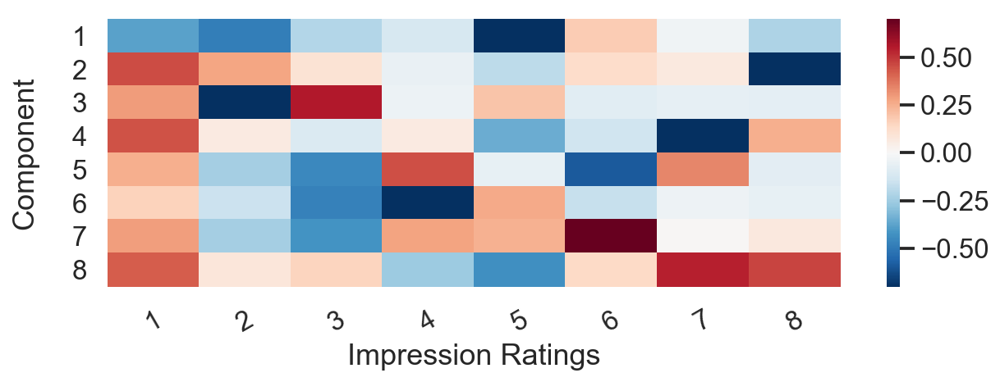

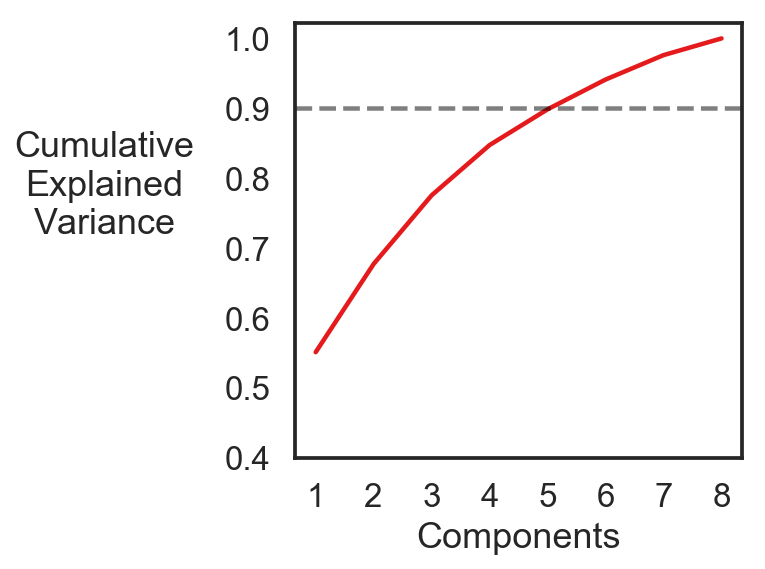

In [87]:
imp_long = pd.pivot_table(beh_dat, values=['rating'], columns=['dimension'], index=['subject_id','character','episode']).reset_index(drop=True)
# Get Dyads
X = beh_dat.pivot_table(
    index=['subject_id','character','episode'],
    columns=['dimension'],
    values='rating').loc[alldyads]

# demean per subject across episodes
X_demeaned = X - X.groupby('subject_id').mean() 
from sklearn.decomposition import PCA
n_components = 8
pca = PCA(n_components=n_components,random_state=0)
pca.fit(X_demeaned.loc[:,dims].as_matrix())
print(pca.explained_variance_ratio_)
print(np.cumsum(pca.explained_variance_ratio_))

f,ax = plt.subplots(figsize=(10,3))
sns.heatmap(-pca.components_.T, xticklabels=range(1,1+n_components), yticklabels= dims, 
            annot=False,ax=ax,fmt='.2f', cmap = 'RdBu_r', vmin=-.7, vmax=.7)
ax.set_yticklabels(range(1,1+n_components),rotation=0)
ax.set_xticklabels(ax.get_xticklabels(),rotation=30)
plt.ylabel('Component', rotation=90, labelpad=20)
plt.xlabel('Impression Ratings')
# plt.title('PCA loadings\n')
plt.show()

sns.set_style('white')
f,ax = plt.subplots(figsize=(4,4))
plt.plot(range(1,1+n_components),np.cumsum(pca.explained_variance_ratio_))
plt.axhline(.9, linestyle='--',alpha=.5, color='k')
plt.ylabel('Cumulative\nExplained\nVariance', rotation=0, labelpad=60)
ax.set(xlabel='Components',
       yticks=np.arange(.4,1.1,.1),xticks=np.arange(1,n_components+1,1))
# plt.title('Explained variance for each component\n', pad=1.08)
plt.show()

/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/numpy/lib/type_check.py:546: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead
  'a.item() instead', DeprecationWarning, stacklevel=1)


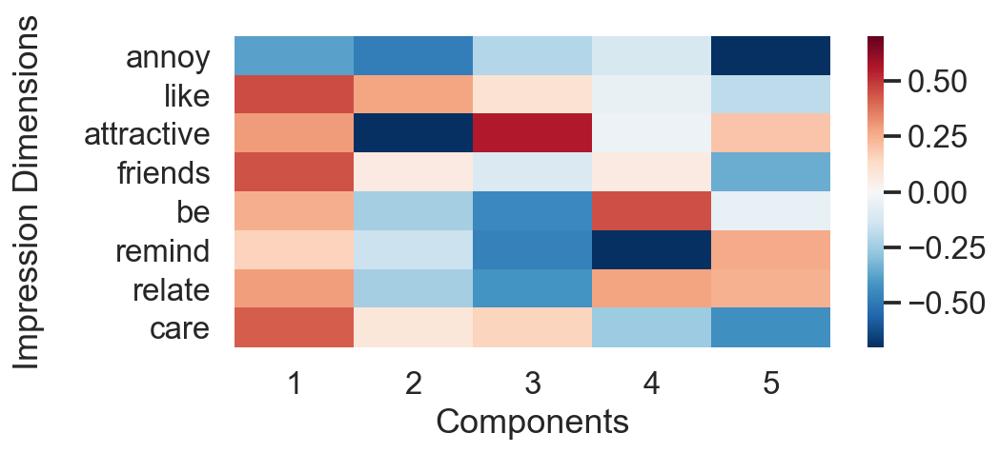

In [243]:
f,ax = plt.subplots(figsize=(7,3))
sns.heatmap(-pca.components_.T[:,:5], xticklabels=range(1,1+5), yticklabels= dims, 
            annot=False,ax=ax,fmt='.2f', cmap = 'RdBu_r', vmin=-.7, vmax=.7)
ax.set_xticklabels(range(1,1+5),rotation=0)
ax.set_yticklabels(ax.get_yticklabels(),rotation=0)
plt.ylabel('Impression Dimensions', rotation=90, labelpad=20)
plt.xlabel('Components')
# plt.title('PCA loadings\n')
plt.show()

In [88]:
'''
Calculate similarity between members of a dyad per PC dimension
'''
pca = PCA(n_components=n_components,random_state=0)
pca.fit(X_demeaned.loc[:,dims].as_matrix())
pca.components_ = -pca.components_
pcaX = pd.DataFrame(pca.transform(X_demeaned.loc[:,dims].as_matrix()))
pcaX.index = X_demeaned.index
pcaX = pcaX.reset_index()

pcadf = pd.DataFrame()
for episode in [1,2,3,4]:
    _pcadf = pd.DataFrame()
    for pc in range(n_components):
        pc_pairs = parse_triangle(pd.pivot_table(pcaX.query('episode==@episode'), values=pc, index=['subject_id'], columns='character').T.corr(), condition='pairs')
        _pcadf = pd.concat([_pcadf, pd.DataFrame(pc_pairs, columns=[pc])], axis=1)
#     _pcadf['Episode'] = f'ep0{episode}'
    pcadf = pd.concat([pcadf, _pcadf]).reset_index(drop=True)
pcadf.columns = [f"PC{i}" for i in range(n_components)]
# Attach to existing dataframe. 
# combined_r_df = pd.concat([combined_r_df, pcadf],axis=1)
# for pci in range(5):
#     combined_r_df[f'PC{pci}_dm']=combined_r_df[f'PC{pci}']-combined_r_df[f'PC{pci}'].mean()
#     combined_r_df[f'PC{pci}_st']=(combined_r_df[f'PC{pci}']-combined_r_df[f'PC{pci}'].mean())/combined_r_df[f'PC{pci}'].std()

In [ ]:
# plot correlation between connection~ and PC for every PCC 
f,ax = plt.subplots(5,4, figsize=(15,15))
ax = ax.flatten()
i=0
for pci in range(5):
    for epn in epns:
        x = combined_r_df.query('Episode==@epn')[f'PC{pci}']
        y = combined_r_df.query('Episode==@epn').mean_Connection
        r, p = stats.spearmanr(x, y)
        sns.regplot(x,y,ax=ax[i])
        ax[i].set(title=f"{epn} r:{r:.2f} p:{p:.3f}")
        i+=1
plt.tight_layout()

In [ ]:
%%R -i combined_r_df
m <- lmer('mean_Connection~PC0+PC1+PC2+PC3+PC4+(1|dyadID)', data=combined_r_df)
coef(summary(m))

m <- lmer('mean_Connection~PC0+PC1+PC2+PC3+PC4+Episode_c+(1|dyadID)', data=combined_r_df)
coef(summary(m))

In [91]:
'''
Calculate similarity between members of a dyad per character ACROSS 5PC. 
Then average into single score.
'''
num_pc_for_estimation = 5
pcadf = pd.DataFrame()
for episode in [1,2,3,4]:
    _pcadf = pd.DataFrame()
    for char in char_list:
        char_sim_pairs = parse_triangle(pd.pivot_table(pcaX.query('episode==@episode and character==@char'), 
                                                       values=range(0,num_pc_for_estimation), index=['subject_id'], 
                                                       columns='character').T.corr(), condition='pairs')
        _pcadf = pd.concat([_pcadf, pd.DataFrame(char_sim_pairs, columns=[char])], axis=1)
    pcadf = pd.concat([pcadf, pd.DataFrame(_pcadf.mean(axis=1),columns=['AvgCharSim'])]).reset_index(drop=True)
pcadf['AvgCharSim_dm'] = pcadf['AvgCharSim'] -pcadf['AvgCharSim'].mean()
pcadf['AvgCharSim_st'] = (pcadf['AvgCharSim'] -pcadf['AvgCharSim'].mean())/pcadf['AvgCharSim'].std()
combined_r_df['AvgCharSim'] = pcadf['AvgCharSim']
combined_r_df['AvgCharSim_dm'] = pcadf['AvgCharSim_dm']
combined_r_df['AvgCharSim_st'] = pcadf['AvgCharSim_st']


In [402]:
'''For ALONE subjects for comparison.
Dyad ~ Alone impression similarity not different. 
'''
# get alone data
X = beh_dat.pivot_table(
    index=['subject_id','character','episode'],
    columns=['dimension'],
    values='rating').loc[alone_sublist]
# demean per subject across episodes
X_demeaned = X - X.groupby('subject_id').mean() 

pcaX = pd.DataFrame(pca.transform(X_demeaned.loc[:,dims].as_matrix()))
pcaX.index = X_demeaned.index
pcaX = pcaX.reset_index()

pcadf = pd.DataFrame()
for episode in [1,2,3,4]:
    _pcadf = pd.DataFrame()
    for char in char_list:
        char_sim_pairs = parse_triangle(pd.pivot_table(pcaX.query('episode==@episode and character==@char'), 
                                                       values=range(0,num_pc_for_estimation), index=['subject_id'], 
                                                       columns='character').T.corr(), condition='upper')
        _pcadf = pd.concat([_pcadf, pd.DataFrame(char_sim_pairs, columns=[char])], axis=1)
    # get subID index for lmer
    forsubid = squareform(_pcadf.iloc[:,0])
    forsubid[np.diag_indices(len(forsubid))] = 1
    sub1 = parse_triangle(pd.DataFrame(forsubid).apply(lambda x: x.index),condition='upper')
    sub2 = parse_triangle(pd.DataFrame(forsubid).apply(lambda x: x.index).T,condition='upper')
    pcadf = pd.concat([pcadf, 
                       pd.concat([pd.DataFrame(_pcadf.mean(axis=1), columns=['AvgCharSim']), 
                                  pd.DataFrame({'Episode':np.repeat(f"ep0{episode}",210),
                                               'Sub1':sub1, 'Sub2':sub2 })], axis=1) ,
                       ]).reset_index(drop=True)
pcadf['AvgCharSim_dm'] = pcadf['AvgCharSim'] - pcadf['AvgCharSim'].mean()
pcadf['AvgCharSim_st'] = (pcadf['AvgCharSim'] - pcadf['AvgCharSim'].mean())/pcadf['AvgCharSim'].std()

for epn in epns:
    a = pcadf.query('Episode==@epn').AvgCharSim # alone average charsim
    b = combined_r_df.query('Episode==@epn').AvgCharSim
    t,p = stats.ttest_ind(b,a, equal_var=False)
    print(epn, t, p)

/Users/jinhyuncheong/anaconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:12: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  if sys.path[0] == '':
/Users/jinhyuncheong/Dropbox/Packages/fnl_tools/fnl_tools/utils.py:117: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  df = df.as_matrix()


ep01 -0.345989143737158 0.7316572402929564
ep02 2.5428228316109824 0.01587470076689153
ep03 -0.4623831267474885 0.6465558373890925
ep04 1.9474710668898174 0.05963338819818861


In [ ]:
# Test if alone subjects impression similarity is also increasing
pcadf['Episode_c'] = pcadf['Episode'].apply(lambda x: int(x[-1])-2.5)
_pcadf = pcadf.copy()
_pcadf['Sub1'] = pcadf['Sub2']
_pcadf['Sub2'] = pcadf['Sub1']
pcadf = pd.concat([pcadf,_pcadf],axis=0).reset_index(drop=True)

In [404]:
%%R -i pcadf
# Test if alone subjects impression similarity is also increasing
library(lmerTest)
pcadf$Sub1 <- as.factor(pcadf$Sub1)
pcadf$Sub2 <- as.factor(pcadf$Sub2)

m <- lmer('AvgCharSim ~  Episode_c + (1+Episode_c |Sub1) + (1+Episode_c |Sub2)', data = pcadf, 
          control = lmerControl(optimizer ="Nelder_Mead"))
summary(m)

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: "AvgCharSim ~  Episode_c + (1+Episode_c |Sub1) + (1+Episode_c |Sub2)"
   Data: pcadf
Control: lmerControl(optimizer = "Nelder_Mead")

REML criterion at convergence: -2214.7

Scaled residuals: 
   Min     1Q Median     3Q    Max 
-3.075 -0.698  0.028  0.679  3.786 

Random effects:
 Groups   Name        Variance Std.Dev. Corr
 Sub1     (Intercept) 0.002645 0.0514       
          Episode_c   0.000521 0.0228   0.04
 Sub2     (Intercept) 0.002645 0.0514       
          Episode_c   0.000521 0.0228   0.04
 Residual             0.013982 0.1182       
Number of obs: 1680, groups:  Sub1, 21; Sub2, 21

Fixed effects:
            Estimate Std. Error      df t value            Pr(>|t|)    
(Intercept)   0.2876     0.0161 37.3132   17.83 <0.0000000000000002 ***
Episode_c     0.0182     0.0075 31.2691    2.43               0.021 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Corr

In [405]:
tt = 2.43
n = 31.2691/2
pval = stats.t.sf(np.abs(tt), n-1)*2 
print(pval, n)

0.028479003525015992 15.63455


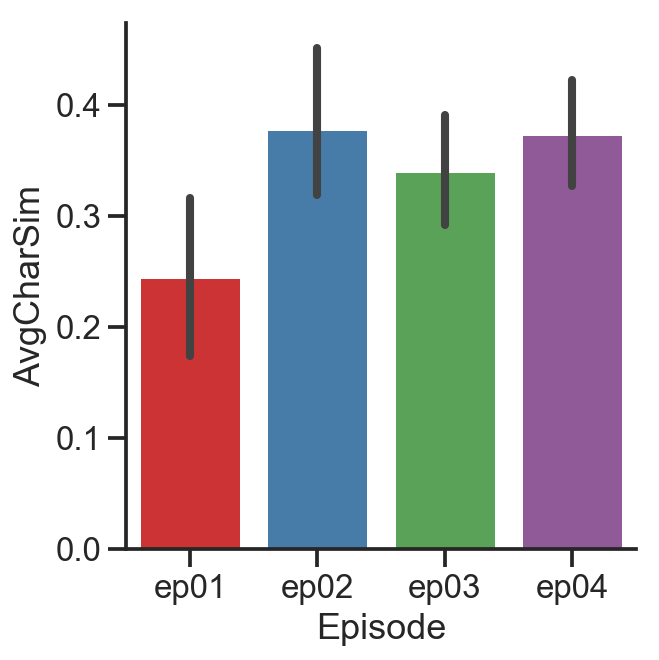

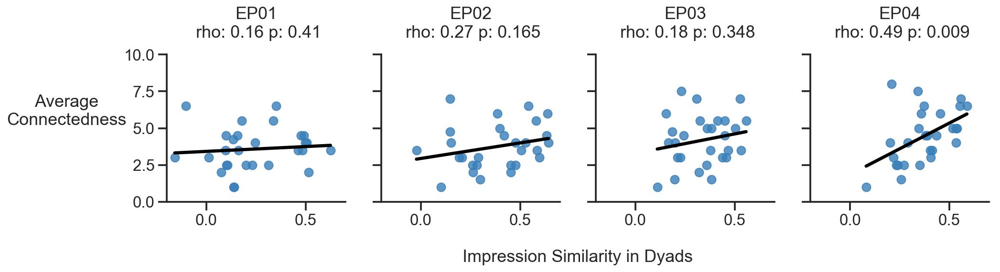

<Figure size 360x360 with 0 Axes>

In [40]:
sns.catplot(x='Episode',y='AvgCharSim',data=combined_r_df, kind='bar')
exclude_friends=False
f,ax = plt.subplots(1,len(epns),figsize=(15,5),sharex=True,sharey=True)
ax[0].set_ylim([0,10])
ax[0].set_xlim([-.2,.7])
for epi, epn in enumerate(epns):
    dyadcorr = combined_r_df.query('Episode==@epn').AvgCharSim
    dyadconn = combined_r_df.query('Episode==@epn').mean_Connection
    if exclude_friends:
        # Results similar for both episode 1&2
        dyadcorr = dyadcorr[dyads_friends_bool]
        dyadconn = dyadconn[dyads_friends_bool]
    r,p = stats.spearmanr(dyadcorr,dyadconn)
    ax[epi].set(title = f"{epn} {r:.2f} p:{p:.3f}")
    ax[epi].set_title(epn.upper()+'\n rho: '+ str(np.round(r,2))  +' p: ' + str(np.round(p,3)),y=1.08)
    sns.regplot(y = dyadconn,x = dyadcorr,ax=ax[epi],color='k',ci=False,truncate=True,scatter_kws={'color':colors[1]})
    ax[epi].set_ylabel('')
    ax[epi].set_xlabel('')

ax[0].set_ylabel('Average\nConnectedness',rotation=0,labelpad=60)
# for common label
f.add_subplot(111, frameon=False)
# plt.tick_params(which='both',labelcolor='none', top='off', bottom='off', left='off', right='off')
plt.gca().xaxis.set_major_locator(plt.NullLocator())
plt.gca().yaxis.set_major_locator(plt.NullLocator())
plt.grid(False)
plt.xlabel(f'Impression Similarity in Dyads',rotation=0,labelpad=50)
sns.despine()
plt.tight_layout()
# f.savefig('Figures/Synchrony_corr_connectedness.pdf',dpi=300)
plt.show()    
    
plt.tight_layout()

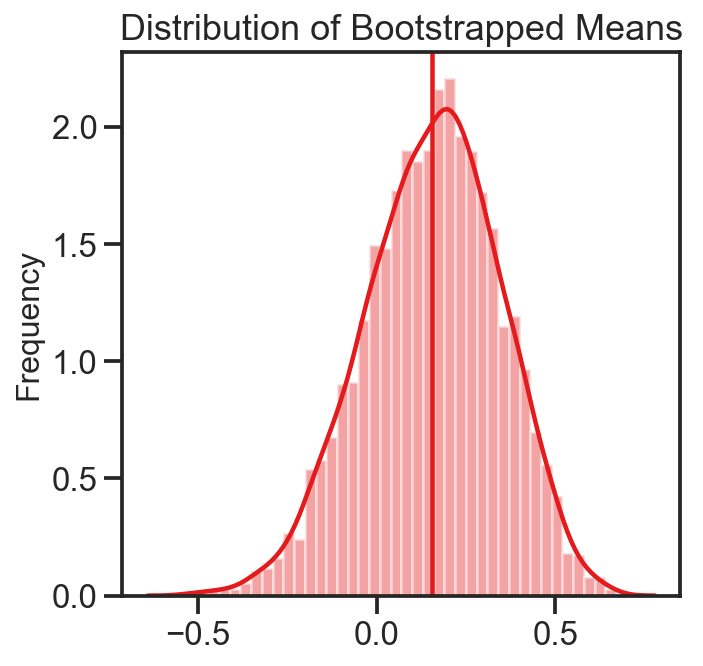

Bootstrapped Mean: 0.156
Bootstrapped Std: 0.188
95% Confidence Intervals: [-0.229, 0.499]


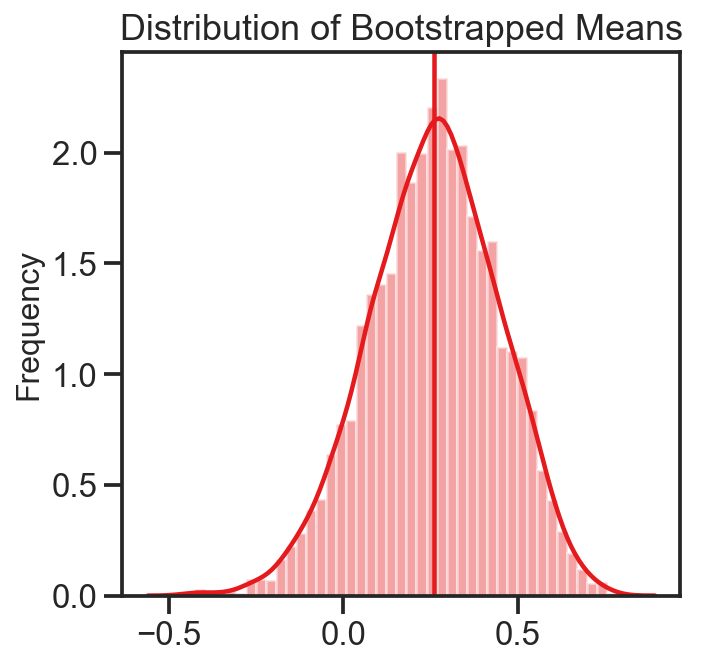

Bootstrapped Mean: 0.259
Bootstrapped Std: 0.186
95% Confidence Intervals: [-0.12, 0.604]


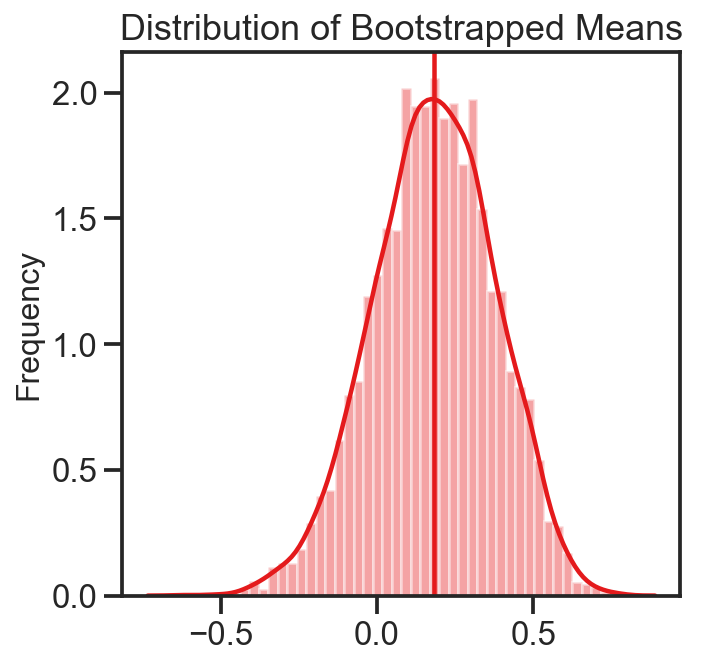

Bootstrapped Mean: 0.182
Bootstrapped Std: 0.194
95% Confidence Intervals: [-0.208, 0.54]


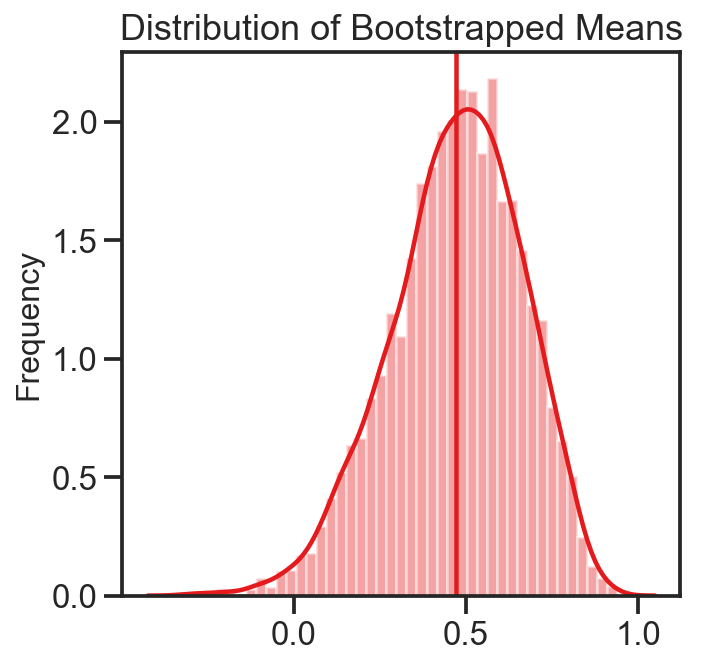

Bootstrapped Mean: 0.472
Bootstrapped Std: 0.19
95% Confidence Intervals: [0.0733, 0.8]


In [45]:
exclude_friends=False
for epi, epn in enumerate(epns):
    dyadcorr = combined_r_df.query('Episode==@epn').AvgCharSim
    dyadconn = combined_r_df.query('Episode==@epn').mean_Connection
    if exclude_friends:
        # Results similar for both episode 1&2
        dyadcorr = dyadcorr[dyads_friends_bool]
        dyadconn = dyadconn[dyads_friends_bool]
    r,p = stats.spearmanr(dyadcorr,dyadconn)
    bootstrap_means = []
    for i in range(5000):
        new_indices = np.random.choice(indices, size=len(indices), replace=True)
        r, p = stats.spearmanr(dyadconn.values[new_indices], dyadcorr.values[new_indices])
        bootstrap_means.append(r)
    
    sns.distplot(bootstrap_means, kde=True, label='Bootstrap')
    plt.axvline(x=np.mean(bootstrap_means), ymin=0, ymax=1, linestyle='-')
    plt.title('Distribution of Bootstrapped Means', fontsize=18)
    plt.ylabel('Frequency', fontsize=16)
    plt.show()

    lower_bound = np.percentile(bootstrap_means, 2.5)
    upper_bound = np.percentile(bootstrap_means, 97.5)
    print(f'Bootstrapped Mean: {np.mean(bootstrap_means):.3}')
    print(f'Bootstrapped Std: {np.std(bootstrap_means):.3}')
    print(f'95% Confidence Intervals: [{lower_bound:.3}, {upper_bound:.3}]')

In [426]:
%%R -i combined_r_df
# CHARSIM EFFECT
m<- lmer(' mean_Connection ~ AvgCharSim * Episode_c + (1|dyadID) ', data=combined_r_df )
print(summary(m))
# # print(coef(summary(m)))
# m<- lmer(' AvgCharSim ~ Episode_c + (1|dyadID) ', data=combined_r_df )
# print(summary(m))

Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: " mean_Connection ~ AvgCharSim * Episode_c + (1|dyadID) "
   Data: combined_r_df

REML criterion at convergence: 253.3

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.0224 -0.6062 -0.0359  0.5610  2.2822 

Random effects:
 Groups   Name        Variance Std.Dev.
 dyadID   (Intercept) 2.301    1.517   
 Residual             0.214    0.463   
Number of obs: 112, groups:  dyadID, 28

Fixed effects:
                     Estimate Std. Error     df t value          Pr(>|t|)    
(Intercept)             3.641      0.325 41.037   11.20 0.000000000000047 ***
AvgCharSim              1.010      0.421 85.385    2.40             0.018 *  
Episode_c               0.168      0.105 82.696    1.59             0.115    
AvgCharSim:Episode_c    0.339      0.286 82.581    1.18             0.240    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of Fixed Effects:
   

In [460]:
%%R -i combined_r_df
# CHARSIM EFFECT
m<- lmer(' mean_Connection ~ AvgCharSim_dm * Episode_c + (1|dyadID) ', data=combined_r_df )
print(coef(summary(m)))
m<- lmer(' mean_Connection ~ Positive_dm * Episode_c + (1|dyadID) ', data=combined_r_df )
print(coef(summary(m)))
m<- lmer(' mean_Connection ~ Spatial_SRM0_dm * Episode_c  + (1|dyadID) ', data=combined_r_df )
print(coef(summary(m)))
# TIME EFFECT
m<- lmer(' AvgCharSim ~ Episode_c + (1|dyadID) ', data=combined_r_df )
print(coef(summary(m)))
# WITH OTHERS
m<- lmer(' mean_Connection ~ mean_Enjoy_st +Positive_st*Episode_c + Spatial_SRM0_st + AvgCharSim_st + Episode_c + (1|dyadID) ', data=combined_r_df )
print(summary(m))
# Predict Enjoyment
m<- lmer(' mean_Enjoy_st ~  Positive_st*Episode_c + Spatial_SRM0_st + AvgCharSim_st + Episode_c + (1|dyadID) ', data=combined_r_df )
print(summary(m))

                        Estimate Std. Error     df t value           Pr(>|t|)
(Intercept)              3.97854   0.290227 26.959 13.7084 0.0000000000001143
AvgCharSim_dm            1.01001   0.420542 85.385  2.4017 0.0184886081330489
Episode_c                0.28145   0.041208 81.324  6.8300 0.0000000014111992
AvgCharSim_dm:Episode_c  0.33934   0.286452 82.581  1.1846 0.2395579131528732
                      Estimate Std. Error     df t value             Pr(>|t|)
(Intercept)            3.97107   0.270539 26.076 14.6783 0.000000000000040574
Positive_dm            1.04450   0.310792 87.760  3.3608 0.001152378142336323
Episode_c              0.24891   0.041095 81.062  6.0571 0.000000041363738694
Positive_dm:Episode_c  0.38441   0.178216 80.689  2.1570 0.033983627814916102
                          Estimate Std. Error     df  t value
(Intercept)               3.991875   0.291337 26.915 13.70192
Spatial_SRM0_dm           0.277276   0.150010 82.570  1.84838
Episode_c                 0.285975

In [796]:
for epn in epns: 
    r,p = stats.spearmanr(combined_r_df.query('Episode==@epn').Positive,
                          combined_r_df.query('Episode==@epn').Spatial_SRM0)
    print(r,p)

0.15489874110563767 0.43125528483288955
0.3711001642036125 0.05186959634466521
0.5062944718117133 0.005976865646059848
0.43459222769567596 0.02083313035682829


## Structural Equation modeling

In [ ]:
%reload_ext rpy2.ipython

In [ ]:
%%R
require('lme4')
require('lmerTest')
require('lattice')
require('boot')
# require('sjPlot')
require('optimx')
options("scipen"=15, "digits"=5)
r2 <- function(m) {
  lmfit <-  lm(model.response(model.frame(m)) ~ fitted(m))
#   summary(lmfit)$r.squared
  summary(lmfit)$adj.r.squared
}

lavaan 0.6-4 ended normally after 92 iterations

  Optimization method                           NLMINB
  Number of free parameters                         14

  Number of observations                           112

  Estimator                                         ML
  Model Fit Test Statistic                       3.330
  Degrees of freedom                                 1
  P-value (Chi-square)                           0.068

Model test baseline model:

  Minimum Function Test Statistic              104.758
  Degrees of freedom                                10
  P-value                                        0.000

User model versus baseline model:

  Comparative Fit Index (CFI)                    0.975
  Tucker-Lewis Index (TLI)                       0.754

Loglikelihood and Information Criteria:

  Loglikelihood user model (H0)               -339.390
  Loglikelihood unrestricted model (H1)       -337.725

  Number of free parameters                         14
  Akaike (AIC)  

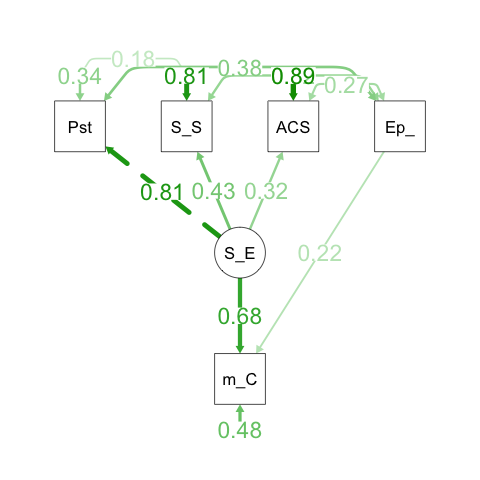

In [280]:
%%R -i combined_r_df
library(lavaan)
library(semPlot)
model <-'
          # measurement model 
          Sh_Exp =~  Positive + Spatial_SRM0 + AvgCharSim 
          # Regression part
          mean_Connection ~ Sh_Exp + Episode_c
          # Covariance residual correlations
          Positive ~~ Spatial_SRM0 
          Episode_c ~~ Positive + Spatial_SRM0 + AvgCharSim 
        '
fit <- sem(model, data=combined_r_df)
summary(fit, standardized=TRUE, fit.measure=TRUE)
semPaths(fit,"std", style='lisrel',layout='tree',edge.label.cex=2.0, curvePivot = TRUE, residuals=TRUE, title=TRUE,sizeMan = 10, sizeLat = 10, sizeInt = 4)
standardizedSolution(fit)
print(fitMeasures(fit,c('chisq','df','pvalue','rfi','cfi','ifi','gfi','nfi','nnfi','rmsea','rmsea.ci.lower','rmsea.ci.upper','rmsea.pvalue','srmr')))
print(inspect(fit, "sample"))
print(inspect(fit, "fitted"))
print(residuals(fit, type="cor"))


# put tempsync, spatialsync, impsync together

In [1241]:
combined_r_df = pd.read_csv('combined_df.csv', index_col=0)
# Demeaned
combined_r_df['Positive_dm']=combined_r_df.Positive-combined_r_df.Positive.mean()
combined_r_df['Negative_dm']=combined_r_df.Negative-combined_r_df.Negative.mean()
combined_r_df['mean_Enjoy_dm']=combined_r_df.mean_Enjoy-combined_r_df.mean_Enjoy.mean()
combined_r_df['ImpSim_dm']=combined_r_df.ImpSim-combined_r_df.ImpSim.mean()
combined_r_df['AverageAUSim_dm']=combined_r_df.AverageAUSim-combined_r_df.AverageAUSim.mean()
combined_r_df['Spatial_SRM0_dm']=combined_r_df.Spatial_SRM0-combined_r_df.Spatial_SRM0.mean()
combined_r_df['Spatial_SRM1_dm']=combined_r_df.Spatial_SRM1-combined_r_df.Spatial_SRM1.mean()
combined_r_df['Temporal_SRM0_dm']=combined_r_df.Temporal_SRM0-combined_r_df.Temporal_SRM0.mean()
combined_r_df['Temporal_SRM1_dm']=combined_r_df.Temporal_SRM1-combined_r_df.Temporal_SRM1.mean()
# # Standardized
combined_r_df['Positive_st']=(combined_r_df.Positive-combined_r_df.Positive.mean() )/ combined_r_df.Positive.std()
combined_r_df['Negative_st']=(combined_r_df.Negative-combined_r_df.Negative.mean()) /combined_r_df.Negative.std() 
combined_r_df['mean_Enjoy_st']=(combined_r_df.mean_Enjoy-combined_r_df.mean_Enjoy.mean()) /combined_r_df.mean_Enjoy.std() 
combined_r_df['ImpSim_st']=(combined_r_df.ImpSim-combined_r_df.ImpSim.mean() )/ combined_r_df.ImpSim.std()
combined_r_df['AverageAUSim_st']=(combined_r_df.AverageAUSim-combined_r_df.AverageAUSim.mean()) /combined_r_df.AverageAUSim.std()
combined_r_df['Spatial_SRM0_st']=(combined_r_df.Spatial_SRM0-combined_r_df.Spatial_SRM0.mean())/combined_r_df.Spatial_SRM0.std()
combined_r_df['Spatial_SRM1_st']=(combined_r_df.Spatial_SRM1-combined_r_df.Spatial_SRM1.mean())/combined_r_df.Spatial_SRM1.std()
combined_r_df['Temporal_SRM0_st']=(combined_r_df.Temporal_SRM0-combined_r_df.Temporal_SRM0.mean())/combined_r_df.Temporal_SRM0.std()
combined_r_df['Temporal_SRM1_st']=(combined_r_df.Temporal_SRM1-combined_r_df.Temporal_SRM1.mean())/combined_r_df.Temporal_SRM1.std()
# Center episode
combined_r_df['Episode_c'] = combined_r_df.Episode.apply(lambda x: int(x[-1])-2.5)
combined_r_df['Episode_st'] = (combined_r_df.Episode_c-combined_r_df.Episode_c.mean()) /combined_r_df.Episode_c.std()

In [1110]:
%%R -i combined_r_df
m <- lmer('mean_Connection ~ Positive_dm * Episode_c + (1|dyadID)', data=combined_r_df)
print(coef(summary(m)))
m <- lmer('mean_Connection ~ Spatial_SRM0_dm * Episode_c  +(1|dyadID)', data=combined_r_df)
print(coef(summary(m)))
m <- lmer('mean_Connection ~ ImpSim_dm * Episode_c  +(1|dyadID)', data=combined_r_df)
print(coef(summary(m)))
m <- lmer('mean_Connection ~ mean_Enjoy_dm * Episode_c  +(1|dyadID)', data=combined_r_df)
print(coef(summary(m)))

                      Estimate Std. Error     df t value             Pr(>|t|)
(Intercept)            3.97107   0.270539 26.076 14.6783 0.000000000000040574
Positive_dm            1.04450   0.310792 87.760  3.3608 0.001152378142336323
Episode_c              0.24891   0.041095 81.062  6.0571 0.000000041363738694
Positive_dm:Episode_c  0.38441   0.178216 80.689  2.1570 0.033983627814916102
                          Estimate Std. Error     df  t value
(Intercept)               3.991875   0.291337 26.915 13.70192
Spatial_SRM0_dm           0.277276   0.150010 82.570  1.84838
Episode_c                 0.285975   0.042718 80.987  6.69444
Spatial_SRM0_dm:Episode_c 0.014031   0.116060 81.448  0.12089
                                     Pr(>|t|)
(Intercept)               0.00000000000011874
Spatial_SRM0_dm           0.06812718816818175
Episode_c                 0.00000000260708096
Spatial_SRM0_dm:Episode_c 0.90407455610824394
                    Estimate Std. Error     df  t value            Pr(